<a href="https://colab.research.google.com/github/Aeunal/Customer-Churn-XAI/blob/main/CustomerChurn_XAI_Experiment.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Customer Churn Analysis with Explainable AI

## $\color{lightgreen}{\text{Introduction}}$  

One of the key goals of businesses is to hold on to current customers, especially after gaining the main customer base. The sales department should know how to lower the churn rates without affecting the business negatively [1, 2, 3]. We will develop this tool for making it easier for a sales department of a company to analyze customer churn by providing descriptions of the reasons for the churn. This tool may also help the companies to create strategic moves to optimize the value of company gain and customer churn rate.


### Kaggle Connection



In [ ]:
from google.colab import files
secret = files.upload()
print("Added kaggle.json which was downloaded from Kaggle account page")

Saving kaggle.json to kaggle (3).json
Added kaggle.json which was downloaded from Kaggle account page


In [ ]:
! pip install -q kaggle
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

mkdir: cannot create directory ‘/root/.kaggle’: File exists


[Reference-1](https://neptune.ai/blog/how-to-implement-customer-churn-prediction)

### Importing $\color{lightblue}{\text{Libraries}}$  
- Numpy
- Pandas
- Plotly
- Matplotlib
- tqdm

In [ ]:
#Import libraries
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
pd.set_option('display.max_columns', None)

import plotly.express as px #for visualization
import matplotlib.pyplot as plt #for visualization 

from tqdm import tqdm

##### Interactivity Libraries

In [ ]:
from __future__ import print_function
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets

## $\color{lightgreen}{\text{Dataset:}}$ 
### Inputs, Label, Appropriate ML performance metrics, etc.

In this study, a customer churn prediction dataset has been utilized. The dataset is available in Kaggle.  
The utilized dataset belongs to a fictional company Telco. The dataset is developed by the IBM Developer Platform.

### $\color{lightblue}{\text{Getting the Data}}$ 

We have three different data sources but we will be using only the first one for now, as an improvement we are planning to try the models in different customer churn datasets

#### Getting data from Kaggle

In [ ]:
!mkdir data -p

In [ ]:
!unzip -o /content/archive.zip -d data/telco-customer-churn

Archive:  /content/archive.zip
  inflating: data/telco-customer-churn/WA_Fn-UseC_-Telco-Customer-Churn.csv  


In [ ]:
data1 = pd.read_csv("data/telco-customer-churn/WA_Fn-UseC_-Telco-Customer-Churn.csv")

In [ ]:
# Dataset - 1 (Used)
! kaggle datasets download -d blastchar/telco-customer-churn --force
! mkdir data/telco-customer-churn -p
! unzip -o telco-customer-churn.zip -d data/telco-customer-churn
# data_df = pd.read_csv("https://raw.githubusercontent.com/carlosfab/dsnp2/master/datasets/WA_Fn-UseC_-Telco-Customer-Churn.csv")
# data_df.head() # This is same as above

data1 = pd.read_csv("data/telco-customer-churn/WA_Fn-UseC_-Telco-Customer-Churn.csv")

401 - Unauthorized
unzip:  cannot find or open telco-customer-churn.zip, telco-customer-churn.zip.zip or telco-customer-churn.zip.ZIP.


In [ ]:
# Dataset - 2
! kaggle datasets download -d becksddf/churn-in-telecoms-dataset
! mkdir data/churn-in-telecoms-dataset -p
! unzip -o churn-in-telecoms-dataset.zip -d data/churn-in-telecoms-dataset

data2 = pd.read_csv("data/churn-in-telecoms-dataset/bigml_59c28831336c6604c800002a.csv")

401 - Unauthorized
unzip:  cannot find or open churn-in-telecoms-dataset.zip, churn-in-telecoms-dataset.zip.zip or churn-in-telecoms-dataset.zip.ZIP.


FileNotFoundError: ignored

In [ ]:
# Dataset - 3
! kaggle datasets download -d jpacse/datasets-for-churn-telecom
! mkdir data/churndatasets-for-churn-telecom -p
! unzip -o datasets-for-churn-telecom.zip -d data/datasets-for-churn-telecom

data3 = pd.read_csv("data/datasets-for-churn-telecom/cell2celltrain.csv")

#### Data Descriptions

The dataset consists of 7043 individual client data each having 20 features. The output label is churn or not churn in the previous month.
The list of the features and their types and values are given below

In [ ]:
def dataoveriew(df, message):
    print(f'{message}:\n')
    print('Number of rows: ', df.shape[0])
    print("Number of features:", df.shape[1])
    #print(f"Data Features:{df.columns.tolist()}")
    print("Missing values:", df.isnull().sum().values.sum())
    print("\nUnique values:")
    print(df.nunique())

In [ ]:
dataoveriew(data1, 'Overview of the dataset-1')
data1.head()

Overview of the dataset-1:

Number of rows:  7043
Number of features: 21
Missing values: 0

Unique values:
customerID          7043
gender                 2
SeniorCitizen          2
Partner                2
Dependents             2
tenure                73
PhoneService           2
MultipleLines          3
InternetService        3
OnlineSecurity         3
OnlineBackup           3
DeviceProtection       3
TechSupport            3
StreamingTV            3
StreamingMovies        3
Contract               3
PaperlessBilling       2
PaymentMethod          4
MonthlyCharges      1585
TotalCharges        6531
Churn                  2
dtype: int64


,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


##### Other Datasets

In [ ]:
dataoveriew(data2, 'Overview of the dataset-2')
data2.head()

NameError: ignored

In [ ]:
dataoveriew(data3, 'Overview of the dataset-3')
data3.head()

NameError: ignored

##### Selected data:

In [ ]:
data_df = data1 # First dataset is selected for now

#### Data Info

There are 17 categorical and 3 numerical features. 

The distribution of the label we want to predict through the entire dataset can be seen in the figure below.


In [ ]:
data_df.dtypes

customerID           object
gender               object
SeniorCitizen         int64
Partner              object
Dependents           object
tenure                int64
PhoneService         object
MultipleLines        object
InternetService      object
OnlineSecurity       object
OnlineBackup         object
DeviceProtection     object
TechSupport          object
StreamingTV          object
StreamingMovies      object
Contract             object
PaperlessBilling     object
PaymentMethod        object
MonthlyCharges      float64
TotalCharges         object
Churn                object
dtype: object

###### Simple Data Edit and Feature preperations




In [ ]:
# The customerID column isnt useful as the feature is used for identification of customers. 
data_df.drop(["customerID"],axis=1,inplace = True)

In [ ]:
#SeniorCitizen feature plot 
data_df.loc[data_df.SeniorCitizen==0,'SeniorCitizen'] = "No"   #convert 0 to No in all data instances
data_df.loc[data_df.SeniorCitizen==1,'SeniorCitizen'] = "Yes"  #convert 1 to Yes in all data instances

In [ ]:
try:
    data_df['TotalCharges'] = data_df['TotalCharges'].astype(float)
except ValueError as ve:
    print (ve, "Fixing...")
    data_df['TotalCharges'] = pd.to_numeric(data_df['TotalCharges'],errors='coerce')
    #Fill the missing values with with the median value
    data_df['TotalCharges'] = data_df['TotalCharges'].fillna(data_df['TotalCharges'].median())

could not convert string to float:  Fixing...


In [ ]:
label_name = "Churn"
unique_features = data_df.nunique() < 8 # uniqueness threshold is selected as 8

categorical_columns = data_df.columns[unique_features.values].values
label_idx = np.where(categorical_columns==label_name)[0][0]
categorical_columns[0], categorical_columns[label_idx] = categorical_columns[label_idx], categorical_columns[0] # Put label to beginning

numerical_columns = data_df.columns[np.invert(unique_features).values].values

In [ ]:
data_df

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,Female,No,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,Male,No,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,Male,No,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,Male,No,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,Female,No,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,Male,No,Yes,Yes,24,Yes,Yes,DSL,Yes,No,Yes,Yes,Yes,Yes,One year,Yes,Mailed check,84.80,1990.50,No
7039,Female,No,Yes,Yes,72,Yes,Yes,Fiber optic,No,Yes,Yes,No,Yes,Yes,One year,Yes,Credit card (automatic),103.20,7362.90,No
7040,Female,No,Yes,Yes,11,No,No phone service,DSL,Yes,No,No,No,No,No,Month-to-month,Yes,Electronic check,29.60,346.45,No
7041,Male,Yes,Yes,No,4,Yes,Yes,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Mailed check,74.40,306.60,Yes


### $\color{lightblue}{\text{Data Visualizations}}$

Gender and partner features are somewhat evenly distributed. Also, younger, single customers, and the customers without dependents are more inclined to churn. While investigating the utilized services, it can be said that customers who possess OnlineSecurity, OnlineBackup, DeviceProtection, and TechSupport are more prone to not churn. And churn prediction cannot be implemented from StreamingTV and StreamingMovie since those values are evenly distributed between churn and not churn. Also, a shorter period of time for the contract to last usually results in churn. Lastly, among all the PaymentMethod, electronic checks are related to the highest churn rate.

##### Draw Pie Chart


In [ ]:
def draw_pie_chart(column_name):
    target_instance = data_df[column_name].value_counts().to_frame()
    target_instance = target_instance.reset_index()
    target_instance = target_instance.rename(columns={'index': 'Category'})
    fig = px.pie(target_instance, values=column_name, names='Category', color_discrete_sequence=["green", "red"],
                title=f'Distribution of {column_name}')
    fig.show()

##### Pie Chart Visualizations

In [ ]:
interact(draw_pie_chart, column_name=categorical_columns);

##### Draw Bar Chart

In [ ]:
def draw_bar_chart(feature, group_by_feature, df=data_df ):
    temp_df = df.groupby([feature, group_by_feature]).size().reset_index()
    temp_df = temp_df.rename(columns={0:'Count'})
    value_counts_df = df[feature].value_counts().to_frame().reset_index()
    categories = [cat[1][0] for cat in value_counts_df.iterrows()]
    num_list = [num[1][1] for num in value_counts_df.iterrows()]
    div_list = [element / sum(num_list) for element in num_list]
    percentage = [round(element * 100,1) for element in div_list]
    def num_format(list_instance):
        formatted_str = ''
        for index,num in enumerate(list_instance):
            if index < len(list_instance)-2:
                formatted_str=formatted_str+f'{num}%, ' 
            elif index == len(list_instance)-2:
                formatted_str=formatted_str+f'{num}% & '
            else:
                formatted_str=formatted_str+f'{num}%'
        return formatted_str
    def str_format(list_instance):
        formatted_str = ''
        for index, cat in enumerate(list_instance):
            if index < len(list_instance)-2:
                formatted_str=formatted_str+f'{cat}, '
            elif index == len(list_instance)-2:
                formatted_str=formatted_str+f'{cat} & '
            else:
                formatted_str=formatted_str+f'{cat}'
        return formatted_str
    num_str = num_format(percentage)
    cat_str = str_format(categories)
    fig = px.bar(temp_df, x=feature, y='Count', color=group_by_feature, title=f'{group_by_feature} rate by {feature}', barmode="group", color_discrete_sequence=["green", "red"])
    fig.add_annotation(
                text=f'Value count of distribution of {cat_str} are<br>{num_str} percentage respectively.',
                align='left',
                showarrow=False,
                xref='paper',
                yref='paper',
                x=1.4,
                y=1.3,
                bordercolor='black',
                borderwidth=1)
    fig.update_layout( margin=dict(r=400))
    return fig.show()

##### Bar Chart Visualizations
* Gender and partner features are approximately evenly distributed.
* Younger, single customers, and the customers without dependents are more inclined to churn.
* OnlineSecurity, OnlineBackup, DeviceProtection, and TechSupport are more prone to not churn.
* A shorter period of time for the contract to last usually results in churn. Among all the PaymentMethod, electronic checks are related to the highest churn rate.

In [ ]:
interact(draw_bar_chart, feature=categorical_columns[1:], group_by_feature=categorical_columns, df=fixed(data_df));

##### Draw Histogram

In [ ]:
# Defining the histogram plotting function
def draw_hist_chart(feature, group_by_feature="Churn"):
    group_df = data_df.groupby([feature, group_by_feature]).size().reset_index()
    group_df = group_df.rename(columns={0: 'Count'})
    fig = px.histogram(group_df, x=feature, y='Count', color=group_by_feature, marginal='box', title=f'{group_by_feature} rate frequency to {feature} distribution', color_discrete_sequence=["green", "red"])
    fig.show()

##### Histogram Visualizations
Histograms of features: tenure, MonthlyCharges and TotalCharges are provided.
* The tenure feature is right-skewed -> the users leave the telecom company usually after 10 months. 
* Higher monthly charges results in churn.

In [ ]:
interact(draw_hist_chart, feature=numerical_columns, group_by_feature=categorical_columns);

##### Binning the numerical features

In [ ]:
bin_df = pd.DataFrame()

bin_df['tenure_bins'] =  pd.qcut(data_df['tenure'], q=3, labels= ['low', 'medium', 'high'])
bin_df['MonthlyCharges_bins'] =  pd.qcut(data_df['MonthlyCharges'], q=3, labels= ['low', 'medium', 'high'])
bin_df['TotalCharges_bins'] =  pd.qcut(data_df['TotalCharges'], q=3, labels= ['low', 'medium', 'high'])
bin_df['Churn'] = data_df['Churn']

##### Binned Numerical Features Bar Chart Visualizations
Plot the bar chart of the binned variables:  
Tenure, MonthlyCharges, and TotalCharges are converted to categorical values of low, medium, and high. 


In [ ]:
interact(draw_bar_chart, feature=bin_df.columns, group_by_feature=["Churn", *bin_df.columns[:-1]], df=fixed(bin_df));

As can be seen from the histograms, the tenure feature is right-skewed which basically means that the users leave the telecom company usually after 10 months. Also, by examining MonthlyCharges, it can be deduced that higher monthly charges are positively correlated with the churn.

###  $\color{lightblue}{\text{Pre-processing the Data}}$   
* The customer churn value which contains the values of Yes/No is encoded into binary. 
* The other categorical values such as SeniorCitizen, Partner, Dependents, PhoneService, PaperlessBilling are encoded into binary. 
* The missing values are replaced with NaN.

#### Encoding Features

Encoding binary features

In [ ]:
def binary_map(feature): # Encode binary data
    return feature.map({'Yes':1, 'No':0})

binary_list = ['SeniorCitizen', 'Partner', 'Dependents', 'PhoneService', 'PaperlessBilling', 'Churn']
data_df[binary_list] = data_df[binary_list].apply(binary_map)

Encoding the other categoric features with more than two categories

In [ ]:
data_df = pd.get_dummies(data_df, drop_first=True)

In [ ]:
data_df.head()

,SeniorCitizen,Partner,Dependents,tenure,PhoneService,PaperlessBilling,MonthlyCharges,TotalCharges,Churn,gender_Male,MultipleLines_No phone service,MultipleLines_Yes,InternetService_Fiber optic,InternetService_No,OnlineSecurity_No internet service,OnlineSecurity_Yes,OnlineBackup_No internet service,OnlineBackup_Yes,DeviceProtection_No internet service,DeviceProtection_Yes,TechSupport_No internet service,TechSupport_Yes,StreamingTV_No internet service,StreamingTV_Yes,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_One year,Contract_Two year,PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
0,0,1,0,1,0,1,29.85,29.85,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0
1,0,0,0,34,1,0,56.95,1889.50,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1
2,0,0,0,2,1,1,53.85,108.15,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1
3,0,0,0,45,0,0,42.30,1840.75,0,1,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0
4,0,0,0,2,1,1,70.70,151.65,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0


#### Corelation

Checking the correlation between features

In [ ]:
corr = data_df.corr()

fig = px.imshow(corr,width=1000, height=1000)
fig.show()

#### Analyze Statistics of the Data

Using Generalized Linear Model (GLM):

In [ ]:
import statsmodels.api as sm
import statsmodels.formula.api as smf

#Change variable name separators to '_'
all_columns = [column.replace(" ", "_").replace("(", "_").replace(")", "_").replace("-", "_") for column in data_df.columns]
data_df.columns = all_columns #Effect the change to the dataframe column names

#Prepare it for the GLM formula
glm_columns = [e for e in all_columns if e not in ['customerID', 'Churn']]
glm_columns = ' + '.join(map(str, glm_columns))

#Fiting it to the Generalized Linear Model
glm_model = smf.glm(formula=f'Churn ~ {glm_columns}', data=data_df, family=sm.families.Binomial())
res = glm_model.fit()
print(res.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  Churn   No. Observations:                 7043
Model:                            GLM   Df Residuals:                     7019
Model Family:                Binomial   Df Model:                           23
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2914.7
Date:                Wed, 12 Jan 2022   Deviance:                       5829.3
Time:                        17:51:33   Pearson chi2:                 8.04e+03
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                                            coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------

(P>|z|): If the absolute p-value is smaller than 0.05, it means that the feature affects Churn in a statistically significant way.

In [ ]:
np.exp(res.params)

Intercept                                2.287343
SeniorCitizen                            1.239957
Partner                                  0.997312
Dependents                               0.857471
tenure                                   0.942322
PhoneService                             1.654668
PaperlessBilling                         1.407543
MonthlyCharges                           0.960432
TotalCharges                             1.000318
gender_Male                              0.978355
MultipleLines_No_phone_service           1.382358
MultipleLines_Yes                        1.563475
InternetService_Fiber_optic              5.771657
InternetService_No                       0.774257
OnlineSecurity_No_internet_service       0.774257
OnlineSecurity_Yes                       0.814269
OnlineBackup_No_internet_service         0.774257
OnlineBackup_Yes                         1.026127
DeviceProtection_No_internet_service     0.774257
DeviceProtection_Yes                     1.159152


Checking exponential coefficient values  
The exponential coefficient estimates the expected change in churn through a given feature by a change of one unit.    
This outputs the odd ratios.  
Values more than 1 indicate increased churn.    
Values less than 1 indicate that churn is happening less.    



#### Normalization
The range of all features should be normalized so that each feature contributes approximately proportionately to the final distance, so we do feature scaling.

In [ ]:
#feature scaling
from sklearn.preprocessing import MinMaxScaler
sc = MinMaxScaler()
data_df['tenure'] = sc.fit_transform(data_df[['tenure']])
data_df['MonthlyCharges'] = sc.fit_transform(data_df[['MonthlyCharges']])
data_df['TotalCharges'] = sc.fit_transform(data_df[['TotalCharges']])

## $\color{lightgreen}{\text{Model Experiment}}$  

We will create a baseline model with a Logistic Regression algorithm  
then predict with other machine learning models such as: 
- Support Vector Classifier (SVC)
- Random Forest Classifier
- Decision-tree classifier
- Naive-Bayes Classifier
- XGBoost Algorithm

We are proposing to solve the customer churn detection objective with various commonly utilized supervised machine learning methods such as decision tree (DT) methods, random forest (RF) methods, gradient boosting trees (GBT) methods, support vector machines (SVM), Naïve Bayes (NB) methods, K-nearest neighbor (KNN).  Once the best performing algorithm in terms of the predefined metrics is chosen, the performance is improved by hyperparameter tuning – RandomizedSearchCV.


For evaluating the performance, we mainly utilized accuracy, precision, recall, and F1-Score metrics.

#### Importing necessary libraries

In [ ]:
# Import Machine learning algorithms
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import RidgeClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import MultinomialNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.ensemble import RandomTreesEmbedding
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import LinearSVC ##
from sklearn.svm import SVC

#Import metric for performance evaluation
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

#Split data into train and test sets
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score

from sklearn.feature_selection import RFECV

from sklearn.datasets import make_classification

from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

In [ ]:
!pip install catboost
from catboost import CatBoostClassifier

###  $\color{lightblue}{\text{Train-Test Data Split and Feature Selection}}$  

#### Prepare Train-Test Data

In [ ]:
TEST_RATIO = 0.3

X = data_df.drop('Churn', axis=1)
y = data_df['Churn']
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=50)  
X, X_test, y, y_test = train_test_split(X, y, test_size=TEST_RATIO, random_state=50, stratify=y)  
# seperating test data completely
X_train, y_train = X, y

#### Generic Model Generating

In [ ]:
import re
CamelCase_to_words = lambda name: " ".join(re.sub('([A-Z][a-z]+)', r' \1', re.sub('([A-Z]+)', r' \1', name)).split())

#Defining the modelling function
def fit_model(alg, alg_name=None, params={}, train_data=(X_train, y_train), validation=0.2): # you can put the test data to validation as well (X_test, y_test)
    
     #Instantiating the algorithm class and unpacking parameters if any
    from sklearn.base import BaseEstimator
    if isinstance(alg, BaseEstimator):
        if alg_name == None:
            alg_name = CamelCase_to_words(alg.__class__.__name__)

        if len(params) > 0:
            model = alg.__class__(**params ) 
        else:
            model = alg
    else:
        model = alg(**params )#, max_iter=1000) 
        if alg_name == None:
            alg_name = CamelCase_to_words(alg.__name__)
    #Performance evaluation
    def print_scores(alg, y_true, y_pred):
        print(alg_name)
        acc_score = accuracy_score(y_true, y_pred)
        print("accuracy: ",acc_score)
        pre_score = precision_score(y_true, y_pred)
        print("precision: ",pre_score)
        rec_score = recall_score(y_true, y_pred)                            
        print("recall: ",rec_score)
        f_score = f1_score(y_true, y_pred, average='weighted')
        print("f1_score: ",f_score)

    train_X, train_y = train_data

    if validation == 0 or validation == None:
        model.fit(train_X, train_y)
        y_pred = model.predict(train_X)
        print_scores(alg, train_y, y_pred)
    elif isinstance(validation, tuple):
        val_X, val_y = validation
        model.fit(train_X, train_y)
        y_pred = model.predict(val_X)
        print_scores(alg, val_y, y_pred)
    else:
        train_X, val_X, train_y, val_y = train_test_split(train_X, train_y, test_size=validation, random_state=50) 
        model.fit(train_X, train_y)
        y_pred = model.predict(val_X)
        print_scores(alg, val_y, y_pred)
    print()
    return model

In [ ]:
fit_model(LogisticRegression)

Logistic Regression
accuracy:  0.8296146044624746
precision:  0.6713615023474179
recall:  0.5933609958506224
f1_score:  0.8259318360796515



LogisticRegression()

#### Feature Selection

In order to fit the model and remove unnecessary features, a feature selection technique, Recursive Feature Elimination is implemented. In order to obtain more stable results, the Stratified K-Folds method, a variation of K-Fold in which the folds preserve the sample percentage for each class, is implemented in the feature elimination process. The result is shown in Figure 5. And the best feature number is chosen as 23.


In [ ]:
# Feature selection to improve model building
from sklearn.feature_selection import RFECV
from sklearn.model_selection import StratifiedKFold
log = LogisticRegression() # max_iter = 1000
rfecv = RFECV(estimator=log, cv=StratifiedKFold(10, random_state=50, shuffle=True), scoring="accuracy", verbose=2)
rfecv.fit(X, y)

Fitting estimator with 30 features.
Fitting estimator with 29 features.
Fitting estimator with 28 features.
Fitting estimator with 27 features.
Fitting estimator with 26 features.
Fitting estimator with 25 features.
Fitting estimator with 24 features.
Fitting estimator with 23 features.
Fitting estimator with 22 features.
Fitting estimator with 21 features.
Fitting estimator with 20 features.
Fitting estimator with 19 features.
Fitting estimator with 18 features.
Fitting estimator with 17 features.
Fitting estimator with 16 features.
Fitting estimator with 15 features.
Fitting estimator with 14 features.
Fitting estimator with 13 features.
Fitting estimator with 12 features.
Fitting estimator with 11 features.
Fitting estimator with 10 features.
Fitting estimator with 9 features.
Fitting estimator with 8 features.
Fitting estimator with 7 features.
Fitting estimator with 6 features.
Fitting estimator with 5 features.
Fitting estimator with 4 features.
Fitting estimator with 3 features.

RFECV(cv=StratifiedKFold(n_splits=10, random_state=50, shuffle=True),
      estimator=LogisticRegression(), scoring='accuracy', verbose=2)

In [ ]:
plt.figure(figsize=(8, 6))
plt.plot(range(1, len(rfecv.grid_scores_)+1), rfecv.grid_scores_)
plt.grid()
plt.xticks(range(1, X.shape[1]+1))
plt.xlabel("Number of Selected Features")
plt.ylabel("CV Score")
plt.title("Recursive Feature Elimination (RFE)")
plt.show()

print("The optimal number of features: {}".format(rfecv.n_features_));

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:103: FutureWarning:

The `grid_scores_` attribute is deprecated in version 1.0 in favor of `cv_results_` and will be removed in version 1.2.



AttributeError: ignored

<Figure size 576x432 with 0 Axes>

In [ ]:
#Saving dataframe with optimal features
X_rfe = X.iloc[:, rfecv.support_]

#Overview of the optimal features in comparison with the intial dataframe
print("\"X\" dimension: {}".format(X.shape))
print("\"X\" column list:", X.columns.tolist())
print("\"X_rfe\" dimension: {}".format(X_rfe.shape))
print("\"X_rfe\" column list:", X_rfe.columns.tolist())

"X" dimension: (4930, 30)
"X" column list: ['SeniorCitizen', 'Partner', 'Dependents', 'tenure', 'PhoneService', 'PaperlessBilling', 'MonthlyCharges', 'TotalCharges', 'gender_Male', 'MultipleLines_No_phone_service', 'MultipleLines_Yes', 'InternetService_Fiber_optic', 'InternetService_No', 'OnlineSecurity_No_internet_service', 'OnlineSecurity_Yes', 'OnlineBackup_No_internet_service', 'OnlineBackup_Yes', 'DeviceProtection_No_internet_service', 'DeviceProtection_Yes', 'TechSupport_No_internet_service', 'TechSupport_Yes', 'StreamingTV_No_internet_service', 'StreamingTV_Yes', 'StreamingMovies_No_internet_service', 'StreamingMovies_Yes', 'Contract_One_year', 'Contract_Two_year', 'PaymentMethod_Credit_card__automatic_', 'PaymentMethod_Electronic_check', 'PaymentMethod_Mailed_check']
"X_rfe" dimension: (4930, 17)
"X_rfe" column list: ['SeniorCitizen', 'Dependents', 'tenure', 'PhoneService', 'PaperlessBilling', 'MonthlyCharges', 'TotalCharges', 'MultipleLines_No_phone_service', 'MultipleLines_Ye

#### Train-Test split after feature selection
Splitting data with optimal features

In [ ]:
X_fs = X.iloc[:, rfecv.support_]
X_test_fs = X_test.iloc[:, rfecv.support_]
X_train_fs = X_fs

### $\color{lightblue}{\text{Model Training}}$  

#### Implementing Stacking and Voting Model:

In [ ]:
from sklearn.ensemble import StackingClassifier
def get_stacking():
    return StackingClassifier(estimators=[('lr', GradientBoostingClassifier()), 
                                          ('ridge', RidgeClassifier()), 
                                          ('ada', AdaBoostClassifier())], 
                              final_estimator=LogisticRegression(), 
                              cv=5)

def get_voting():
    return VotingClassifier(estimators=[('gbc', GradientBoostingClassifier()), 
                                        ('lr', LogisticRegression()), 
                                        ('abc', AdaBoostClassifier())], 
                            voting = 'soft')

#### Model Experiments

##### Model initialization and Experiment Functions

In [ ]:
def get_initial_models():
    models = dict() # for easily comparing machine learning algorithms 
    models['LogisticRegression'] = LogisticRegression() 
    models['KNeighbors'] = KNeighborsClassifier()
    models['DecisionTree'] = DecisionTreeClassifier()
    models['SupportVectorMachine'] = SVC() 
    models['LinearSVC'] = LinearSVC() 
    models['Ridge'] = RidgeClassifier()
    models['SGD'] = SGDClassifier()
    models['NaiveBayes'] = GaussianNB()
    models['MultinomialNB'] = MultinomialNB()
    models['AdaBoost'] = AdaBoostClassifier()
    models['GradientBoost'] = GradientBoostingClassifier()
    models['ExtraTree'] = ExtraTreesClassifier()
    models['MultiLayerPerceptron'] = MLPClassifier()
    models['Stacking'] = get_stacking()
    models['RandomForest'] = RandomForestClassifier()
    models['Bagging'] = BaggingClassifier() # Default
    models['Voting'] = get_voting() # Default
    #models['catboost'] = CatBoostClassifier()
    return models
    
# Beautify strings:
Str = lambda x: f"{x[0].upper()}{x[1:]}"

In [ ]:
from sklearn.model_selection import cross_validate

metrics = ['accuracy','precision','recall','f1']

def run_experiments(models, metrics, data, verbose=True):
    data_x, data_y = data
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    # evaluate the models and store results
    results = dict()
    desc = ""
    for name, model in tqdm(models.items(), desc=desc):
        desc = name
        if verbose:
            print(f"Model: {name}")
        scores = cross_validate(model, data_x, data_y, scoring=metrics, cv=cv, n_jobs=-1, error_score='raise')
        
        for metric in metrics:
            score = scores[f"test_{metric}"]
            if verbose:
                print(f'> {Str(metric):>10}: \t%.3f \t(%.3f)' % (np.mean(score), np.std(score)))

        results[name] = scores
        if verbose:
            print()
    return results

In [ ]:
def visualize_experiment_results(results, metrics, sort_by="accuracy"):
    fig, ax = plt.subplots(1,4)
    fig.set_size_inches(40,5)
    # Sort values by accuracy
    results = dict(sorted(results.items(), key=lambda item: 1-np.mean(item[1][f"test_{sort_by}"]))) 
    for idx, metric in enumerate(metrics):
        metric_results = {i: results[i][f"test_{metric}"] for i in results}
        # plot model performance for comparison
        ax[idx].set_title(metric)
        ax[idx].set_xticklabels(labels=metric_results.keys(), rotation=90)
        ax[idx].boxplot(metric_results.values(), labels=metric_results.keys(), showmeans=True)
    plt.show()

##### Base Model Experiments

In [ ]:
base_models = get_initial_models()
base_results = run_experiments(base_models, metrics, (X_train_fs, y_train))

  0%|          | 0/17 [00:00<?, ?it/s]

Model: LogisticRegression


  6%|▌         | 1/17 [00:02<00:44,  2.76s/it]

>   Accuracy: 	0.802 	(0.013)
>  Precision: 	0.655 	(0.035)
>     Recall: 	0.544 	(0.034)
>         F1: 	0.593 	(0.027)

Model: KNeighbors


 12%|█▏        | 2/17 [00:04<00:32,  2.17s/it]

>   Accuracy: 	0.768 	(0.015)
>  Precision: 	0.573 	(0.034)
>     Recall: 	0.515 	(0.030)
>         F1: 	0.542 	(0.026)

Model: DecisionTree


 18%|█▊        | 3/17 [00:05<00:21,  1.55s/it]

>   Accuracy: 	0.724 	(0.018)
>  Precision: 	0.482 	(0.032)
>     Recall: 	0.497 	(0.041)
>         F1: 	0.489 	(0.031)

Model: SupportVectorMachine


 24%|██▎       | 4/17 [00:27<02:08,  9.86s/it]

>   Accuracy: 	0.799 	(0.014)
>  Precision: 	0.666 	(0.040)
>     Recall: 	0.491 	(0.037)
>         F1: 	0.564 	(0.032)

Model: LinearSVC


 29%|██▉       | 5/17 [00:30<01:26,  7.23s/it]

>   Accuracy: 	0.803 	(0.012)
>  Precision: 	0.662 	(0.031)
>     Recall: 	0.534 	(0.038)
>         F1: 	0.590 	(0.027)

Model: Ridge


 35%|███▌      | 6/17 [00:30<00:54,  4.92s/it]

>   Accuracy: 	0.801 	(0.010)
>  Precision: 	0.662 	(0.027)
>     Recall: 	0.516 	(0.038)
>         F1: 	0.579 	(0.028)

Model: SGD


 41%|████      | 7/17 [00:31<00:36,  3.65s/it]

>   Accuracy: 	0.791 	(0.019)
>  Precision: 	0.653 	(0.073)
>     Recall: 	0.499 	(0.119)
>         F1: 	0.550 	(0.092)

Model: NaiveBayes


 47%|████▋     | 8/17 [00:32<00:23,  2.62s/it]

>   Accuracy: 	0.658 	(0.021)
>  Precision: 	0.430 	(0.016)
>     Recall: 	0.880 	(0.021)
>         F1: 	0.578 	(0.017)

Model: MultinomialNB


 53%|█████▎    | 9/17 [00:32<00:15,  1.91s/it]

>   Accuracy: 	0.726 	(0.019)
>  Precision: 	0.491 	(0.022)
>     Recall: 	0.764 	(0.027)
>         F1: 	0.598 	(0.020)

Model: AdaBoost


 59%|█████▉    | 10/17 [00:39<00:23,  3.29s/it]

>   Accuracy: 	0.802 	(0.016)
>  Precision: 	0.658 	(0.042)
>     Recall: 	0.540 	(0.037)
>         F1: 	0.592 	(0.034)

Model: GradientBoost


 65%|██████▍   | 11/17 [00:54<00:42,  7.04s/it]

>   Accuracy: 	0.801 	(0.016)
>  Precision: 	0.665 	(0.042)
>     Recall: 	0.512 	(0.041)
>         F1: 	0.578 	(0.036)

Model: ExtraTree


 71%|███████   | 12/17 [01:06<00:42,  8.40s/it]

>   Accuracy: 	0.774 	(0.016)
>  Precision: 	0.594 	(0.041)
>     Recall: 	0.488 	(0.034)
>         F1: 	0.535 	(0.031)

Model: MultiLayerPerceptron


 76%|███████▋  | 13/17 [02:49<02:29, 37.27s/it]

>   Accuracy: 	0.791 	(0.014)
>  Precision: 	0.632 	(0.038)
>     Recall: 	0.522 	(0.036)
>         F1: 	0.571 	(0.029)

Model: Stacking


 82%|████████▏ | 14/17 [04:42<03:00, 60.13s/it]

>   Accuracy: 	0.806 	(0.014)
>  Precision: 	0.677 	(0.035)
>     Recall: 	0.523 	(0.039)
>         F1: 	0.589 	(0.032)

Model: RandomForest


 88%|████████▊ | 15/17 [04:55<01:31, 45.78s/it]

>   Accuracy: 	0.784 	(0.016)
>  Precision: 	0.622 	(0.042)
>     Recall: 	0.485 	(0.031)
>         F1: 	0.544 	(0.031)

Model: Bagging


 94%|█████████▍| 16/17 [04:59<00:33, 33.12s/it]

>   Accuracy: 	0.774 	(0.017)
>  Precision: 	0.602 	(0.046)
>     Recall: 	0.449 	(0.044)
>         F1: 	0.513 	(0.038)

Model: Voting


100%|██████████| 17/17 [05:21<00:00, 18.93s/it]

>   Accuracy: 	0.807 	(0.015)
>  Precision: 	0.673 	(0.038)
>     Recall: 	0.534 	(0.039)
>         F1: 	0.595 	(0.034)



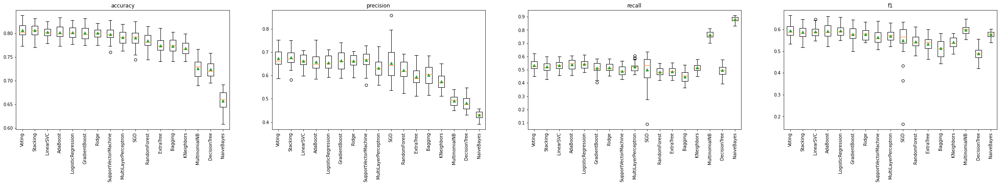

In [ ]:
visualize_experiment_results(base_results, metrics)

##### Oversampling

In [ ]:
from imblearn.over_sampling import SMOTE

print("Before OverSampling, counts of label '1': {}".format(sum(y == 1)))
print("Before OverSampling, counts of label '0': {} \n".format(sum(y == 0)))
  
sm = SMOTE(random_state = 2)
X_train_res, y_train_res = sm.fit_resample(X_train, y_train.ravel())
  
print('After OverSampling, the shape of train_X: {}'.format(X_train_res.shape))
print('After OverSampling, the shape of train_y: {} \n'.format(y_train_res.shape))
  
print("After OverSampling, counts of label '1': {}".format(sum(y_train_res == 1)))
print("After OverSampling, counts of label '0': {}".format(sum(y_train_res == 0)))

Before OverSampling, counts of label '1': 1312
Before OverSampling, counts of label '0': 3618 

After OverSampling, the shape of train_X: (7236, 30)
After OverSampling, the shape of train_y: (7236,) 

After OverSampling, counts of label '1': 3618
After OverSampling, counts of label '0': 3618


100%|██████████| 17/17 [08:32<00:00, 30.16s/it]


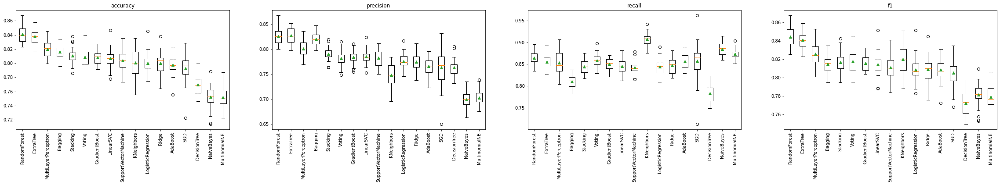

In [ ]:
oversample_models = get_initial_models()
oversample_results = run_experiments(oversample_models, metrics, (X_train_res, y_train_res), verbose=False)
visualize_experiment_results(oversample_results, metrics)

###### Oversampling with feature selection


100%|██████████| 17/17 [08:07<00:00, 28.67s/it]


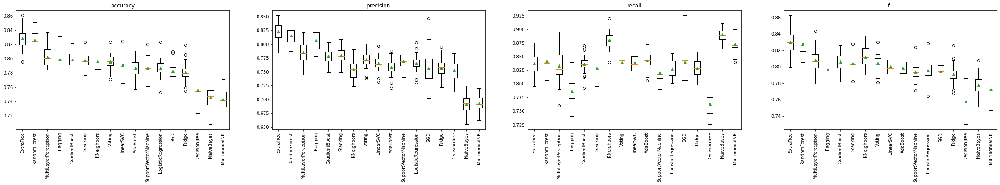

In [ ]:
sm = SMOTE(random_state = 2)
X_train_fs_res, y_train_res = sm.fit_resample(X_train_fs, y.ravel())

oversample_models = get_initial_models()
oversample_results = run_experiments(oversample_models, metrics, (X_train_fs_res, y_train_res), verbose=False)
visualize_experiment_results(oversample_results, metrics)

##### Undersampling

In [ ]:
print("Before Undersampling, counts of label '1': {}".format(sum(y == 1)))
print("Before Undersampling, counts of label '0': {} \n".format(sum(y == 0)))
  
# apply near miss
from imblearn.under_sampling import NearMiss
nr = NearMiss()
  
X_train_miss, y_train_miss = nr.fit_resample(X_train, y_train.ravel())
  
print('After Undersampling, the shape of train_X: {}'.format(X_train_miss.shape))
print('After Undersampling, the shape of train_y: {} \n'.format(y_train_miss.shape))
  
print("After Undersampling, counts of label '1': {}".format(sum(y_train_miss == 1)))
print("After Undersampling, counts of label '0': {}".format(sum(y_train_miss == 0)))

Before Undersampling, counts of label '1': 1312
Before Undersampling, counts of label '0': 3618 

After Undersampling, the shape of train_X: (2624, 30)
After Undersampling, the shape of train_y: (2624,) 

After Undersampling, counts of label '1': 1312
After Undersampling, counts of label '0': 1312


100%|██████████| 17/17 [03:10<00:00, 11.19s/it]


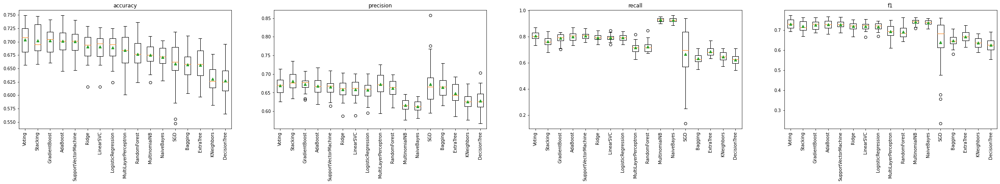

In [ ]:
undersample_models = get_initial_models()
undersample_results = run_experiments(undersample_models, metrics, (X_train_miss, y_train_miss), verbose=False)
visualize_experiment_results(undersample_results, metrics)

###### Undersampling with feature selection


100%|██████████| 17/17 [03:07<00:00, 11.04s/it]


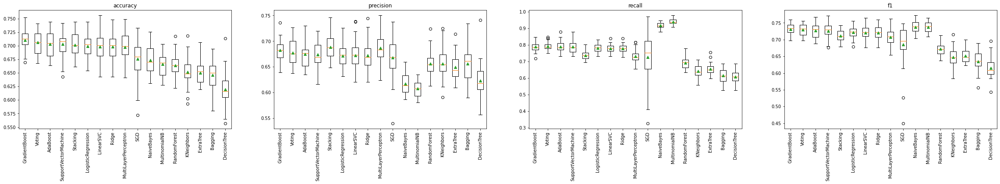

In [ ]:
nr = NearMiss()
X_train_fs_miss, y_train_miss = nr.fit_resample(X_train_fs, y_train.ravel())

undersample_models = get_initial_models()
undersample_results = run_experiments(undersample_models, metrics, (X_train_fs_miss, y_train_miss), verbose=False)
visualize_experiment_results(undersample_results, metrics)

##### Other Model Experiments

###### Cat Boost Classifier

In [ ]:
# Cat Boost
cbc_model = fit_model(CatBoostClassifier) 

Learning rate set to 0.01851
0:	learn: 0.6813559	total: 50.9ms	remaining: 50.8s
1:	learn: 0.6706746	total: 57.3ms	remaining: 28.6s
2:	learn: 0.6593473	total: 64ms	remaining: 21.3s
3:	learn: 0.6493112	total: 70.5ms	remaining: 17.5s
4:	learn: 0.6385452	total: 76.8ms	remaining: 15.3s
5:	learn: 0.6279315	total: 83.1ms	remaining: 13.8s
6:	learn: 0.6192608	total: 88.2ms	remaining: 12.5s
7:	learn: 0.6108365	total: 93.2ms	remaining: 11.6s
8:	learn: 0.6016203	total: 96.2ms	remaining: 10.6s
9:	learn: 0.5944166	total: 99.1ms	remaining: 9.81s
10:	learn: 0.5867762	total: 102ms	remaining: 9.16s
11:	learn: 0.5798976	total: 105ms	remaining: 8.63s
12:	learn: 0.5723748	total: 108ms	remaining: 8.18s
13:	learn: 0.5666176	total: 111ms	remaining: 7.81s
14:	learn: 0.5607382	total: 114ms	remaining: 7.48s
15:	learn: 0.5551525	total: 117ms	remaining: 7.2s
16:	learn: 0.5496337	total: 120ms	remaining: 6.94s
17:	learn: 0.5445837	total: 123ms	remaining: 6.71s
18:	learn: 0.5387186	total: 126ms	remaining: 6.51s
19:	l

#### Get Test Accuracies of best models

In [ ]:
# get best models
sort_by = "accuracy"
sorted_results = dict(sorted(base_results.items(), key=lambda item: 1-np.mean(item[1][f"test_{sort_by}"]))) 
best_3_models = list(sorted_results.keys())[:3]
models = dict(filter(lambda model: model[0] in best_3_models, base_models.items()))

In [ ]:
# Get test accuracies
for m_name, model in models.items():
    models[m_name] = fit_model(model, validation=(X_test, y_test))

Linear SVC
accuracy:  0.783719829626124
precision:  0.608786610878661
recall:  0.5187165775401069
f1_score:  0.7778974373015947

Stacking Classifier
accuracy:  0.7993374349266446
precision:  0.648590021691974
recall:  0.5329768270944741
f1_score:  0.7926517222749252

Voting Classifier
accuracy:  0.8031235210601041
precision:  0.6545842217484008
recall:  0.5472370766488414
f1_score:  0.7971646207187626



#### Improve best models by hyper-parameter tuning

In [ ]:
for name, model in models.items():
    print(name,"Model\t:", model)

LinearSVC Model	: LinearSVC()
Stacking Model	: StackingClassifier(cv=5,
                   estimators=[('lr', GradientBoostingClassifier()),
                               ('ridge', RidgeClassifier()),
                               ('ada', AdaBoostClassifier())],
                   final_estimator=LogisticRegression())
Voting Model	: VotingClassifier(estimators=[('gbc', GradientBoostingClassifier()),
                             ('lr', LogisticRegression()),
                             ('abc', AdaBoostClassifier())],
                 voting='soft')


In [ ]:
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV

from scipy.stats import loguniform

In [ ]:
# define search space
lr_space = dict()
lr_space['solver'] = ['newton-cg', 'lbfgs', 'liblinear']
lr_space['penalty'] = ['none', 'l1', 'l2', 'elasticnet']
lr_space['C'] = loguniform(1e-5, 1000)

svc_space = dict()
svc_space['penalty'] = ['l1', 'l2']
svc_space['loss'] = ['hinge', 'squared_hinge']
svc_space['dual'] = [True, False]
svc_space['tol'] = loguniform(1e-5, 100)
svc_space['C'] = loguniform(1e-5, 1000)
svc_space['multi_class'] = ['ovr', 'crammer_singer']

In [ ]:
def hyper_tune_model(model, search_space, data):
    # define evaluation
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)

    # define search
    search = RandomizedSearchCV(models["LinearSVC"], search_space, n_iter=500, scoring='accuracy', n_jobs=-1, cv=cv, random_state=1)

    data_x, data_y = data
    # execute search
    result = search.fit(data_x, data_y)

    # summarize result
    print('Best Score: %s' % result.best_score_)
    print('Best Hyperparameters: %s' % result.best_params_)
    params = result.best_params_

    #Improving the model
    tuned_model = fit_model(model, params=params)
    return tuned_model, params

In [ ]:
svc_model_tuned, svc_params = hyper_tune_model(models["LinearSVC"], svc_space, data=(X_train_rfe, y_train))

KeyboardInterrupt: ignored

In [ ]:
best_model = svc_model_tuned

### $\color{lightblue}{\text{Save the best model to the disk}}$ 

In [ ]:
best_model = fit_model(LogisticRegression, train_data=(X_train_fs, y_train))

Logistic Regression
accuracy:  0.8296146044624746
precision:  0.6697674418604651
recall:  0.5975103734439834
f1_score:  0.8262182145650833



In [ ]:
#Saving best model 
import joblib
#Save the model to disk
filename = 'model.sav'
joblib.dump(best_model, filename)

['model.sav']

## $\color{lightgreen}{\text{Explainable AI: Model Explanation}}$  
For making the system more explainable Shapley value which can be defined as the average of the marginal contributions and Partial Dependence Plots which visualize the relation between the input features and the target values namely churn and not churn are utilized.


### Preparing Libraries

In [ ]:
!pip install shap

     |████████████████████████████████| 564 kB 5.4 MB/s 


In [ ]:
!pip install lime

     |████████████████████████████████| 275 kB 5.5 MB/s 
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283857 sha256=80c9e90a54609b78d949aa403099b9ec562e84d8854d4bb045595c5f34e090e1
  Stored in directory: /root/.cache/pip/wheels/ca/cb/e5/ac701e12d365a08917bf4c6171c0961bc880a8181359c66aa7
Successfully built lime


In [ ]:
import shap

In [ ]:
import lime
import lime.lime_tabular

###  $\color{lightblue}{\text{Explanations}}$  

The average impact of each feature on the output of the model according to the Shap value is given in the figure below.   
As can be seen, features such as tenure, Contract, InternetService, PaymentMethod affects the results the most.


In [ ]:
# explainer = shap.LinearExplainer(models["LinearSVC"], masker=shap.maskers.Impute(data=X_train), feature_names=X_train.columns) 
# explainer = shap.TreeExplainer(models["LinearSVC"], masker=shap.maskers.Impute(data=X_train), feature_names=X_train.columns) 
# explainer = shap.DeepExplainer(models["LinearSVC"], masker=shap.maskers.Impute(data=X_train), feature_names=X_train.columns) 
# explainer = shap.KernelExplainer(models["LinearSVC"], masker=shap.maskers.Impute(data=X_train), feature_names=X_train.columns) 
# explainer = shap.Explainer(models["LinearSVC"], masker=shap.maskers.Impute(data=X_train), feature_names=X_train.columns) 

explainer_svc = shap.Explainer(models["LinearSVC"], masker=shap.maskers.Impute(data=X_train), feature_names=X_train.columns, algorithm="linear")
shap_values_svc = explainer_svc.shap_values(X_train)

Estimating transforms:   0%|          | 0/1000 [00:00<?, ?it/s]

In [ ]:
## explainer_stck = shap.KernelExplainer(models["Stacking"].predict, X_train, feature_names=X_train.columns)
## shap_values_stck = explainer_stck.shap_values(X_train)

## explainer_stck = shap.KernelExplainer(models["Stacking"].predict_proba, X_train)
## shap_values_stck = explainer_stck.shap_values(X_train)

#### Shap Summary Plots

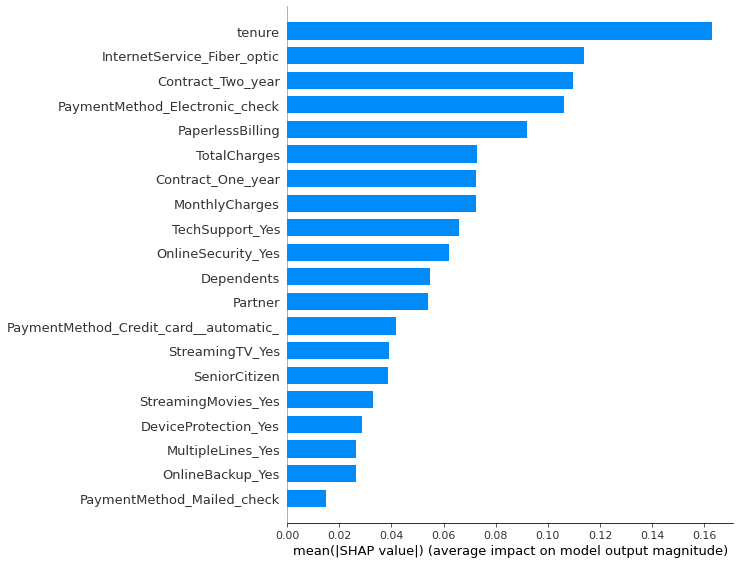

In [ ]:
shap.summary_plot(shap_values_svc, X_train, plot_type="bar")

Also, the positive and negative relationship between the features and the model prediction can be shown with Shap value.

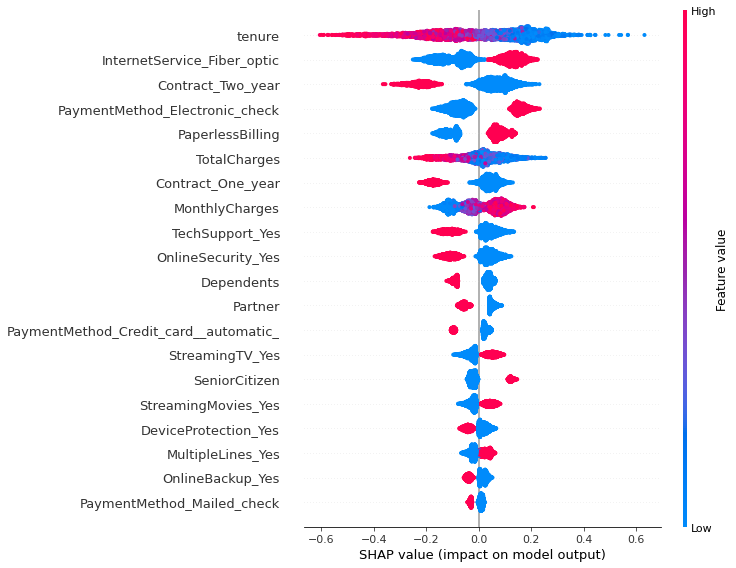

In [ ]:
f = plt.figure()
shap.summary_plot(shap_values_svc, X_train)

Some of the partial dependence plots according to the Shap value are given below. Here, the x-axis represents the value of the feature, whereas the y-axis represents the Shap value of the same feature thus the importance of the feature on the target value. In the right hand-side, the feature that has the greatest interaction percentage with respect to the plotted feature.

**X-axis:** the value of the feature

**Y-axis:** the Shap value of the same feature 

**Right hand-side:** the feature that has the greatest interaction percentage with respect to the plotted feature.

##### All Columns Shap Dependence Plot

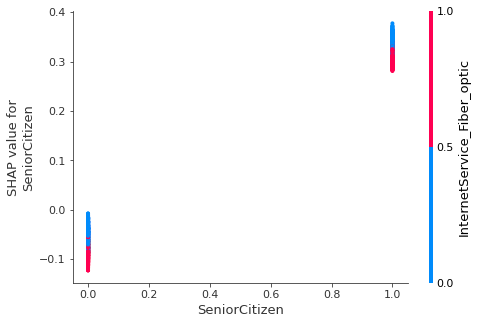

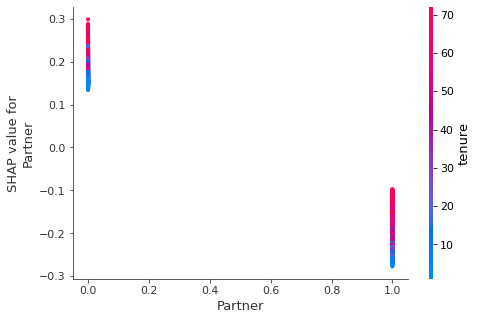

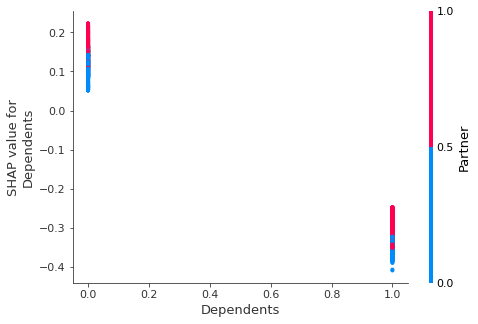

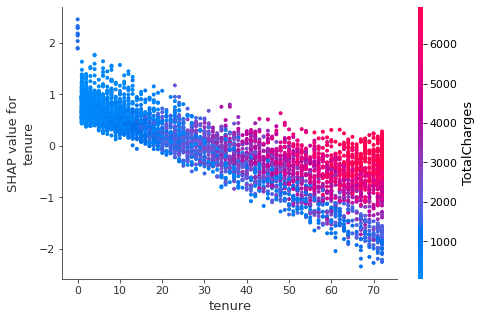

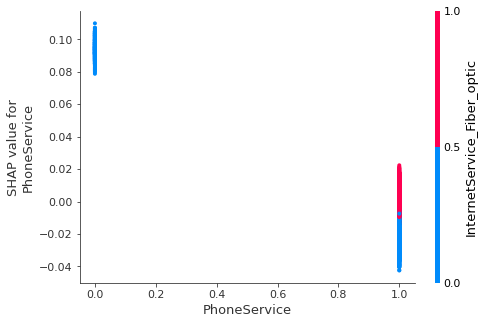

...

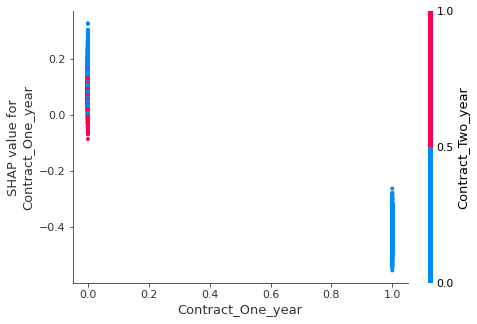

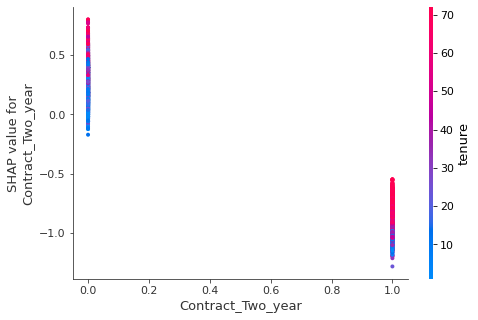

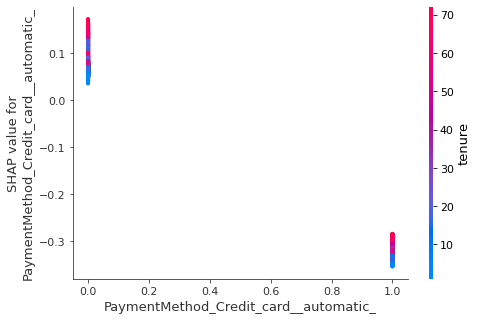

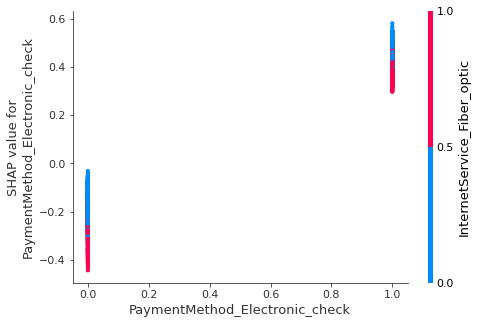

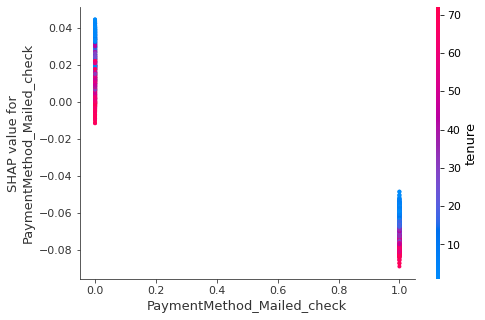

In [ ]:
for i in (X_rfe.columns.tolist()):
    shap.dependence_plot(i, shap_values, X_train)

#### Shap Dependence Plot

In [ ]:
def make_dependence_plot(feature):
    shap.dependence_plot(feature, shap_values, X_train)

interact(make_dependence_plot, feature=X_rfe.columns.tolist());

interactive(children=(Dropdown(description='feature', options=('SeniorCitizen', 'Dependents', 'tenure', 'Phone…

##### Get Test Results

In [ ]:
# Get the predictions and put them with the test data.
X_output = X_test.copy()
X_output.loc[:,'predict'] = log_model.predict(X_output)

# Randomly pick some observations
random_picks = np.arange(1,330,50) # Every 50 rows
S = X_output.iloc[random_picks]

In [ ]:
S

,SeniorCitizen,Dependents,tenure,PhoneService,PaperlessBilling,MonthlyCharges,TotalCharges,MultipleLines_No_phone_service,MultipleLines_Yes,InternetService_Fiber_optic,InternetService_No,OnlineSecurity_No_internet_service,OnlineSecurity_Yes,OnlineBackup_No_internet_service,TechSupport_No_internet_service,TechSupport_Yes,StreamingTV_No_internet_service,StreamingTV_Yes,StreamingMovies_No_internet_service,StreamingMovies_Yes,Contract_One_year,Contract_Two_year,PaymentMethod_Electronic_check,predict
3317,0,0,0.875000,1,0,0.522886,0.511193,0,0,0,0,0,1,0,0,1,0,1,0,0,1,0,0,0
1567,0,0,0.138889,1,1,0.493035,0.073200,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0
80,0,1,0.013889,1,1,0.607960,0.006987,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,1
2334,1,0,0.222222,1,1,0.664677,0.158360,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1
4715,0,0,0.888889,1,1,0.678109,0.625808,0,1,0,0,0,1,0,0,1,0,1,0,1,0,1,0,0
2452,1,0,0.208333,1,1,0.556716,0.128675,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1
3157,0,0,0.125000,1,0,0.265672,0.047565,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
shap.initjs()
def shap_plot(j):
    explainerModel = explainer

    shap_values_Model = explainerModel.shap_values(S)
    print(shap_values_Model.shape)
    print(X_rfe.columns.shape)
        
    p = shap.force_plot(explainerModel.expected_value, shap_values_Model[j], S.iloc[[j]])
    
    return(p)

#### Make Force Plot

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[0:10], feature_names=X_rfe.columns)

#### Lime Explainer

##### Prepare Lime Explainer

In [ ]:
explainer = lime.lime_tabular.LimeTabularExplainer(
    np.array(X_train),
    feature_names=X_train.columns,                             
    verbose=True, 
    mode='classification')

In [ ]:
exp = explainer.explain_instance(X_test.iloc[0], models["Stacking"].predict_proba, num_features=10)

Intercept -0.0068109434410883185
Prediction_local [0.44166311]
Right: 0.5601786979454662


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


##### Lime Explainer Visualization

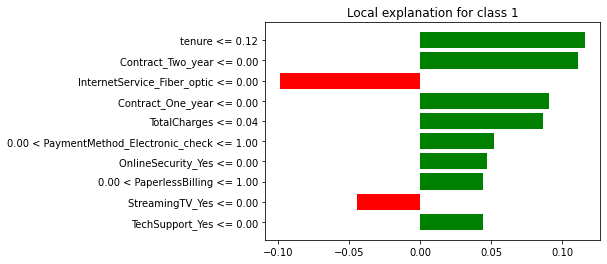

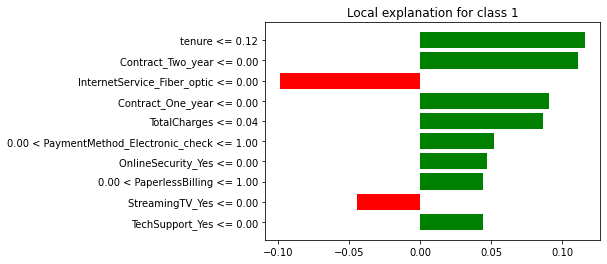

In [ ]:
exp.as_pyplot_figure()

##### -> values as list

In [ ]:
pd.DataFrame(exp.as_list())

,0,1
0,tenure <= 0.12,0.115738
1,Contract_Two_year <= 0.00,0.111069
2,InternetService_Fiber_optic <= 0.00,-0.098480
3,Contract_One_year <= 0.00,0.090639
4,TotalCharges <= 0.04,0.086610
5,0.00 < PaymentMethod_Electronic_check <= 1.00,0.051813
6,OnlineSecurity_Yes <= 0.00,0.046755
7,0.00 < PaperlessBilling <= 1.00,0.044507
8,StreamingTV_Yes <= 0.00,-0.044430
9,TechSupport_Yes <= 0.00,0.044254


#### Lime Interactive Explainer

In [ ]:
exp.show_in_notebook(show_table=True, show_all=False)

In [ ]:
from lime import submodular_pick

sp_obj = submodular_pick.SubmodularPick(explainer, X_train.values, models["Stacking"].predict_proba, sample_size=500, num_features=10, num_exps_desired=1)
[exp.show_in_notebook() for exp in sp_obj.sp_explanations]

X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.002508920794748
Prediction_local [0.66526862]
Right: 0.7450326827344722


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6844845841935615
Prediction_local [0.91749486]
Right: 0.8969927664474118


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.986922783963721
Prediction_local [0.64034324]
Right: 0.5102957795329219


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6491313656596532
Prediction_local [1.12205197]
Right: 0.9696386543687009


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8542287497214951
Prediction_local [0.78463934]
Right: 0.7852348013210637


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.0523635147164325
Prediction_local [0.50219936]
Right: 0.7912497783874316


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.777589861168797
Prediction_local [0.81130592]
Right: 0.9259976541580885


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7095075832367305
Prediction_local [1.0072648]
Right: 0.9306679097700014


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8384495341568516
Prediction_local [0.83383098]
Right: 0.9409657156297797


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.01944705818212
Prediction_local [0.59478405]
Right: 0.5475825098009177


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.06907830000013451
Prediction_local [0.47522459]
Right: 0.6187811959195328


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.95968508322876
Prediction_local [0.78949003]
Right: 0.8659576753890273


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7197961042127012
Prediction_local [0.95504071]
Right: 0.9136319855075006


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7733553567386482
Prediction_local [0.82267392]
Right: 0.9277539596821297


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9393494573002146
Prediction_local [0.68734525]
Right: 0.593143423114218


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9276287980616219
Prediction_local [0.67680357]
Right: 0.6155272405452215


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8250351487412263
Prediction_local [0.90241069]
Right: 0.9368918059343261


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.13420707854855254
Prediction_local [0.54415734]
Right: 0.6224665978361554


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.06939840095660246
Prediction_local [0.50287933]
Right: 0.6210000828905352


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9303387491713475
Prediction_local [0.77331928]
Right: 0.8325211245066302


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8589431094850111
Prediction_local [0.70663151]
Right: 0.6697128656686526


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9321386608582023
Prediction_local [0.77495448]
Right: 0.8803705770871916


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7648012542943051
Prediction_local [0.91872172]
Right: 0.9345108832384181


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8332919631280182
Prediction_local [0.80542184]
Right: 0.9002028724912691


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.13667213524706667
Prediction_local [0.53341551]
Right: 0.6707221204640298


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.10566629200559516
Prediction_local [0.54218446]
Right: 0.7735718812224854


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.991449368902867
Prediction_local [0.66277407]
Right: 0.5354112728072078


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.11645508688052078
Prediction_local [0.661836]
Right: 0.8399592723177387


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.16029710425584584
Prediction_local [0.67976131]
Right: 0.7693756785437801


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9276612491013749
Prediction_local [0.60847053]
Right: 0.5563913554102642


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8460131642411314
Prediction_local [0.8361106]
Right: 0.9052641303495929


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7733013203932001
Prediction_local [0.9083181]
Right: 0.9230540658111063


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8841352911278161
Prediction_local [0.79384386]
Right: 0.8376830563688372


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.1265905153799916
Prediction_local [0.5021155]
Right: 0.6715185696447995


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6767661214051428
Prediction_local [0.98152744]
Right: 0.9428060138981582


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8703698526407813
Prediction_local [0.82215247]
Right: 0.8692821663307964


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9959103221943831
Prediction_local [0.56257126]
Right: 0.5731853177910062


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7798726286610373
Prediction_local [0.86161817]
Right: 0.8927989524726637


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.027689276784528538
Prediction_local [0.44408132]
Right: 0.5960066533263517


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.02156081438030369
Prediction_local [0.43374096]
Right: 0.5223201475991911


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6275662358914382
Prediction_local [1.13070245]
Right: 0.9723771228986371


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9341823345827254
Prediction_local [0.6482375]
Right: 0.6853517975509796


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6283813554268657
Prediction_local [1.08773613]
Right: 0.9662723986627535


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.02705302462426218
Prediction_local [0.41695181]
Right: 0.7094788895856267


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7340215519992431
Prediction_local [1.03395052]
Right: 0.9563235787534191


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7294641617839753
Prediction_local [0.95158924]
Right: 0.9399807281213806


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6380903367882169
Prediction_local [1.12585391]
Right: 0.963365004547036


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.82121465495325
Prediction_local [0.86790744]
Right: 0.9032067960783821


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.11026356089312994
Prediction_local [0.56323429]
Right: 0.8157345017587504


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.857930877708869
Prediction_local [0.80509241]
Right: 0.8725485769295191


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.09903285781701385
Prediction_local [0.55659175]
Right: 0.8460981161612059


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.0440642431928992
Prediction_local [0.5977261]
Right: 0.8448072049589299


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9125025639458222
Prediction_local [0.79462741]
Right: 0.9165248058199742


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8070087140772148
Prediction_local [0.85992351]
Right: 0.9215939231350457


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7402816607879066
Prediction_local [1.0070016]
Right: 0.93661422973044


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7438239001706048
Prediction_local [0.99052721]
Right: 0.954252927937378


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7669916973740939
Prediction_local [0.98565504]
Right: 0.9112989917418635


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6379894149970524
Prediction_local [1.04107148]
Right: 0.9487763730630048


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7236875633749322
Prediction_local [0.93870881]
Right: 0.8844739087336275


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6773026226490942
Prediction_local [1.03926838]
Right: 0.9469043843244226


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9049866232195612
Prediction_local [0.72636102]
Right: 0.8858137845073121


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8883822083874277
Prediction_local [0.71312181]
Right: 0.8282618885611117


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6382204477917492
Prediction_local [1.02480807]
Right: 0.9592538841650234


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8498118421268419
Prediction_local [0.85838916]
Right: 0.9141970562529521


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.049070657817385815
Prediction_local [0.50731553]
Right: 0.7390096992991833


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8116946069122388
Prediction_local [0.86341847]
Right: 0.9087737023486661


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9636252587725808
Prediction_local [0.63637986]
Right: 0.5513330926877373


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7362827425503298
Prediction_local [1.01088887]
Right: 0.9520272816471098


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.17455561658978638
Prediction_local [0.67396118]
Right: 0.8843272746123253


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.021156529690830816
Prediction_local [0.3399105]
Right: 0.503398181875085


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7983601464879948
Prediction_local [0.86742192]
Right: 0.879021202215362


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8773292431833252
Prediction_local [0.77770997]
Right: 0.8504003023533793


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9970053861877461
Prediction_local [0.53729294]
Right: 0.5434535036193172


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9884722817779416
Prediction_local [0.65510311]
Right: 0.5947710118831878


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9010164427077025
Prediction_local [0.65370816]
Right: 0.5382521524407089


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7318191530283499
Prediction_local [1.00111689]
Right: 0.9348741702228269


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7213798154684791
Prediction_local [0.92094012]
Right: 0.9025467190725067


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9607029412875249
Prediction_local [0.59572358]
Right: 0.6374124397150228


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9053069521937025
Prediction_local [0.7334673]
Right: 0.9053724935805957


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8484465346850618
Prediction_local [0.84724248]
Right: 0.9315248544201152


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7778316125321233
Prediction_local [0.90346762]
Right: 0.9392042515939515


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9555207696207305
Prediction_local [0.68746685]
Right: 0.7063713606670596


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8587299767728568
Prediction_local [0.801004]
Right: 0.902715566306741


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.17288138957309698
Prediction_local [0.68584762]
Right: 0.8477196621514529


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8867079434329049
Prediction_local [0.82092178]
Right: 0.9038086924427636


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8573874384034808
Prediction_local [0.82745386]
Right: 0.8901400834492953


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9693965904236764
Prediction_local [0.62135239]
Right: 0.706845694625575


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6810809032058033
Prediction_local [1.0285303]
Right: 0.9500848137201486


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8791696028635475
Prediction_local [0.72046161]
Right: 0.8871813964837564


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.03345277341080152
Prediction_local [0.4359623]
Right: 0.6634836368274424


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9611768311941555
Prediction_local [0.71149406]
Right: 0.7903180027411216


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.07165002339945128
Prediction_local [0.50646888]
Right: 0.6851554921433292


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0079017169911961
Prediction_local [0.73713156]
Right: 0.7824318288208274


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.07913780484764618
Prediction_local [0.4536416]
Right: 0.692786589821761


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.025139047580303137
Prediction_local [0.37272469]
Right: 0.6079045070800237


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6599034038139009
Prediction_local [1.12908123]
Right: 0.952561243288642


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9740390375514958
Prediction_local [0.67002033]
Right: 0.6507661193823455


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.690709792622982
Prediction_local [1.07826343]
Right: 0.9641261447805025


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8503300373108584
Prediction_local [0.85248706]
Right: 0.9348408094302076


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.017304772489965
Prediction_local [0.64217228]
Right: 0.518363240112536


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8849704301436071
Prediction_local [0.71168232]
Right: 0.8912908136365384


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7410769410651975
Prediction_local [1.00531415]
Right: 0.9385251440243351


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7641198836293979
Prediction_local [1.00040738]
Right: 0.9286789176697167


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.1038510177621256
Prediction_local [0.54643328]
Right: 0.710620304576552


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.032612320017038426
Prediction_local [0.49664515]
Right: 0.7244630682788574


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8174361009073294
Prediction_local [0.78777688]
Right: 0.8155173337400464


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6403228635241567
Prediction_local [1.05681795]
Right: 0.9536059153129329


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7045695133291925
Prediction_local [1.00339993]
Right: 0.958382491063543


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.01950565819397629
Prediction_local [0.43970034]
Right: 0.5802534137103063


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8898676790161817
Prediction_local [0.74675172]
Right: 0.6535501008193105


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8099879795975546
Prediction_local [0.85168432]
Right: 0.853675942785852


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.017584903510165506
Prediction_local [0.40471472]
Right: 0.6087798160503654


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6686136661286114
Prediction_local [1.02203814]
Right: 0.9436779949233457


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7187740737034598
Prediction_local [0.99070964]
Right: 0.9518200460669982


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.057577401410161294
Prediction_local [0.52111027]
Right: 0.8130785730101662


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.973564378803706
Prediction_local [0.69176217]
Right: 0.6854245737854914


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8083489702106328
Prediction_local [0.84700997]
Right: 0.8577300825560514


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7076022093717526
Prediction_local [0.98883794]
Right: 0.963052991266595


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9097218187143887
Prediction_local [0.643928]
Right: 0.5771079123672157


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8096279826470199
Prediction_local [0.89446053]
Right: 0.9331683569297912


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.006644305620077923
Prediction_local [0.37526433]
Right: 0.5265730240947036


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8139364733589294
Prediction_local [0.93504325]
Right: 0.9254119805153217


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.07857681614871531
Prediction_local [0.41014905]
Right: 0.5390131338893758


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.031186216978423192
Prediction_local [0.42114262]
Right: 0.6417844449215722


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.738048214294131
Prediction_local [1.02879158]
Right: 0.9627126106738435


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6184221825144766
Prediction_local [1.06416082]
Right: 0.9550817924769615


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8497028724321979
Prediction_local [0.83708878]
Right: 0.8917373567517908


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8448861629661457
Prediction_local [0.76077273]
Right: 0.8557455495405553


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6808823869548946
Prediction_local [1.06613603]
Right: 0.9619595529635915


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.762297563910593
Prediction_local [0.92984097]
Right: 0.9558475946110658


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9135520266250732
Prediction_local [0.73308615]
Right: 0.8286283518131782


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9777871214547297
Prediction_local [0.70056211]
Right: 0.7076243481058475


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9236120169747324
Prediction_local [0.67446183]
Right: 0.7875242117943105


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9905422525193889
Prediction_local [0.68989236]
Right: 0.5928700643194297


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7438687133741781
Prediction_local [0.97294949]
Right: 0.9327551161678871


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0418306247722053
Prediction_local [0.60215006]
Right: 0.56692274521864


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6952510100248426
Prediction_local [1.07935303]
Right: 0.9616992945574542


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8127672879794536
Prediction_local [0.94904461]
Right: 0.8814183060489809


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.07896965154787597
Prediction_local [0.46351665]
Right: 0.5402347564035003


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8128646109264153
Prediction_local [0.88969617]
Right: 0.9061915230157289


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9268711741566429
Prediction_local [0.72316492]
Right: 0.7503690531535884


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.04278339144342794
Prediction_local [0.423002]
Right: 0.6285814720762423


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9816261491608104
Prediction_local [0.72423352]
Right: 0.8629165192351202


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7325791782018395
Prediction_local [0.96069788]
Right: 0.9355221428382469


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.1001744056632822
Prediction_local [0.5503308]
Right: 0.7816833245233524


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.896792140169439
Prediction_local [0.72579233]
Right: 0.9046339713596129


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7779146079223048
Prediction_local [0.90046099]
Right: 0.9383689378667297


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9294716659285528
Prediction_local [0.66031024]
Right: 0.6672327294740621


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8171283496058592
Prediction_local [0.84246079]
Right: 0.8808274091341685


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8264746787112807
Prediction_local [0.88430451]
Right: 0.8751350210337123


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9473702952606791
Prediction_local [0.68893445]
Right: 0.8388830673736803


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.01852332660344827
Prediction_local [0.44904522]
Right: 0.728302061825402


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9345394284348347
Prediction_local [0.77273246]
Right: 0.8053543012967471


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.05699387272652104
Prediction_local [0.52748677]
Right: 0.7003234761065923


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6891389237807373
Prediction_local [1.03662789]
Right: 0.9447173328853715


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.89553350834391
Prediction_local [0.792012]
Right: 0.8890667546866762


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7997652935402408
Prediction_local [0.90632014]
Right: 0.93866475952508


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.0014975811834701813
Prediction_local [0.3932424]
Right: 0.6477588052063034


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.12038679232542565
Prediction_local [0.55249808]
Right: 0.7815896717173217


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9058564756789721
Prediction_local [0.7876441]
Right: 0.9235130765632277


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.1271949840840443
Prediction_local [0.53780106]
Right: 0.7130527467500546


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8412748997319585
Prediction_local [0.79540228]
Right: 0.8492750160520678


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.026979569607894827
Prediction_local [0.41101169]
Right: 0.5681545217882757


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.09856817654703817
Prediction_local [0.54260781]
Right: 0.7199150742270569


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.10842071227386077
Prediction_local [0.54408391]
Right: 0.6526496939987864


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7652648405761915
Prediction_local [0.9291711]
Right: 0.9418420873560339


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8229640334187422
Prediction_local [0.86636065]
Right: 0.9133746283404587


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9041958020226378
Prediction_local [0.73875004]
Right: 0.8548687100321127


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6863877028339362
Prediction_local [1.07006496]
Right: 0.9616790874648987


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.09501258907805474
Prediction_local [0.57612]
Right: 0.7054528348750729


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6880857843578527
Prediction_local [1.07903294]
Right: 0.9587343948075497


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7933838633429663
Prediction_local [0.851258]
Right: 0.9380310262516549


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.689518161809933
Prediction_local [1.01852917]
Right: 0.9297482609479586


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9845540941432487
Prediction_local [0.63758472]
Right: 0.5835856945031492


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.08283271157940209
Prediction_local [0.39519639]
Right: 0.5912187151261014


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7613282259186072
Prediction_local [0.94605149]
Right: 0.9284550389706832


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6870390763588371
Prediction_local [1.01484242]
Right: 0.9472437701741737


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.754091339006839
Prediction_local [0.89833451]
Right: 0.8869109399337819


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8733758200769124
Prediction_local [0.7980428]
Right: 0.821421599345271


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8230488500309412
Prediction_local [0.84599517]
Right: 0.8761239862137099


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7739372556480033
Prediction_local [0.90417793]
Right: 0.8880553407799722


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.986308740894378
Prediction_local [0.61230122]
Right: 0.6521565352825918


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9149505670848975
Prediction_local [0.64016298]
Right: 0.6594879055880116


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8982068581546936
Prediction_local [0.7111859]
Right: 0.5200215396607402


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8180805583661157
Prediction_local [0.83193194]
Right: 0.88705671603357


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8194204179569794
Prediction_local [0.79648909]
Right: 0.8404120980390539


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7317484961153271
Prediction_local [1.017518]
Right: 0.9532673524871371


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7684489754640024
Prediction_local [0.89703004]
Right: 0.867098910535443


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7964359554905663
Prediction_local [0.82280902]
Right: 0.8452826631061883


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9526350481646444
Prediction_local [0.70959352]
Right: 0.7278239836869247


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.10156074721946223
Prediction_local [0.56434689]
Right: 0.6787987113520582


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.10776349615220682
Prediction_local [0.54745845]
Right: 0.7899899976847102


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0114937631889334
Prediction_local [0.59034928]
Right: 0.7019071144944946


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9409733434501669
Prediction_local [0.74598666]
Right: 0.8371381107812146


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7983582943947666
Prediction_local [0.83500062]
Right: 0.8511579269099939


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9389033328881684
Prediction_local [0.67251223]
Right: 0.6143935140861476


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8774438033567148
Prediction_local [0.77708541]
Right: 0.8348874338337062


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7020726383493281
Prediction_local [0.98279223]
Right: 0.9163777002748535


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6789941760017553
Prediction_local [1.07833179]
Right: 0.9542364670385436


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6932355162258821
Prediction_local [1.08496083]
Right: 0.9541158304850534


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9130865697851316
Prediction_local [0.73292021]
Right: 0.896382514348024


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9032922486590911
Prediction_local [0.73905408]
Right: 0.8947025435330864


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.011065886038906736
Prediction_local [0.4463567]
Right: 0.5692506174858019


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.06418374540193378
Prediction_local [0.4734388]
Right: 0.6116269338358123


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9744019322344314
Prediction_local [0.64007914]
Right: 0.5916308750267179


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8850790326426057
Prediction_local [0.70884813]
Right: 0.82532163956703


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7327430987970552
Prediction_local [0.93006208]
Right: 0.9288608342734799


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.06907796996684606
Prediction_local [0.56424301]
Right: 0.7361826055403033


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6961695413096514
Prediction_local [1.02836476]
Right: 0.9522198547081338


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6939410953579064
Prediction_local [1.11806097]
Right: 0.9570796697577858


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8333401123359276
Prediction_local [0.79888365]
Right: 0.8726640127000522


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8537418681160391
Prediction_local [0.8527298]
Right: 0.9313541830395058


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8118300155365155
Prediction_local [0.89809373]
Right: 0.9457598154671949


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.012280881117565173
Prediction_local [0.40954496]
Right: 0.5090426727439302


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9011395314521434
Prediction_local [0.64335504]
Right: 0.6175199497566182


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.73175804991011
Prediction_local [0.92190791]
Right: 0.8767164157623437


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7847604663093105
Prediction_local [0.87628058]
Right: 0.9321342853039566


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8305092433978553
Prediction_local [0.77345805]
Right: 0.7743168866657282


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.06526389550061013
Prediction_local [0.50125641]
Right: 0.5627423754348223


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.008242589788656
Prediction_local [0.65560325]
Right: 0.7029311304551308


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8334741729132557
Prediction_local [0.79698643]
Right: 0.8645703387130849


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9125145274987944
Prediction_local [0.75603945]
Right: 0.7177688649497929


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.741049837919966
Prediction_local [1.03249286]
Right: 0.9586170786989321


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7293153345945248
Prediction_local [0.97989162]
Right: 0.9405750143363348


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6931671148450345
Prediction_local [1.08372526]
Right: 0.957076827177617


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7402892411081763
Prediction_local [0.98644316]
Right: 0.9439549345765148


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6451377764407911
Prediction_local [1.02224643]
Right: 0.9530855063213761


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8679841045442445
Prediction_local [0.71368781]
Right: 0.7051708983793674


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.025140959284298575
Prediction_local [0.42855306]
Right: 0.5277913811115941


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.12346568770470978
Prediction_local [0.55970585]
Right: 0.8291589464625593


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6676536768369609
Prediction_local [1.05955745]
Right: 0.9473018503447985


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.912025076726483
Prediction_local [0.75397104]
Right: 0.822177471157711


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7198951788702672
Prediction_local [0.96635358]
Right: 0.9325894349894742


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8343943708310225
Prediction_local [0.69765083]
Right: 0.7702662526296351


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0570546433303756
Prediction_local [0.62878796]
Right: 0.7007669657730502


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0723888715391903
Prediction_local [0.59269035]
Right: 0.5000210627840388


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6406587198270394
Prediction_local [1.01470889]
Right: 0.96212218740157


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8386088461195749
Prediction_local [0.76743684]
Right: 0.8293699207429133


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.61438551403476
Prediction_local [1.10105847]
Right: 0.9634529437604942


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6488130579163519
Prediction_local [1.09437608]
Right: 0.9598712038993427


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7713973949030098
Prediction_local [0.91831168]
Right: 0.9419061235907522


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7326059864377742
Prediction_local [0.91491864]
Right: 0.9394835095670913


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.03313325787252103
Prediction_local [0.43709929]
Right: 0.7426487735465326


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.952656902023608
Prediction_local [0.68456744]
Right: 0.7222988020998444


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7674068288336866
Prediction_local [0.97660147]
Right: 0.9022582200840749


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6994065988633695
Prediction_local [0.98064952]
Right: 0.970286788558166


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8306272229493831
Prediction_local [0.76172234]
Right: 0.8774789050078777


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.051086288846084876
Prediction_local [0.48285386]
Right: 0.6291191675529427


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.892023067860861
Prediction_local [0.69647487]
Right: 0.7273854079547708


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9000350430154702
Prediction_local [0.65418869]
Right: 0.6574993335136077


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0134073056059405
Prediction_local [0.59681517]
Right: 0.5846841009299648


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7337022371653251
Prediction_local [0.94933912]
Right: 0.9399198220193369


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6816285924625606
Prediction_local [1.06843948]
Right: 0.9653536605677885


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7007264798155937
Prediction_local [0.99899237]
Right: 0.9446267102429302


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.006735912450565346
Prediction_local [0.47942558]
Right: 0.7779147263047449


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7328506124472393
Prediction_local [1.00045534]
Right: 0.9535969860724757


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7389822229978138
Prediction_local [1.00981444]
Right: 0.9496868477836555


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.10926828477847242
Prediction_local [0.56316967]
Right: 0.8522349611844137


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7894630255997951
Prediction_local [0.90782352]
Right: 0.8852245924733866


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9198603133802381
Prediction_local [0.66987908]
Right: 0.8237468447203108


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7869782970865714
Prediction_local [0.91904867]
Right: 0.9254809879076024


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6850145892432423
Prediction_local [1.03546282]
Right: 0.9551343341266914


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9209259281803033
Prediction_local [0.63635367]
Right: 0.6552641354696918


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8049095458604921
Prediction_local [0.94352702]
Right: 0.9501688025311171


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8212155147892093
Prediction_local [0.78760311]
Right: 0.8605252311641681


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7917773780919585
Prediction_local [0.91700524]
Right: 0.9267574874869869


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8710893273795189
Prediction_local [0.83565124]
Right: 0.9125965703841253


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9538557185118439
Prediction_local [0.68256428]
Right: 0.8676042670932884


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.10161397902717811
Prediction_local [0.55893774]
Right: 0.8589775858735593


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.778445173513007
Prediction_local [0.86629148]
Right: 0.930556677696118


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7131793855034377
Prediction_local [1.0346728]
Right: 0.9605838002991186


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9697130724252802
Prediction_local [0.67201211]
Right: 0.7772742834953087


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7766637058009016
Prediction_local [0.9510615]
Right: 0.919774124499843


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.13199001227203583
Prediction_local [0.62428038]
Right: 0.7982149081341011


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8557279495072496
Prediction_local [0.84903069]
Right: 0.9363184272410681


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.014366207396365072
Prediction_local [0.44449861]
Right: 0.52929512316581


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.907456618780067
Prediction_local [0.73766047]
Right: 0.8816864109803695


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9087904118711398
Prediction_local [0.72952489]
Right: 0.6504347508393512


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.980422023739882
Prediction_local [0.63185005]
Right: 0.6302736528752086


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8937424725565547
Prediction_local [0.74299113]
Right: 0.805103233442291


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.043955783553374095
Prediction_local [0.48746929]
Right: 0.5329911701589641


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.780058577523805
Prediction_local [0.9652634]
Right: 0.9410256182452748


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7085764743749905
Prediction_local [0.98164391]
Right: 0.9352035194529514


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8877899480328135
Prediction_local [0.70797691]
Right: 0.8489884315482179


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9012625795046876
Prediction_local [0.86083156]
Right: 0.863944151398138


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8718637401852956
Prediction_local [0.78452291]
Right: 0.884845748686147


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.09277528096560977
Prediction_local [0.54210861]
Right: 0.8613417806691451


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9228376734570087
Prediction_local [0.68564022]
Right: 0.7082317682125947


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7792171867051407
Prediction_local [0.81777845]
Right: 0.8852057214531199


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.015013974988349665
Prediction_local [0.37456732]
Right: 0.5276784684974142


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.14483671475559476
Prediction_local [0.54368616]
Right: 0.6941911998181481


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6960599652093821
Prediction_local [0.91469265]
Right: 0.9056577129868941


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8463601849974922
Prediction_local [0.78321046]
Right: 0.8559063254426744


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7118342704069496
Prediction_local [0.98533605]
Right: 0.9489155187628566


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.08300597861059808
Prediction_local [0.5130337]
Right: 0.557083898673408


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8064790718312648
Prediction_local [0.89617169]
Right: 0.9389799898765091


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9335435048106405
Prediction_local [0.80412776]
Right: 0.7747526772964712


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7107873456148454
Prediction_local [1.01461956]
Right: 0.9513974567456809


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.127628608858711
Prediction_local [0.61039202]
Right: 0.8169312575697549


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6987078084485163
Prediction_local [0.97241073]
Right: 0.9433045680256734


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8836569797397458
Prediction_local [0.798345]
Right: 0.8940737760643157


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6647396519157108
Prediction_local [1.13049427]
Right: 0.8912129054444673


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8943681610595204
Prediction_local [0.74395822]
Right: 0.7577184661359719


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7678567015125396
Prediction_local [0.82389435]
Right: 0.9031040037225817


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8797124116388904
Prediction_local [0.79352958]
Right: 0.8128722339086065


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8975211191519675
Prediction_local [0.73963306]
Right: 0.8338699484011817


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8797017729393073
Prediction_local [0.82429613]
Right: 0.8570753534642008


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8308852316438634
Prediction_local [0.86260229]
Right: 0.923272955545946


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8237580237920374
Prediction_local [0.83614131]
Right: 0.8250369124348345


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7100713061915347
Prediction_local [1.06184664]
Right: 0.9628907863275735


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9510378898660793
Prediction_local [0.64594308]
Right: 0.5861648716707445


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6859766363692734
Prediction_local [1.07655675]
Right: 0.9592471466370599


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.942092703142408
Prediction_local [0.77362312]
Right: 0.7688419518835368


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.06340539359770297
Prediction_local [0.50477475]
Right: 0.5768114600010772


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8504390065914469
Prediction_local [0.83320595]
Right: 0.9083772369071845


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.1257101522539275
Prediction_local [0.5041771]
Right: 0.5822930974246638


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.859153592715221
Prediction_local [0.8010268]
Right: 0.8329492408000145


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9873203062224696
Prediction_local [0.60779577]
Right: 0.5196116952892968


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.879927053969721
Prediction_local [0.72546225]
Right: 0.7726437515563479


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8725974766960494
Prediction_local [0.7972516]
Right: 0.8730150909099299


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8611312435840772
Prediction_local [0.90950891]
Right: 0.9250826055668441


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.09904346334818592
Prediction_local [0.56101925]
Right: 0.7814338399613988


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7876797094310743
Prediction_local [0.90109146]
Right: 0.925946080350538


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7410403768779992
Prediction_local [0.9823909]
Right: 0.9036447533950326


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7981405983689506
Prediction_local [0.8614937]
Right: 0.9016903357062817


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7944028368875112
Prediction_local [0.89016241]
Right: 0.9457647061451616


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9135028185690525
Prediction_local [0.73805217]
Right: 0.8796044869839582


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6228091515787708
Prediction_local [1.0268445]
Right: 0.9428672382390715


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.01871411589746172
Prediction_local [0.3725692]
Right: 0.5413640420623643


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6942595624851776
Prediction_local [1.04577472]
Right: 0.9561412753809307


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.944635177529858
Prediction_local [0.74820698]
Right: 0.7350476095805818


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8853600142161268
Prediction_local [0.84847956]
Right: 0.8412620574809035


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.733410646170677
Prediction_local [0.93245374]
Right: 0.9444153992063206


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9735094677733926
Prediction_local [0.74004689]
Right: 0.8515807333720063


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.653275704649344
Prediction_local [1.09302761]
Right: 0.9586742037258481


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8887051449572307
Prediction_local [0.79025276]
Right: 0.8461196372915928


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.08338350058948493
Prediction_local [0.40107588]
Right: 0.6057119785055576


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.03140186329020789
Prediction_local [0.42873249]
Right: 0.7199808288185017


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.09652781919427286
Prediction_local [0.53165623]
Right: 0.8044758358628398


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.020303667641525996
Prediction_local [0.37246604]
Right: 0.5903378050594194


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8645491125139992
Prediction_local [0.70528841]
Right: 0.7730760028818199


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.09929255310332591
Prediction_local [0.62126531]
Right: 0.766561288944364


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7831694506251401
Prediction_local [0.96492316]
Right: 0.9446927119072971


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7112264627480155
Prediction_local [0.93807433]
Right: 0.9230624091754415


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9701440000575434
Prediction_local [0.62007005]
Right: 0.5717430541939974


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8200873595299922
Prediction_local [0.94491702]
Right: 0.9316305469170575


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.035458996446058794
Prediction_local [0.36097972]
Right: 0.5744735334889416


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.10508920825054335
Prediction_local [0.54413032]
Right: 0.8075999723844911


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9126628655186015
Prediction_local [0.72822257]
Right: 0.8954733235077336


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9161811507430575
Prediction_local [0.73301361]
Right: 0.9055220418356303


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9570331163274666
Prediction_local [0.76836316]
Right: 0.8164898343908101


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8026595676425823
Prediction_local [0.84934477]
Right: 0.8784185278685608


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.051361328094397085
Prediction_local [0.49228272]
Right: 0.7951787732161169


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.03685537410684592
Prediction_local [0.32026458]
Right: 0.5795308875898921


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7380803380298525
Prediction_local [0.96048896]
Right: 0.9477211068028156


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.02481317395961341
Prediction_local [0.43587581]
Right: 0.73249553420528


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8865538921398214
Prediction_local [0.81776053]
Right: 0.9008169584599455


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6676447444937352
Prediction_local [0.98705451]
Right: 0.9354251061381977


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9910111851857666
Prediction_local [0.56381799]
Right: 0.5531810191014008


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9018041141082186
Prediction_local [0.74494037]
Right: 0.8287992687816198


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9291052834723054
Prediction_local [0.6647397]
Right: 0.5144638464363962


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8048125677706909
Prediction_local [0.92676712]
Right: 0.9368456292162954


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9702055522303912
Prediction_local [0.77380468]
Right: 0.8011349312021014


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6147111331597692
Prediction_local [1.03955705]
Right: 0.9446603047620159


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8059734532075475
Prediction_local [0.90110621]
Right: 0.9476159038335199


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.04853730318828281
Prediction_local [0.49142903]
Right: 0.5605374000838126


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.676463079507127
Prediction_local [1.06191273]
Right: 0.9676067794843884


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0037368648237794
Prediction_local [0.55124955]
Right: 0.5053998743214425


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9226826345667001
Prediction_local [0.75781486]
Right: 0.8315522580783052


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8889445816469843
Prediction_local [0.82514936]
Right: 0.7894081893037025


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.975068235106826
Prediction_local [0.73330865]
Right: 0.8062586725438323


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6817734798220083
Prediction_local [1.05962519]
Right: 0.9550490574334987


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8731180326476541
Prediction_local [0.81753294]
Right: 0.7899695867782196


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.07239626552327277
Prediction_local [0.45287746]
Right: 0.5500703185675481


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.854544748519484
Prediction_local [0.88638362]
Right: 0.934053335396147


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.17210251297599463
Prediction_local [0.68149862]
Right: 0.8794139251716594


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9438571098850845
Prediction_local [0.69824462]
Right: 0.6506721395539447


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7301953534503756
Prediction_local [0.94353797]
Right: 0.9457681973622712


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6818301825164453
Prediction_local [0.98472962]
Right: 0.9290079885826995


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6212710768672257
Prediction_local [1.13344715]
Right: 0.9575494819902304


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0289477640860492
Prediction_local [0.5758469]
Right: 0.602785868068201


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.1046727743996538
Prediction_local [0.53743105]
Right: 0.8001897113091673


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7041800464843947
Prediction_local [1.04637546]
Right: 0.9514920234259383


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.14989396267531133
Prediction_local [0.57867443]
Right: 0.779598266680342


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8132590284728873
Prediction_local [0.92860531]
Right: 0.9508691297066691


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7723070630730998
Prediction_local [0.94663099]
Right: 0.906826272663363


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9712193783120422
Prediction_local [0.77881189]
Right: 0.8129461162927125


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8133008631807402
Prediction_local [0.88220236]
Right: 0.9531019743051348


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8533214484045827
Prediction_local [0.83376965]
Right: 0.9017264254415708


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.0796529756678025
Prediction_local [0.50901037]
Right: 0.7851615353784136


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8048052507791337
Prediction_local [0.88788508]
Right: 0.9166907042459408


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9526446237916075
Prediction_local [0.70987749]
Right: 0.5274577365268626


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.664614847523396
Prediction_local [1.13306708]
Right: 0.9595023343337885


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8048712622944192
Prediction_local [0.90431901]
Right: 0.9379353165003964


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9642360173965687
Prediction_local [0.78818863]
Right: 0.7529604672324091


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7226589567309731
Prediction_local [0.94209844]
Right: 0.9225382640418355


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.08045384498929
Prediction_local [0.60619791]
Right: 0.6173270422898167


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9012332192163542
Prediction_local [0.73407195]
Right: 0.9048279862818777


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0269870441320732
Prediction_local [0.65534646]
Right: 0.8015879420687666


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.11474688656000656
Prediction_local [0.66052299]
Right: 0.9002020846631


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7144056841814673
Prediction_local [0.93216623]
Right: 0.9252766449083556


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8154471063786044
Prediction_local [0.88906093]
Right: 0.9477388890245249


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7808477422099241
Prediction_local [0.91318472]
Right: 0.8500956675318775


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8267185403480354
Prediction_local [0.86509614]
Right: 0.8539262150227128


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9261764599797517
Prediction_local [0.68249269]
Right: 0.6657903796729702


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.09587063482449265
Prediction_local [0.53696697]
Right: 0.8015637790001718


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8272894082325969
Prediction_local [0.74933079]
Right: 0.8058149031154844


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.05190839174696282
Prediction_local [0.50625498]
Right: 0.7087133705922368


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.09047562030321901
Prediction_local [0.56235618]
Right: 0.8103658848541595


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9846213708985394
Prediction_local [0.60874501]
Right: 0.6552905433952153


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6313460130375236
Prediction_local [1.10320919]
Right: 0.9609209990600908


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.08824849710933089
Prediction_local [0.34743161]
Right: 0.5591682593866075


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6870707601931924
Prediction_local [1.05913881]
Right: 0.9545521784870384


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8710489090496122
Prediction_local [0.79282751]
Right: 0.8642628914233793


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7959904072369774
Prediction_local [0.81968238]
Right: 0.8360143569483305


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.755882959081146
Prediction_local [0.89924189]
Right: 0.9208163162435008


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8885869421403589
Prediction_local [0.70848877]
Right: 0.7022207682106956


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8704070454172718
Prediction_local [0.82912813]
Right: 0.8739522128860668


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7769350370502203
Prediction_local [0.90864135]
Right: 0.9381207280718851


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7729356050571082
Prediction_local [0.87536965]
Right: 0.8995834941188335


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.028953127532922396
Prediction_local [0.46221168]
Right: 0.5382200537276375


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8940231131918088
Prediction_local [0.81490746]
Right: 0.8276712181833051


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.11473244616104289
Prediction_local [0.61326728]
Right: 0.8810642580571698


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6894661390686379
Prediction_local [1.07646667]
Right: 0.9626987039670758


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7621293710829886
Prediction_local [0.8865398]
Right: 0.9312053366954479


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7791715093184096
Prediction_local [0.90583938]
Right: 0.90920865649406


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.04497630284706111
Prediction_local [0.41838335]
Right: 0.5456199924540751


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.85507586556798
Prediction_local [0.8261714]
Right: 0.8994857872392801


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9738844305214996
Prediction_local [0.61656684]
Right: 0.6160163042858409


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6968047616259525
Prediction_local [1.05403851]
Right: 0.9649430616646247


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9538080755542566
Prediction_local [0.67348824]
Right: 0.8655022732293931


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7071541635676539
Prediction_local [1.0248883]
Right: 0.9333554657800334


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.831601557223921
Prediction_local [0.83334248]
Right: 0.9105840777938665


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.0067354386560667945
Prediction_local [0.45531191]
Right: 0.734091144857345


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8755016122222004
Prediction_local [0.7084497]
Right: 0.8058149031154844


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6433465263219876
Prediction_local [1.0962387]
Right: 0.9688866560124266


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7425223465407389
Prediction_local [1.03482403]
Right: 0.9592943311937977


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.09988146668538528
Prediction_local [0.53875636]
Right: 0.8442162535857385


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7071161156107274
Prediction_local [1.01380254]
Right: 0.9641904983747719


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.1204901060432339
Prediction_local [0.50728261]
Right: 0.681763191427131


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7475186272357272
Prediction_local [1.0022054]
Right: 0.9497634754547098


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8216909873177013
Prediction_local [0.79632269]
Right: 0.8583818315556642


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9194746362537518
Prediction_local [0.67626545]
Right: 0.622923329600838


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.009343292281295518
Prediction_local [0.37203056]
Right: 0.6932634569444479


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.01745639166385024
Prediction_local [0.45538474]
Right: 0.6723123273719431


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7422476447013102
Prediction_local [0.92611756]
Right: 0.8951283656527159


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.09519121110485038
Prediction_local [0.53250592]
Right: 0.6237664918478711


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6194204705894818
Prediction_local [1.08562739]
Right: 0.960414854929254


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9672503535331276
Prediction_local [0.67234647]
Right: 0.826430093125099


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.011447883326498931
Prediction_local [0.44935525]
Right: 0.6132949113989431


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9004294658940326
Prediction_local [0.71341571]
Right: 0.7763023615342639


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.10121619722733477
Prediction_local [0.53421065]
Right: 0.8035115237349525


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.0007342876433930334
Prediction_local [0.40487449]
Right: 0.6074057860888552


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6544048733410859
Prediction_local [0.99566834]
Right: 0.9259453262926669


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7470493620088544
Prediction_local [0.95047911]
Right: 0.9540697467229465


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6608668449417328
Prediction_local [1.07849193]
Right: 0.9451757596706603


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.06636615069777155
Prediction_local [0.45544278]
Right: 0.5174612483919653


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9977381879636391
Prediction_local [0.56492154]
Right: 0.5097571673507351


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8202358603165771
Prediction_local [0.86423227]
Right: 0.8542274297395569


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.10767578794982313
Prediction_local [0.55193442]
Right: 0.8552738992877412


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8028672353882896
Prediction_local [0.83435912]
Right: 0.9304880794050082


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6409935378695433
Prediction_local [1.09714208]
Right: 0.9664415945555715


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7173049023248033
Prediction_local [0.93018305]
Right: 0.9352344118233343


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9824787556720269
Prediction_local [0.65036089]
Right: 0.519472959390043


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6982352603644468
Prediction_local [1.08012389]
Right: 0.9634801412106931


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9660026517590488
Prediction_local [0.60495097]
Right: 0.5132436005604106


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.008794833073579283
Prediction_local [0.45696073]
Right: 0.7419924247599367


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8854149299749231
Prediction_local [0.74572014]
Right: 0.6935616493320698


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.03216391868666643
Prediction_local [0.48022247]
Right: 0.78117639038267


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9148152601715762
Prediction_local [0.65500236]
Right: 0.5925131781466937


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8535163409083637
Prediction_local [0.79879901]
Right: 0.7996193692423772


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7232060276950059
Prediction_local [0.87692393]
Right: 0.8943987459691335


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8864510423054512
Prediction_local [0.72245641]
Right: 0.7542226470682616


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6451583637152816
Prediction_local [1.04273579]
Right: 0.9629859044050078


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.04608739700742462
Prediction_local [0.3789699]
Right: 0.5268329715216205


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9076246843501458
Prediction_local [0.75225971]
Right: 0.7176917352373666


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6869982960919268
Prediction_local [1.003145]
Right: 0.9512114438182433


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.055441279462769
Prediction_local [0.4904251]
Right: 0.533773784781559


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.032076185452823286
Prediction_local [0.36826038]
Right: 0.5979683173586293


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.04072930971756916
Prediction_local [0.42149204]
Right: 0.7046894113530893


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9108392408984638
Prediction_local [0.65026219]
Right: 0.512494492740134


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7385283569233116
Prediction_local [1.02487742]
Right: 0.9509750241236247


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.06404547652961154
Prediction_local [0.49816041]
Right: 0.7339172023828843


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9054423805323792
Prediction_local [0.73538378]
Right: 0.6886800260318361


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7481849270566114
Prediction_local [1.01482101]
Right: 0.9342585461696946


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8961225878113424
Prediction_local [0.72602622]
Right: 0.779238119684413


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.15684043970233472
Prediction_local [0.58912691]
Right: 0.8629672524497972


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7388180957497982
Prediction_local [0.92216065]
Right: 0.8948403493138685


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9221818542088014
Prediction_local [0.7689832]
Right: 0.8458904277372796


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9396703267616423
Prediction_local [0.67783658]
Right: 0.6697921390134738


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0386018590289077
Prediction_local [0.64639808]
Right: 0.518263734429379


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8982075351185843
Prediction_local [0.75181021]
Right: 0.7948124166307982


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7393781318739637
Prediction_local [0.95931727]
Right: 0.9274225251590772


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9111023752859598
Prediction_local [0.659183]
Right: 0.6373983600968207


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8610616697269793
Prediction_local [0.7987342]
Right: 0.909015191534283


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7155827057245354
Prediction_local [0.92824581]
Right: 0.9242397353747825


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9184794362177763
Prediction_local [0.77204438]
Right: 0.8389895237879375


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.5969653524296868
Prediction_local [1.14041882]
Right: 0.9720073396864164


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.10347605742078322
Prediction_local [0.59463526]
Right: 0.7672340695663795
Intercept 0.9347890893312798
Prediction_local [0.61833541]
Right: 0.6808049567022663


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


[None]

In [ ]:
from lime import submodular_pick

sp_obj = submodular_pick.SubmodularPick(explainer, X_train.values, models["Voting"].predict_proba, sample_size=500, num_features=10, num_exps_desired=1)
[exp.show_in_notebook() for exp in sp_obj.sp_explanations]

X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6331215988052211
Prediction_local [0.85462594]
Right: 0.8250344045587493


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7672200272158142
Prediction_local [0.71482312]
Right: 0.727495764398992


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8611745273923497
Prediction_local [0.61770534]
Right: 0.5229593585402129


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6711227543527677
Prediction_local [0.81859656]
Right: 0.8087881728708358


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.5978139630477827
Prediction_local [0.89556535]
Right: 0.8327768928993091


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6106562891808465
Prediction_local [0.86700655]
Right: 0.8237656468920562


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8216526869237006
Prediction_local [0.56174762]
Right: 0.6293669690144252


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.0811840688387033
Prediction_local [0.49714788]
Right: 0.5750355102051291


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6696079996745405
Prediction_local [0.81742206]
Right: 0.7975937153137235


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7672705151220037
Prediction_local [0.71714203]
Right: 0.7096486672245668


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8653259744516126
Prediction_local [0.60102355]
Right: 0.5821445782858955


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7641409661208687
Prediction_local [0.64489362]
Right: 0.6103019163764933


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8375115129350349
Prediction_local [0.59729464]
Right: 0.6083554097029563


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7968241388297491
Prediction_local [0.66973024]
Right: 0.6744561008268274


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7802783162314607
Prediction_local [0.5904794]
Right: 0.5842257202346868


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7884969888525347
Prediction_local [0.62181334]
Right: 0.6690744900458089


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.767099844249402
Prediction_local [0.74497739]
Right: 0.7916485586608641


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6095042491815635
Prediction_local [0.91907927]
Right: 0.832755539857123


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6242182147281058
Prediction_local [0.88238945]
Right: 0.8334187187458161


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.08731523170465388
Prediction_local [0.5453927]
Right: 0.6953369522764387


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.07181477496689054
Prediction_local [0.54206783]
Right: 0.6194980439790019


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.08081207312422348
Prediction_local [0.50326691]
Right: 0.6159838959624927


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7970099632783156
Prediction_local [0.66543837]
Right: 0.689647587715912


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.11739095489100781
Prediction_local [0.46062156]
Right: 0.5797972484622874


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7884297747646011
Prediction_local [0.71259077]
Right: 0.7233006756556953


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8554341695935723
Prediction_local [0.5201424]
Right: 0.5085446566919344


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.06815190762476037
Prediction_local [0.5353642]
Right: 0.6234074044277146


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7750791043217701
Prediction_local [0.65942844]
Right: 0.7327645230857609


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8429163137228647
Prediction_local [0.63224264]
Right: 0.6310025716842628


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7954468780321672
Prediction_local [0.61951897]
Right: 0.631260674231885


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6906697141892979
Prediction_local [0.77003109]
Right: 0.7778145511892953


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7239046051042473
Prediction_local [0.7816546]
Right: 0.7976211801462326


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8514401426689525
Prediction_local [0.64129389]
Right: 0.6425528254282663


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8023429305955617
Prediction_local [0.66634097]
Right: 0.7323168479289225


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6436223181496944
Prediction_local [0.83526852]
Right: 0.8236607908350239


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.868850614498338
Prediction_local [0.60351518]
Right: 0.6433612004069889


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.05137522219487872
Prediction_local [0.57467571]
Right: 0.6887229578349917


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6920436931881826
Prediction_local [0.78734937]
Right: 0.8005766908374673


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8509436879057186
Prediction_local [0.51637596]
Right: 0.5194924828220073


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.08070570683063341
Prediction_local [0.48407604]
Right: 0.6419149617349923


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7414839503084448
Prediction_local [0.72587246]
Right: 0.7513279794291637


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.636329201634533
Prediction_local [0.83356606]
Right: 0.7916786194709315


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.640865888091171
Prediction_local [0.89607928]
Right: 0.8336464745695351


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6012499033615162
Prediction_local [0.89408871]
Right: 0.8333490563398912


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.5862742372573266
Prediction_local [0.89218094]
Right: 0.8246190899730168


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.10131436299704419
Prediction_local [0.51502061]
Right: 0.6080280458743283


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6249585373301577
Prediction_local [0.86925843]
Right: 0.8237488184843151


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6436053102386794
Prediction_local [0.86184753]
Right: 0.7872115938223837


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6275006457431173
Prediction_local [0.87371284]
Right: 0.8208996683169095


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8924091235721796
Prediction_local [0.56912953]
Right: 0.5254743301822407


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6682144990041192
Prediction_local [0.7853265]
Right: 0.7336709600742469


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.5967903706615134
Prediction_local [0.9011799]
Right: 0.8324435613927138


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7279509687278921
Prediction_local [0.75929483]
Right: 0.7821945447227883


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.12179226553326791
Prediction_local [0.44480932]
Right: 0.5993586407743177


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8020714401285515
Prediction_local [0.68300222]
Right: 0.6430366843219243


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8010967569484401
Prediction_local [0.66715326]
Right: 0.7246549200242359


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7365745758996952
Prediction_local [0.72847132]
Right: 0.7625052401385707


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7901211041941834
Prediction_local [0.68969039]
Right: 0.7230402027588033


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7939799304959724
Prediction_local [0.61688669]
Right: 0.7362369930123244


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6183285439043316
Prediction_local [0.883924]
Right: 0.8324166837149437


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.585857138129972
Prediction_local [0.88453279]
Right: 0.8207923274612411


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7989511778458268
Prediction_local [0.61088021]
Right: 0.5633981978071054


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8393577451558187
Prediction_local [0.57514307]
Right: 0.6000986527331668


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.11090679640058551
Prediction_local [0.45951546]
Right: 0.5919053890902403


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7036928832632163
Prediction_local [0.7792046]
Right: 0.763972822944035


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.781094069072298
Prediction_local [0.58985883]
Right: 0.6462205443310401


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7040964894396367
Prediction_local [0.83665977]
Right: 0.7881711424586898


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.790335098640941
Prediction_local [0.62086828]
Right: 0.7417785603488175


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.752512643559518
Prediction_local [0.71439448]
Right: 0.7811543541397006


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8966249870671165
Prediction_local [0.5659266]
Right: 0.5676965623066487


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7426278378751979
Prediction_local [0.6872664]
Right: 0.690419755082881


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7682571221781413
Prediction_local [0.69681658]
Right: 0.772762802052255


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7931796111013536
Prediction_local [0.6173313]
Right: 0.6485753557811422


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.602560063132487
Prediction_local [0.90061621]
Right: 0.8244458403370137


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6140956384083636
Prediction_local [0.92210723]
Right: 0.8398450089750803


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8649184932729295
Prediction_local [0.55632545]
Right: 0.5655117305286862


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7838019767188349
Prediction_local [0.65448993]
Right: 0.7076411597054432


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7133564932318341
Prediction_local [0.75972621]
Right: 0.7848706543121061


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7600262060077231
Prediction_local [0.7345919]
Right: 0.7378719248506186


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7973832420142325
Prediction_local [0.67284484]
Right: 0.636436084658336


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6503820417895908
Prediction_local [0.853826]
Right: 0.823061327738373


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8066374469763689
Prediction_local [0.57429173]
Right: 0.5403449258264814


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.08423067442128973
Prediction_local [0.50200029]
Right: 0.5452162591364903


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8438827286556813
Prediction_local [0.64573577]
Right: 0.7356464963604181


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7955343945140223
Prediction_local [0.66575132]
Right: 0.5203104628933254


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6566654346935265
Prediction_local [0.84506091]
Right: 0.8206725530612907


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8360136548781935
Prediction_local [0.64674604]
Right: 0.6486384171818931


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6947168774650314
Prediction_local [0.76658519]
Right: 0.8203076759862348


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8620202452361885
Prediction_local [0.63145686]
Right: 0.5894691416467752


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.08114540173263612
Prediction_local [0.53514873]
Right: 0.6279854496714


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8704387831462271
Prediction_local [0.60229647]
Right: 0.6453457347058236


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6797631198427657
Prediction_local [0.78314626]
Right: 0.7773041253990635


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7644495824628326
Prediction_local [0.73213362]
Right: 0.7376926477993343


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.786722420778599
Prediction_local [0.61923372]
Right: 0.6744253393146854


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6933207642756521
Prediction_local [0.78941755]
Right: 0.8105478045321465


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.04977814335018871
Prediction_local [0.53106068]
Right: 0.5652885012500862


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7395365633609411
Prediction_local [0.72768027]
Right: 0.7762968315718721


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8814772345635753
Prediction_local [0.55203788]
Right: 0.5604269352664527


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6841570792083826
Prediction_local [0.82304601]
Right: 0.8265995809182322


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.646366643500804
Prediction_local [0.81478498]
Right: 0.822115622574836


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.5706641167782203
Prediction_local [0.92861056]
Right: 0.8301703837435057


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7561764528754157
Prediction_local [0.67255481]
Right: 0.7376643001443243


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8364442448533445
Prediction_local [0.68062499]
Right: 0.6756779036195759


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8299878312771487
Prediction_local [0.67784695]
Right: 0.648884560073018


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6930991885114158
Prediction_local [0.78299661]
Right: 0.7793680364402543


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8013942507950707
Prediction_local [0.66523717]
Right: 0.6892526875755842


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7597569732272403
Prediction_local [0.73490577]
Right: 0.7483688224250772


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7493208900040722
Prediction_local [0.72387115]
Right: 0.7561428588538627


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7250866122292756
Prediction_local [0.64845428]
Right: 0.7472603907433301


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7273276975843121
Prediction_local [0.77436359]
Right: 0.8030238015875627


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8068572480026347
Prediction_local [0.6767882]
Right: 0.6505984472360954


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6183812388720324
Prediction_local [0.86183522]
Right: 0.8108778194276006


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.04995907379242537
Prediction_local [0.53651739]
Right: 0.6522985479714025


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6766039211004363
Prediction_local [0.83022818]
Right: 0.8231989722734426


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9232538801969293
Prediction_local [0.54578452]
Right: 0.5111697340778267


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6186394027614397
Prediction_local [0.88814871]
Right: 0.8320157283624772


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7853536826905085
Prediction_local [0.64564289]
Right: 0.6500668820803933


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.746067026933699
Prediction_local [0.67759535]
Right: 0.711750330430224


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.1097256688122504
Prediction_local [0.5071044]
Right: 0.5835358516761534


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.06843268752701342
Prediction_local [0.53444207]
Right: 0.6648493222449573


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.735394715025977
Prediction_local [0.67168822]
Right: 0.6389631623878448


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8217486811875719
Prediction_local [0.58823288]
Right: 0.5917033299503864


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.05456936191244044
Prediction_local [0.57646759]
Right: 0.6407731143711017


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.632343318162163
Prediction_local [0.84786824]
Right: 0.8174773388476523


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.07541102994357429
Prediction_local [0.54767531]
Right: 0.5881935345828514


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7768639251867513
Prediction_local [0.69513453]
Right: 0.7001708179539451


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.11777140800755456
Prediction_local [0.5123924]
Right: 0.6088987428393289


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.048105136384166025
Prediction_local [0.56906367]
Right: 0.6717790863405696


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8506585288871042
Prediction_local [0.65879332]
Right: 0.7001167169909631


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7088229601081812
Prediction_local [0.75170491]
Right: 0.817589624492595


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7929157197055666
Prediction_local [0.70282028]
Right: 0.7152278524557861


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.5688183603021694
Prediction_local [0.9339501]
Right: 0.8306994290451769


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7903315633789726
Prediction_local [0.61862391]
Right: 0.7010617455330049


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.12171497697174266
Prediction_local [0.49437079]
Right: 0.5211722525452146


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8192673530115501
Prediction_local [0.60308182]
Right: 0.6181363068747777


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7523490517823519
Prediction_local [0.72191796]
Right: 0.7813582286818158


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7815304300648481
Prediction_local [0.66956939]
Right: 0.6539736274613754


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8011840234987434
Prediction_local [0.6693364]
Right: 0.6800226659946867


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8242256649683943
Prediction_local [0.56036491]
Right: 0.6152303492040462


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8863005613482533
Prediction_local [0.57613966]
Right: 0.5670666724989853


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6740368139615588
Prediction_local [0.81059549]
Right: 0.792173477609496


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8300960117870971
Prediction_local [0.63778744]
Right: 0.7034966055206873


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7778395033096612
Prediction_local [0.65478929]
Right: 0.6722011119746791


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7902784696717705
Prediction_local [0.59267726]
Right: 0.6714201766035072


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7977076650244879
Prediction_local [0.66313025]
Right: 0.6531281944845232


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.639001144659691
Prediction_local [0.84278776]
Right: 0.821604991895803


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.690992634040023
Prediction_local [0.76783788]
Right: 0.8211505343143193


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7343026561107514
Prediction_local [0.64980962]
Right: 0.5621396067189163


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6314091469134911
Prediction_local [0.88413635]
Right: 0.8182220783358765


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7234624003217289
Prediction_local [0.754439]
Right: 0.7454352419780698


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.1533298090240211
Prediction_local [0.47439966]
Right: 0.5972698699173522


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7888954096853501
Prediction_local [0.61680419]
Right: 0.7591045872911556


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8324526363546623
Prediction_local [0.58924568]
Right: 0.6124806499651297


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.11467481318207917
Prediction_local [0.47822091]
Right: 0.5541966605942731


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6204780377593013
Prediction_local [0.88676872]
Right: 0.8339041265499715


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6254106387021238
Prediction_local [0.87149025]
Right: 0.8200247555939796


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.07765863949572299
Prediction_local [0.50633967]
Right: 0.517927755252478


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.12762348076107058
Prediction_local [0.39933515]
Right: 0.5220873152308835


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8205999207792133
Prediction_local [0.67517577]
Right: 0.664484555583047


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7263801600087756
Prediction_local [0.74921381]
Right: 0.7927479850672804


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7918722977928203
Prediction_local [0.61573447]
Right: 0.7418249944546264


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7343076813865282
Prediction_local [0.80791476]
Right: 0.8222219048045593


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.08265154447766934
Prediction_local [0.54471696]
Right: 0.6784812624501241


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7956056056350801
Prediction_local [0.69664624]
Right: 0.705434616561913


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7909507509881673
Prediction_local [0.68222327]
Right: 0.6998265512013734


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6115121004220694
Prediction_local [0.92237353]
Right: 0.8356383045008814


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6149179295599495
Prediction_local [0.89133097]
Right: 0.8332164031806762


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6078484524292141
Prediction_local [0.92698011]
Right: 0.8389096732992996


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6055617943884917
Prediction_local [0.92820597]
Right: 0.8388774706558645


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8350822785139709
Prediction_local [0.63717012]
Right: 0.5996262170413785


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6083864429561381
Prediction_local [0.9247543]
Right: 0.8348002362893775


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8155956118109355
Prediction_local [0.6532913]
Right: 0.6351777250388841


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.08129799822336883
Prediction_local [0.47909149]
Right: 0.6361839743756751


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8246740162011004
Prediction_local [0.59445182]
Right: 0.5539970323609044


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8201942422899289
Prediction_local [0.59002456]
Right: 0.573838417835223


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6181907534601417
Prediction_local [0.88560496]
Right: 0.8332951293711677


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6991772909725775
Prediction_local [0.70766679]
Right: 0.7961477231401384


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.07029491280462052
Prediction_local [0.45620845]
Right: 0.5757858353527188


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8373227200466751
Prediction_local [0.62693517]
Right: 0.6851300304677679


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.0540370019070221
Prediction_local [0.58019284]
Right: 0.6725066734544413


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8322951483544041
Prediction_local [0.60067939]
Right: 0.6267614538930038


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6485848634406166
Prediction_local [0.77991587]
Right: 0.7939272429536136


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6995924818322458
Prediction_local [0.78023705]
Right: 0.8045637684330144


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.837915224165399
Prediction_local [0.59549084]
Right: 0.5385961434841788


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.05139753934777608
Prediction_local [0.58377692]
Right: 0.6454503273716695


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6101308842204145
Prediction_local [0.92238506]
Right: 0.8347843396672024


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6744173682871
Prediction_local [0.829912]
Right: 0.8170211382133846


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7579429430877475
Prediction_local [0.74030937]
Right: 0.7374631390662628


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7002284955389334
Prediction_local [0.76457017]
Right: 0.8223896372187491


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6870090790813806
Prediction_local [0.75010817]
Right: 0.8153898242439347


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6928904067508446
Prediction_local [0.77518701]
Right: 0.7854163513574658


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7051818829012315
Prediction_local [0.78797617]
Right: 0.8050859588922982


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6736304338027876
Prediction_local [0.7850803]
Right: 0.8188263323384417


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.623351589196676
Prediction_local [0.88456404]
Right: 0.8327839920600022


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8436016679477206
Prediction_local [0.59399947]
Right: 0.639748231826095


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6608617114547328
Prediction_local [0.87093272]
Right: 0.8280381605108288


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8120449269813349
Prediction_local [0.62792129]
Right: 0.6135906455613244


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.1172053243880492
Prediction_local [0.51695794]
Right: 0.5853204827222526


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8903537864570803
Prediction_local [0.58089498]
Right: 0.5247206293491258


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7857104575380818
Prediction_local [0.59892543]
Right: 0.6793926351013081


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.75201985287093
Prediction_local [0.76170693]
Right: 0.7638096545184826


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6375068355830908
Prediction_local [0.9001975]
Right: 0.8375689265035721


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6401206944940141
Prediction_local [0.83449736]
Right: 0.8195150283138689


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8233920327356216
Prediction_local [0.60250915]
Right: 0.5848699846724632


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.11281290362322716
Prediction_local [0.45517101]
Right: 0.5216863341659964


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6723995643683994
Prediction_local [0.73433519]
Right: 0.8022818483516759


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8729916150766512
Prediction_local [0.61737571]
Right: 0.6603500797056346


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9173503595331252
Prediction_local [0.55655681]
Right: 0.5591577036728167


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7599417986273199
Prediction_local [0.73699006]
Right: 0.7495967318236993


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.10669551821995138
Prediction_local [0.45534963]
Right: 0.621012548982164


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.17945154542554906
Prediction_local [0.4522332]
Right: 0.5369934276867662


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.08827339836322909
Prediction_local [0.49433224]
Right: 0.6478375027307351


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.14835394112368364
Prediction_local [0.4432185]
Right: 0.5928763129560648


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.0626615117957871
Prediction_local [0.55393585]
Right: 0.6992461249949544


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6926939463968039
Prediction_local [0.74302942]
Right: 0.7836029709011033


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8941555607965757
Prediction_local [0.57023533]
Right: 0.516441797538229


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.11534195995047425
Prediction_local [0.50634151]
Right: 0.5914414908572442


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7946392251626022
Prediction_local [0.65226151]
Right: 0.665198052133933


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6000254669434314
Prediction_local [0.90637803]
Right: 0.8329888620364008


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6280825611822519
Prediction_local [0.88151966]
Right: 0.8325636463208523


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.753731572500133
Prediction_local [0.71129158]
Right: 0.7561302548162331


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7179864779898305
Prediction_local [0.77870701]
Right: 0.7960500720794608


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.11173115384661841
Prediction_local [0.47758338]
Right: 0.6846471669570263


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6097815444084074
Prediction_local [0.9305233]
Right: 0.8356892922514124


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6175098151957958
Prediction_local [0.91642841]
Right: 0.8346184484665237


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7645365614441109
Prediction_local [0.64251259]
Right: 0.5916154850193981


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.735317836001516
Prediction_local [0.74960137]
Right: 0.7279537217976538


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.754867221776891
Prediction_local [0.69884097]
Right: 0.7726346671609168


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6366719051081583
Prediction_local [0.81958008]
Right: 0.8212561343863616


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.640445407730025
Prediction_local [0.81573806]
Right: 0.8227497791441803


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7619378127945167
Prediction_local [0.61635732]
Right: 0.6072576529418507


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8125583822833713
Prediction_local [0.67474582]
Right: 0.6231656282136072


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7363115263910469
Prediction_local [0.76736606]
Right: 0.820798890993162


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.12457046728748411
Prediction_local [0.49464367]
Right: 0.5524127419067858


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8724577915670585
Prediction_local [0.59969819]
Right: 0.6689107666976072


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7040531522479528
Prediction_local [0.78853592]
Right: 0.814841371280986


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7085132712638722
Prediction_local [0.78897026]
Right: 0.8177382180100728


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7933952103800721
Prediction_local [0.5971775]
Right: 0.6952838379686037


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9066160792445656
Prediction_local [0.58833455]
Right: 0.5303978901543589


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8006949464509548
Prediction_local [0.67840539]
Right: 0.6143118983697298


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.0782912410440576
Prediction_local [0.45672575]
Right: 0.5664141158293781


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7649417882234587
Prediction_local [0.70223207]
Right: 0.684609352341298


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.12292655847509959
Prediction_local [0.45497826]
Right: 0.5338809236658056


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7501465525382219
Prediction_local [0.66889162]
Right: 0.7069515322505384


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6731802902446234
Prediction_local [0.73666193]
Right: 0.8188815717354614


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7892798623154313
Prediction_local [0.58889554]
Right: 0.6611231259323039


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.11235453361015751
Prediction_local [0.50596641]
Right: 0.6056468496913864


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8281866980641248
Prediction_local [0.57973397]
Right: 0.7203589951669053


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7557530091025821
Prediction_local [0.73057407]
Right: 0.7379230831777597


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7841713074106538
Prediction_local [0.59534378]
Right: 0.5001165919817019


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6224760350393561
Prediction_local [0.74136086]
Right: 0.7903492872385142


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.87225276393911
Prediction_local [0.56805698]
Right: 0.5191652774405339


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6321396811611975
Prediction_local [0.8696265]
Right: 0.8134019823396734


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.63842284953769
Prediction_local [0.8926106]
Right: 0.8331459288169044


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.140655341774431
Prediction_local [0.47381136]
Right: 0.5884455429443204


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8204918463835642
Prediction_local [0.58510684]
Right: 0.5758881849650869


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6560293847277706
Prediction_local [0.80783194]
Right: 0.8312574856558784


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6394932393009678
Prediction_local [0.89181669]
Right: 0.83278808501514


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8916127640573233
Prediction_local [0.52958305]
Right: 0.5328778243093261


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7264193757812486
Prediction_local [0.73756695]
Right: 0.8094528539255382


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.14725982762827558
Prediction_local [0.43253255]
Right: 0.5732510223595187


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8469726494285275
Prediction_local [0.65041553]
Right: 0.6686289700889608


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.11730141995430696
Prediction_local [0.44755018]
Right: 0.5423150032943088


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7792625580780453
Prediction_local [0.65267948]
Right: 0.709426874995818


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8388560428120019
Prediction_local [0.64716841]
Right: 0.634788805079777


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6387824926594547
Prediction_local [0.79362258]
Right: 0.8046456926489979


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.795648226966502
Prediction_local [0.68516498]
Right: 0.6748705664452603


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8843347001721614
Prediction_local [0.61259184]
Right: 0.6155727961907169


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8396866937478513
Prediction_local [0.60257335]
Right: 0.5765280855025362


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8635055369935246
Prediction_local [0.60817918]
Right: 0.5270791396964092


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.07466172068639365
Prediction_local [0.54832983]
Right: 0.614124487452153


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6222203684607455
Prediction_local [0.87600751]
Right: 0.8243416097052911


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.5600205076994839
Prediction_local [0.9142222]
Right: 0.827954547644226


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.12029795280035466
Prediction_local [0.44550833]
Right: 0.5938237643965835


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.05194652765650154
Prediction_local [0.58400268]
Right: 0.6942396278162848


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.0766827422480936
Prediction_local [0.48337759]
Right: 0.658695758758784


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8216539905521685
Prediction_local [0.5874917]
Right: 0.7372984372931716


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7339424483811217
Prediction_local [0.76882662]
Right: 0.8033608948450407


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.05916116417461709
Prediction_local [0.52298013]
Right: 0.585868377549537


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7636841739448087
Prediction_local [0.72996675]
Right: 0.7150362701910015


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.18286831182487717
Prediction_local [0.40483485]
Right: 0.5151173440834194


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7244315666386866
Prediction_local [0.75732788]
Right: 0.7460325248739351


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8662057386471698
Prediction_local [0.60312918]
Right: 0.6701645561469842


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8163696904848952
Prediction_local [0.67647355]
Right: 0.7017627950138373


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7531262307697013
Prediction_local [0.71645432]
Right: 0.7804078850545388


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7062482302414098
Prediction_local [0.78367582]
Right: 0.8214729626547678


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6423900808545491
Prediction_local [0.81335033]
Right: 0.8287940168649688


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6094835492000874
Prediction_local [0.92286749]
Right: 0.8350720261499901


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.05950505039383108
Prediction_local [0.51926445]
Right: 0.654760994939373


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6862754376016482
Prediction_local [0.77484372]
Right: 0.7638861669532601


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6733253156292076
Prediction_local [0.80045126]
Right: 0.801095306832655


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7592676763892783
Prediction_local [0.67336102]
Right: 0.7400549918972272


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6514990848152422
Prediction_local [0.81060926]
Right: 0.8307375382678281


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9056038867216615
Prediction_local [0.53144873]
Right: 0.528030922579123


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6508900912969825
Prediction_local [0.85832111]
Right: 0.829862079535963


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8194266172242801
Prediction_local [0.62053165]
Right: 0.679891953375758


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8060849761536121
Prediction_local [0.67153926]
Right: 0.7596605684473124


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7870458904320867
Prediction_local [0.59689808]
Right: 0.5433794815302833


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7550865411631028
Prediction_local [0.68077771]
Right: 0.7184127750773633


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.5939514324058022
Prediction_local [0.90254831]
Right: 0.8301129585288463


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8174128438693509
Prediction_local [0.67683089]
Right: 0.7168510561714347


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.078690167151445
Prediction_local [0.48424051]
Right: 0.5832724974128471


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6272698023809538
Prediction_local [0.88594996]
Right: 0.833566840210215


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7793482956961345
Prediction_local [0.65435438]
Right: 0.5958163676893794


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.11274647982573494
Prediction_local [0.51718207]
Right: 0.5230519589893339


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.5705387980306966
Prediction_local [0.92975631]
Right: 0.8306242587563895


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7571117439960336
Prediction_local [0.66876806]
Right: 0.6644681842163327


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7042986520150073
Prediction_local [0.78010438]
Right: 0.7581171700610022


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7778547019381556
Prediction_local [0.65770986]
Right: 0.6782233042423914


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.817259648423862
Prediction_local [0.6188885]
Right: 0.6479610795972784


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6726966190844887
Prediction_local [0.73577252]
Right: 0.8218145259283851


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.11178370036858418
Prediction_local [0.45658567]
Right: 0.5391142743314715


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8409465835708735
Prediction_local [0.64386561]
Right: 0.6965662164817427


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.5975384659288405
Prediction_local [0.87735612]
Right: 0.8279812836138217


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.05637359620353882
Prediction_local [0.52933459]
Right: 0.7057217118413431


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8457656311008328
Prediction_local [0.53831178]
Right: 0.5936557159055066


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6330163972802253
Prediction_local [0.89770145]
Right: 0.832921307366135


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7319665869504682
Prediction_local [0.75089612]
Right: 0.7687558443721084


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7580516754719482
Prediction_local [0.69472461]
Right: 0.7054526010313779


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.08569987645128427
Prediction_local [0.52948232]
Right: 0.6125459039077783


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7833620600205959
Prediction_local [0.65825942]
Right: 0.7579644212330651


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8300907608987785
Prediction_local [0.63774514]
Right: 0.690883233869854


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6122117925849965
Prediction_local [0.89178442]
Right: 0.8324302055539916


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7898320525746079
Prediction_local [0.62129573]
Right: 0.6737282434160083


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.792140822950874
Prediction_local [0.69996581]
Right: 0.707866773401459


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8274483570453115
Prediction_local [0.59624602]
Right: 0.6438621395093397


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6294010507191028
Prediction_local [0.86316959]
Right: 0.8251699428785839


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6635328362447276
Prediction_local [0.84174814]
Right: 0.8182057757602985


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.821850844092796
Prediction_local [0.5845451]
Right: 0.5703530642443431


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.11037777295068249
Prediction_local [0.51742682]
Right: 0.5971882723239695


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6652185021712087
Prediction_local [0.81282326]
Right: 0.7934966365061106


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.08432977419111987
Prediction_local [0.49887009]
Right: 0.650711482524308


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.05422434793220643
Prediction_local [0.52655069]
Right: 0.6534737427179119


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8856739707944873
Prediction_local [0.58206514]
Right: 0.5694790251803985


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.07178603598620187
Prediction_local [0.54307814]
Right: 0.6906834747891484


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7966734530514716
Prediction_local [0.71297792]
Right: 0.7758590649209008


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6199639150753634
Prediction_local [0.92187407]
Right: 0.8351154573329552


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.02434727757371863
Prediction_local [0.61112545]
Right: 0.7042272512613019


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.021738388379619833
Prediction_local [0.61704683]
Right: 0.6556397521342849


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.07655823981234428
Prediction_local [0.50424051]
Right: 0.5306097898416547


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7554295113881745
Prediction_local [0.66748497]
Right: 0.7342878555395296


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6639655465282465
Prediction_local [0.80114464]
Right: 0.7705733756279948


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6513359864057229
Prediction_local [0.84974215]
Right: 0.811562517956392


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7884012325815847
Prediction_local [0.61725861]
Right: 0.7568259893034078


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8857945655844693
Prediction_local [0.58159801]
Right: 0.5088475870478085


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7864881965043071
Prediction_local [0.62185676]
Right: 0.7234252213468747


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.06919472194847337
Prediction_local [0.54244477]
Right: 0.6520430225412203


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7048503157258842
Prediction_local [0.78845001]
Right: 0.8366521441009184


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6484656224018894
Prediction_local [0.85087071]
Right: 0.8206988604998996


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6153490366245271
Prediction_local [0.89565517]
Right: 0.8211641481512529


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.08173120176407125
Prediction_local [0.50707435]
Right: 0.5394129246910301


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7339921701348573
Prediction_local [0.75037136]
Right: 0.7830650522987748


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8522774768341292
Prediction_local [0.56532563]
Right: 0.5710501053841956


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6634071961689361
Prediction_local [0.8170722]
Right: 0.8225942229409283


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.618920645913168
Prediction_local [0.83588131]
Right: 0.8295219534668877


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8192327602768293
Prediction_local [0.65421393]
Right: 0.6967611096808888


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7605649567332566
Prediction_local [0.6731998]
Right: 0.6568190255786673


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8011655112299653
Prediction_local [0.66495048]
Right: 0.7391170236059819


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6603684730426931
Prediction_local [0.84340575]
Right: 0.8200764830168072


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.11409148681265843
Prediction_local [0.42467425]
Right: 0.5056528390081921


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7890379806457971
Prediction_local [0.58421534]
Right: 0.6085845514837315


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.057033334003419645
Prediction_local [0.50751712]
Right: 0.6566775233318791


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6569304648425653
Prediction_local [0.853123]
Right: 0.8295790170519292


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6770610186865733
Prediction_local [0.78883882]
Right: 0.8292455107232106


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7572587874073694
Prediction_local [0.74492872]
Right: 0.7936121840375429


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.11888896553462405
Prediction_local [0.50915984]
Right: 0.5656619436400164


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.019915054466573823
Prediction_local [0.61024801]
Right: 0.7438882622348388


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6896363764181952
Prediction_local [0.73468996]
Right: 0.7563374956228032


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6705837900371427
Prediction_local [0.865702]
Right: 0.831686867581546


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.784392792444684
Prediction_local [0.62044088]
Right: 0.7751235738885579


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8610621426934724
Prediction_local [0.56451785]
Right: 0.530185461096064


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.14582607487251176
Prediction_local [0.48273918]
Right: 0.5327981603275711


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7649604360709988
Prediction_local [0.67516265]
Right: 0.7098176015068335


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7953106149286043
Prediction_local [0.61274944]
Right: 0.7299393768671681


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9231280457827393
Prediction_local [0.54867828]
Right: 0.5045617223729498


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7780243767407671
Prediction_local [0.60862288]
Right: 0.6311271509731241


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.14631227641484554
Prediction_local [0.43761924]
Right: 0.5275124581568144


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7810955953699035
Prediction_local [0.67583088]
Right: 0.7799460680340461


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8514183405233708
Prediction_local [0.56980763]
Right: 0.5097678039945728


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6034994437241527
Prediction_local [0.90083984]
Right: 0.8310575521517324


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6721511780360735
Prediction_local [0.82842599]
Right: 0.7868980846589296


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6069353648381893
Prediction_local [0.86395079]
Right: 0.8070696638912908


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.0908835208343712
Prediction_local [0.54349441]
Right: 0.6526536519953329


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8771923674341998
Prediction_local [0.56122552]
Right: 0.5628482836904097


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.573323464854476
Prediction_local [0.89103231]
Right: 0.8243742013893446


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7095878185726071
Prediction_local [0.75459601]
Right: 0.8148279963183257


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.08752870304241536
Prediction_local [0.51587247]
Right: 0.5823998413590307


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6762031348420167
Prediction_local [0.82662036]
Right: 0.8216151427674273


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7073282636351159
Prediction_local [0.73769354]
Right: 0.7706673410275187


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8036121863873315
Prediction_local [0.656834]
Right: 0.7635573817682325


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7395430202216111
Prediction_local [0.72532382]
Right: 0.7968322373298462


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.08312647959549496
Prediction_local [0.53802381]
Right: 0.690667478135055


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6251368331504876
Prediction_local [0.87656936]
Right: 0.8216385463117312


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6087709607941786
Prediction_local [0.93003161]
Right: 0.8340494720271604


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6451058605677503
Prediction_local [0.81532653]
Right: 0.8270495312381089


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7518390920479109
Prediction_local [0.68034896]
Right: 0.7327789502136507


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.718826422243167
Prediction_local [0.69514369]
Right: 0.7637433768780869


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8575360301543594
Prediction_local [0.55307677]
Right: 0.5209917694951675


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8582806261857936
Prediction_local [0.57461949]
Right: 0.59014731069724


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7306171501647442
Prediction_local [0.70362006]
Right: 0.7283828039804553


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.861992446837426
Prediction_local [0.61631512]
Right: 0.6685913289503338


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7727685765341871
Prediction_local [0.64873745]
Right: 0.668809922067846


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8362576267759874
Prediction_local [0.62875585]
Right: 0.6383326565310022


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.05366184758497983
Prediction_local [0.52534944]
Right: 0.7040199242450088


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.08056504590173663
Prediction_local [0.53624665]
Right: 0.5757911220868143


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8239323050774804
Prediction_local [0.58519106]
Right: 0.584022147180317


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8256388726211512
Prediction_local [0.58062626]
Right: 0.5589858907012136


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6840133071129132
Prediction_local [0.81752384]
Right: 0.8175491403988847


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8564792751889131
Prediction_local [0.63966704]
Right: 0.6878463887247722


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.04610938756422572
Prediction_local [0.52861077]
Right: 0.6582189554794599


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.854228589766549
Prediction_local [0.62253013]
Right: 0.7016140654150981


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7079086706764659
Prediction_local [0.78416418]
Right: 0.8141599718650335


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6957477746409846
Prediction_local [0.84111918]
Right: 0.8244218488538109


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.76027783846052
Prediction_local [0.64767527]
Right: 0.7005678470860158


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7921009342193346
Prediction_local [0.64671251]
Right: 0.6464747106975671


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8288943602730982
Prediction_local [0.64526715]
Right: 0.6079361855071981


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6850176545529817
Prediction_local [0.7373248]
Right: 0.7401253484214035


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8211038815341752
Prediction_local [0.58689617]
Right: 0.741719025300736


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8144764655808387
Prediction_local [0.57038789]
Right: 0.6344075684205968


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6993367322041345
Prediction_local [0.72898486]
Right: 0.7933907924555057


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7759782936366111
Prediction_local [0.6888835]
Right: 0.7512149517455371


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6201874966637104
Prediction_local [0.88705757]
Right: 0.8327030866219726


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.07454902614529477
Prediction_local [0.48744988]
Right: 0.6244194761497377


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7922613040098953
Prediction_local [0.70023925]
Right: 0.6979810261919637


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7878148118818441
Prediction_local [0.61933672]
Right: 0.7424788441585385


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6322549511429462
Prediction_local [0.90223071]
Right: 0.8325819183518042


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7644516876912286
Prediction_local [0.69456836]
Right: 0.7761175211806686


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6385574223395731
Prediction_local [0.84486828]
Right: 0.8072649626306269


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7336453629730659
Prediction_local [0.703444]
Right: 0.7484829218485703


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6877982729288603
Prediction_local [0.77573315]
Right: 0.8191857496086404


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.09113320297446234
Prediction_local [0.49190066]
Right: 0.6379660040125871


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7309706817988637
Prediction_local [0.72486959]
Right: 0.7112040630974187


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7720962751071192
Prediction_local [0.70994101]
Right: 0.7142804844580962


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.13356727064812923
Prediction_local [0.48297594]
Right: 0.5548961185774592


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.18045607963658483
Prediction_local [0.43750808]
Right: 0.5611786181901318


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6099619098833797
Prediction_local [0.85810365]
Right: 0.8271779350099696


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.851397887724143
Prediction_local [0.64630829]
Right: 0.6103655579275052


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7478265652405163
Prediction_local [0.76072018]
Right: 0.747812467959242


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6393306019927694
Prediction_local [0.81738512]
Right: 0.8258534367155489


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.058383010518326395
Prediction_local [0.57455719]
Right: 0.6953968407198192


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8475038091658185
Prediction_local [0.58514792]
Right: 0.5821215035992017


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6996370368801249
Prediction_local [0.73249475]
Right: 0.7857225160318079


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8115239923556558
Prediction_local [0.67006026]
Right: 0.6294219452074147


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.636349900193848
Prediction_local [0.89519782]
Right: 0.8327094402352556


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.08664710354909025
Prediction_local [0.47646196]
Right: 0.6170160556715617


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.0808839629841221
Prediction_local [0.54064789]
Right: 0.5787228824368953


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7257762267402815
Prediction_local [0.6975408]
Right: 0.7213682383744047


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9049913935254237
Prediction_local [0.58939112]
Right: 0.5385826663370011


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7612238594099986
Prediction_local [0.64558077]
Right: 0.609090240635788


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7897137919290002
Prediction_local [0.59595951]
Right: 0.5848186786528591


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6016149863418001
Prediction_local [0.89601451]
Right: 0.8301672898159529


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8607396948572036
Prediction_local [0.6134413]
Right: 0.6431441256356615


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8921988941387893
Prediction_local [0.57383728]
Right: 0.557613051122456


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6532497615719054
Prediction_local [0.82367625]
Right: 0.7948444717555857


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8560899428377812
Prediction_local [0.57068314]
Right: 0.5865724699955118


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.10443624812534677
Prediction_local [0.5139834]
Right: 0.5071745999867382


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7179835607611565
Prediction_local [0.70583455]
Right: 0.7363737998934017


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.5986061603704184
Prediction_local [0.90601012]
Right: 0.837176511803689


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7846070319909688
Prediction_local [0.59705979]
Right: 0.6467933532179366


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6702706505560775
Prediction_local [0.83251171]
Right: 0.8264528351052917


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8257357119595314
Prediction_local [0.59827016]
Right: 0.6281525187877949


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.048274908488607715
Prediction_local [0.57236906]
Right: 0.6658098305296535


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6639262895606046
Prediction_local [0.75897497]
Right: 0.7945651528373924


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7883760731173628
Prediction_local [0.62363594]
Right: 0.762789264888227


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7576336034356645
Prediction_local [0.67647608]
Right: 0.7182009603946856


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8643490259279629
Prediction_local [0.61091991]
Right: 0.5613537138726511


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6501697232660874
Prediction_local [0.85453876]
Right: 0.8283014625739741


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.07349527940263773
Prediction_local [0.53789438]
Right: 0.5801132461478246


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7736686810917724
Prediction_local [0.70713408]
Right: 0.6949016635444986


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6607342233175383
Prediction_local [0.78227351]
Right: 0.8175415964068201


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8893010434488388
Prediction_local [0.57728022]
Right: 0.5714904516792466


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6537332017532016
Prediction_local [0.8483915]
Right: 0.8294576700189061


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6119060484963968
Prediction_local [0.89326242]
Right: 0.8326059963111055


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8358288133969249
Prediction_local [0.60338315]
Right: 0.5242153808636035


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.05093127713951934
Prediction_local [0.52266681]
Right: 0.6153324124039831


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7632029733326725
Prediction_local [0.73279967]
Right: 0.7423407455445278


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7308510340621491
Prediction_local [0.81005117]
Right: 0.8216326496490475


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.17882423961599903
Prediction_local [0.44024557]
Right: 0.525059073948494


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8006578400872888
Prediction_local [0.71019627]
Right: 0.7464066144701461


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7949051368032564
Prediction_local [0.66644201]
Right: 0.7611202788420944


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8391430189006898
Prediction_local [0.64592458]
Right: 0.6491023499102851


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.07749492851358877
Prediction_local [0.48974168]
Right: 0.6565583996856454


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8158700874946923
Prediction_local [0.56542493]
Right: 0.57849308619833


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8853824383945575
Prediction_local [0.55758338]
Right: 0.5404187083362089


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6341223304897087
Prediction_local [0.86880414]
Right: 0.8229756402509952


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8001902115264798
Prediction_local [0.63695807]
Right: 0.6581661759851777


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.054127867535279095
Prediction_local [0.55803832]
Right: 0.7275987939404404


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7992523171457674
Prediction_local [0.65937053]
Right: 0.7775865946978594


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6021447800708676
Prediction_local [0.87194503]
Right: 0.8246463331747362


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6647645345797831
Prediction_local [0.84549092]
Right: 0.7995338788496479


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8746169560359522
Prediction_local [0.51082074]
Right: 0.5756666939891811


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8352776572759405
Prediction_local [0.63218646]
Right: 0.6457467041812909


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.60454592556733
Prediction_local [0.92797582]
Right: 0.832258493104701


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7009371941596162
Prediction_local [0.76013557]
Right: 0.8171346435713369


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.1374091958113892
Prediction_local [0.47866286]
Right: 0.5527433555682605


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7389179179479052
Prediction_local [0.73849192]
Right: 0.807770098279728


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6463660912110454
Prediction_local [0.88735958]
Right: 0.8325984250839471


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6346469748628435
Prediction_local [0.89229709]
Right: 0.8384140637695818


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6694768963478281
Prediction_local [0.73691022]
Right: 0.7992679230944436
Intercept 0.08464553208208117
Prediction_local [0.52177498]
Right: 0.5978010728469183


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


[None]

In [ ]:
from lime import submodular_pick

sp_obj = submodular_pick.SubmodularPick(explainer, X_train.values, models["Stacking"].predict_proba, num_features=10, num_exps_desired=1)
[exp.show_in_notebook() for exp in sp_obj.sp_explanations]

X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7634140982741772
Prediction_local [0.89171278]
Right: 0.9225382640418355


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8003572650086622
Prediction_local [0.90932391]
Right: 0.9457598154671949


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.10831949720873305
Prediction_local [0.52275963]
Right: 0.6300428308651632


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.005859958657127684
Prediction_local [0.37345862]
Right: 0.5413640420623643


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.816845871977584
Prediction_local [0.77763634]
Right: 0.7815847860205863


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9442836365419707
Prediction_local [0.69141088]
Right: 0.6506721395539447


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9033137031187781
Prediction_local [0.738674]
Right: 0.8775567163872543


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7313512706076182
Prediction_local [1.03546873]
Right: 0.9448060641582864


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6562907699978227
Prediction_local [1.14018925]
Right: 0.9432305972960439


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0261344653298512
Prediction_local [0.58749997]
Right: 0.5371041620271715


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9084116422558484
Prediction_local [0.73295563]
Right: 0.8954733235077336


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6293192809157542
Prediction_local [1.12089879]
Right: 0.9383228306392398


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8770019569869298
Prediction_local [0.83453874]
Right: 0.9054441434793995


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8944384106139928
Prediction_local [0.81843378]
Right: 0.9148902172726814


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7210949808295588
Prediction_local [1.03777718]
Right: 0.9584926789564058


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8994125448697677
Prediction_local [0.61852144]
Right: 0.5383560113235908


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8053715067547303
Prediction_local [0.90024346]
Right: 0.9491399440264404


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9669450172873821
Prediction_local [0.60359246]
Right: 0.5338793775199685


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7277369762952045
Prediction_local [0.92477427]
Right: 0.9069104152781936


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9630967050844105
Prediction_local [0.69364772]
Right: 0.6163681078142955


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6662440980145266
Prediction_local [1.13554806]
Right: 0.9285123875252501


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9444817302962294
Prediction_local [0.69316293]
Right: 0.8879602437904809


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6732292963814366
Prediction_local [1.04927292]
Right: 0.9574877690634497


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.0998471180502575
Prediction_local [0.56770164]
Right: 0.7896034174074533


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.011505442135919586
Prediction_local [0.37851768]
Right: 0.5611849652690137


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8566981337460179
Prediction_local [0.8178956]
Right: 0.7581300961708477


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9282010715718465
Prediction_local [0.75600715]
Right: 0.7043844346619141


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6248369501943991
Prediction_local [1.17832602]
Right: 0.9720073396864164


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8618539836751227
Prediction_local [0.75067207]
Right: 0.8068701087121608


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9229669193361436
Prediction_local [0.66193729]
Right: 0.6397075165506738


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7492279952995198
Prediction_local [1.015563]
Right: 0.9355518177589701


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6761195940684771
Prediction_local [1.05740034]
Right: 0.9589971008613959


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.07904764070380205
Prediction_local [0.38900987]
Right: 0.5610441755366321


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6791863705927332
Prediction_local [1.08367181]
Right: 0.9519577978776528


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.04405575752348137
Prediction_local [0.50395812]
Right: 0.6565083445010919


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7800661837012537
Prediction_local [0.96747217]
Right: 0.9554632294121976


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7688469437928251
Prediction_local [0.93183908]
Right: 0.9572034486092921


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7349359867169045
Prediction_local [0.98757224]
Right: 0.9323472848131925


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.02343384021951
Prediction_local [0.66484631]
Right: 0.6327841599957771


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7403124477330649
Prediction_local [1.00248048]
Right: 0.9422789235940618


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0473010967622698
Prediction_local [0.60429922]
Right: 0.5539373207024874


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7425157967695706
Prediction_local [1.00097416]
Right: 0.9477355303083739


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6800351572682146
Prediction_local [1.07038167]
Right: 0.958108165121808


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6589378522482242
Prediction_local [0.98459963]
Right: 0.93367956927089


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6813174397472374
Prediction_local [1.05748566]
Right: 0.9436512914782953


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8232566167405847
Prediction_local [0.93655589]
Right: 0.8728159969243838


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7493119462258975
Prediction_local [1.02226683]
Right: 0.9514472737849996


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6405096864398703
Prediction_local [1.11979655]
Right: 0.9545784880662666


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.07677214827590881
Prediction_local [0.4727398]
Right: 0.7531956809634807


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9001504886733079
Prediction_local [0.70435583]
Right: 0.9113246609823272


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6958809432227808
Prediction_local [1.03794325]
Right: 0.9541913367212522


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8940943666552944
Prediction_local [0.72382106]
Right: 0.8700960235408159


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8886726804540553
Prediction_local [0.70085065]
Right: 0.8483492866234745


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6880490000733543
Prediction_local [1.08330655]
Right: 0.9620289832682443


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7721474230206501
Prediction_local [0.89087012]
Right: 0.9052922044802711


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8556406273215863
Prediction_local [0.82837655]
Right: 0.7796295549466391


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6752178816585915
Prediction_local [1.0212342]
Right: 0.9476113255851243


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6333665865786892
Prediction_local [1.110277]
Right: 0.9629791740557511


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9431423101945811
Prediction_local [0.67157485]
Right: 0.6725063998776891


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8503820300235462
Prediction_local [0.83574401]
Right: 0.9150282700931855


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7297431379872954
Prediction_local [0.92705731]
Right: 0.9116795127299294


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.007633036576302266
Prediction_local [0.47824751]
Right: 0.5514500836298625


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0026853113216312
Prediction_local [0.65805276]
Right: 0.5107546377752534


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.878677944251924
Prediction_local [0.78615465]
Right: 0.8354920713104643


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7252355976879054
Prediction_local [0.9753057]
Right: 0.9543225974979982


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.730814751177183
Prediction_local [1.02038149]
Right: 0.953132557853909


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.09208796641594827
Prediction_local [0.52934734]
Right: 0.7107745271166018


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.07906343751691336
Prediction_local [0.50372399]
Right: 0.7899497704704838


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8595967981687782
Prediction_local [0.73681721]
Right: 0.7748712043077212


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6435123152614008
Prediction_local [1.08891325]
Right: 0.9612851178325146


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.656329374330747
Prediction_local [1.12066565]
Right: 0.9589425346142879


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9659011312548971
Prediction_local [0.73953224]
Right: 0.8094094656965332


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6713908439494937
Prediction_local [1.05740635]
Right: 0.9633743252852407


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.681320299849827
Prediction_local [0.99291625]
Right: 0.9282264391132469


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7782659043620533
Prediction_local [0.88026984]
Right: 0.9259235315072605


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8819676387665014
Prediction_local [0.71458072]
Right: 0.8557455495405553


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7510869935692253
Prediction_local [0.96426707]
Right: 0.9232753801625956


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.042304137704992584
Prediction_local [0.42369088]
Right: 0.6055699537552764


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.14933467151780352
Prediction_local [0.58303087]
Right: 0.8487312213980733


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.12430329148035196
Prediction_local [0.5597232]
Right: 0.7725953508830458


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6459413418608827
Prediction_local [1.04633827]
Right: 0.9629859044050078


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0046370622454621
Prediction_local [0.60702934]
Right: 0.6255344781827199


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7624113611345242
Prediction_local [0.93952922]
Right: 0.9436147677784695


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8578547696157364
Prediction_local [0.90817422]
Right: 0.8949143160576555


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.1788584407044187
Prediction_local [0.64584604]
Right: 0.790612236814321


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7212347900082351
Prediction_local [0.93266758]
Right: 0.9174146382073137


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7297638805563658
Prediction_local [1.00025271]
Right: 0.9410249538146583


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.002262921212431268
Prediction_local [0.3618449]
Right: 0.5748451875777859


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6970806140845957
Prediction_local [1.02653797]
Right: 0.9517988577874383


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8457444720470854
Prediction_local [0.79636142]
Right: 0.7899695867782196


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0278474427181177
Prediction_local [0.58552639]
Right: 0.5500641871940769


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.917037171832987
Prediction_local [0.62224594]
Right: 0.5196116952892968


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9460788172884878
Prediction_local [0.59345285]
Right: 0.5154800520759574


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8756901937719204
Prediction_local [0.71450742]
Right: 0.8606132271767488


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9055834066617338
Prediction_local [0.73420586]
Right: 0.8904126863743906


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8322998034184692
Prediction_local [0.7627667]
Right: 0.6696119109338775


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9120190762627526
Prediction_local [0.73367149]
Right: 0.8874741523725628


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6762023448387735
Prediction_local [1.06939633]
Right: 0.9627126106738435


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8652382028558507
Prediction_local [0.85133284]
Right: 0.9344714908589038


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.002983746641538193
Prediction_local [0.43615147]
Right: 0.629969862774516


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8617911488434686
Prediction_local [0.70469319]
Right: 0.7294794679682202


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.012439452089069186
Prediction_local [0.4210783]
Right: 0.6018096481071101


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9178482139312141
Prediction_local [0.74337516]
Right: 0.7462430692109875


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0028527245560315
Prediction_local [0.74374507]
Right: 0.7407155326480084


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.724643955567407
Prediction_local [0.93969498]
Right: 0.937577897646105


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7716153870222356
Prediction_local [0.91597193]
Right: 0.9429993546494756


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8113443180643424
Prediction_local [0.8973254]
Right: 0.946871224394176


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6669624544816835
Prediction_local [1.12858711]
Right: 0.9549263437401193


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.08585265359631863
Prediction_local [0.55000086]
Right: 0.7881626517289138


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9668016205780292
Prediction_local [0.67038893]
Right: 0.5059716545317794


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7872043123224923
Prediction_local [0.92222452]
Right: 0.9170633346734196


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.06827016806687389
Prediction_local [0.47362318]
Right: 0.6402978517635287


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0422504707689857
Prediction_local [0.64967837]
Right: 0.6902056500514169


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7382611579915116
Prediction_local [1.02868019]
Right: 0.9621934075596358


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8507581891578091
Prediction_local [0.83595281]
Right: 0.9031830259039066


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9189888536626365
Prediction_local [0.73905745]
Right: 0.6908584243509199


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8341220545933661
Prediction_local [0.86634675]
Right: 0.8952642738002764


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6495713747663602
Prediction_local [1.02840372]
Right: 0.9510203294616373


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8768614787427065
Prediction_local [0.70272902]
Right: 0.8616864049969881


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8794114647553748
Prediction_local [0.79886284]
Right: 0.892724562312946


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9765373126466527
Prediction_local [0.59553558]
Right: 0.5055239184969968


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.699913812103871
Prediction_local [1.03156856]
Right: 0.9565023168937332


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6178013313019814
Prediction_local [1.1077539]
Right: 0.9655009152658326


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7908573551424142
Prediction_local [0.92141267]
Right: 0.9183970836963757


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8706117878128717
Prediction_local [0.80414083]
Right: 0.8392487824710084


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8061086520508803
Prediction_local [0.85279802]
Right: 0.8270267540875511


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8368408819358832
Prediction_local [0.89005219]
Right: 0.8894314194357584


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.0454375764657276
Prediction_local [0.41654281]
Right: 0.5595825406171899


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.07425254609775461
Prediction_local [0.50332407]
Right: 0.5627423754348223


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.04740626391145775
Prediction_local [0.50541623]
Right: 0.5497973383649146


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8698340757475362
Prediction_local [0.7172832]
Right: 0.7542226470682616


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8949604651253332
Prediction_local [0.754062]
Right: 0.7763929372287057


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9392690484091648
Prediction_local [0.59517674]
Right: 0.6049952309173761


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8559152195928919
Prediction_local [0.79446258]
Right: 0.866700505874794


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.951257565193943
Prediction_local [0.60840547]
Right: 0.5654698348629401


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7272277037282963
Prediction_local [0.94281485]
Right: 0.9417925274632253


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7426298074923351
Prediction_local [0.967396]
Right: 0.9479722540653914


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8156888204194002
Prediction_local [0.93856146]
Right: 0.853014751288305


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7987661691547865
Prediction_local [0.84844249]
Right: 0.8861135914646306


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.059146860605969326
Prediction_local [0.49604535]
Right: 0.5971758576847022


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0316343743067624
Prediction_local [0.6550244]
Right: 0.5979198215782568


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9523533407286701
Prediction_local [0.69140983]
Right: 0.5999642540385548


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7400743210034224
Prediction_local [1.01962681]
Right: 0.9536230803750612


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9016043939201037
Prediction_local [0.74998882]
Right: 0.7898640618025585


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.809226402514621
Prediction_local [0.89727272]
Right: 0.9513512879600388


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9609346547520301
Prediction_local [0.5911783]
Right: 0.57036926310602


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8110586849412605
Prediction_local [0.87829605]
Right: 0.9261539212914751


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9122015663566161
Prediction_local [0.77163919]
Right: 0.714539532467846


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9012959699388037
Prediction_local [0.74198201]
Right: 0.82532163956703


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.15697477025583428
Prediction_local [0.59310696]
Right: 0.8953911404829142


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7546591802383151
Prediction_local [0.99006148]
Right: 0.9552307596937674


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7908537962865129
Prediction_local [0.85457559]
Right: 0.8270276939043897


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8718818988964995
Prediction_local [0.7398937]
Right: 0.8282160448118562


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.05473244378401079
Prediction_local [0.48371738]
Right: 0.6112999733118533


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7647078122572429
Prediction_local [0.98087421]
Right: 0.9524571594724669


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.07369542008094082
Prediction_local [0.4628002]
Right: 0.6729957643810083


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7197653564871654
Prediction_local [0.97882362]
Right: 0.945023908072308


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.09055324273686385
Prediction_local [0.40326488]
Right: 0.5952856803811758


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7670215378127936
Prediction_local [0.88960767]
Right: 0.896037979949865


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.0821607184822026
Prediction_local [0.45229076]
Right: 0.5979474599213126


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.036783442222338814
Prediction_local [0.43230486]
Right: 0.6425042770824534


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9596703858253127
Prediction_local [0.68615642]
Right: 0.5488810067924024


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9630598501639661
Prediction_local [0.71043163]
Right: 0.6693253353405406


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.02403247578628101
Prediction_local [0.429826]
Right: 0.5176321969942792


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.056427723057862034
Prediction_local [0.49139533]
Right: 0.6997732036542478


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9729818387486779
Prediction_local [0.73509752]
Right: 0.7546652463948421


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9395509867159959
Prediction_local [0.66229261]
Right: 0.7500366216167272


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8805083961785404
Prediction_local [0.71986413]
Right: 0.8595628747527013


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.008656987404465438
Prediction_local [0.44789317]
Right: 0.5734589322637239


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.02665475522522276
Prediction_local [0.43314479]
Right: 0.7501802499242614


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.09936848410520435
Prediction_local [0.54211823]
Right: 0.710620304576552


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.0719000502271464
Prediction_local [0.48495678]
Right: 0.734091144857345


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.05575720719980706
Prediction_local [0.32798593]
Right: 0.5027860455033268


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7357259557188833
Prediction_local [1.0339464]
Right: 0.9563235787534191


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6879717329413901
Prediction_local [1.05737315]
Right: 0.9585566381058941


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9105894939092272
Prediction_local [0.81465936]
Right: 0.8412433162964086


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8048477214064669
Prediction_local [0.92426747]
Right: 0.925683842277355


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8052367406785417
Prediction_local [0.94093165]
Right: 0.9329384411184105


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8444023076879659
Prediction_local [0.85016751]
Right: 0.918123691789246


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7932087082589891
Prediction_local [0.91549845]
Right: 0.8960616118383363


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9874792818805294
Prediction_local [0.73145296]
Right: 0.8629165192351202


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.07019478167747803
Prediction_local [0.50473631]
Right: 0.7185177849955448


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6017129621720734
Prediction_local [1.14268678]
Right: 0.972455994999413


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6743211507872917
Prediction_local [1.05727112]
Right: 0.9606237235543982


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6793335728292436
Prediction_local [0.96535499]
Right: 0.9025467190725067


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6818957757824375
Prediction_local [0.96852703]
Right: 0.9041280271366628


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9547241181672814
Prediction_local [0.68371674]
Right: 0.7020948613982312


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.92735484445098
Prediction_local [0.75761961]
Right: 0.7283136710460139


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6382809775503357
Prediction_local [1.0583577]
Right: 0.9508838327088751


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7355907890471155
Prediction_local [1.0061286]
Right: 0.948569933768942


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.704701145201772
Prediction_local [1.05086453]
Right: 0.9507317481793993


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8432892831124096
Prediction_local [0.84840627]
Right: 0.9335176067697295


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8588471630493966
Prediction_local [0.78323598]
Right: 0.8921127161063984


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8814012197692254
Prediction_local [0.70945403]
Right: 0.8860161032788212


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8667895137848746
Prediction_local [0.8400159]
Right: 0.7319351457560122


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6931189797561202
Prediction_local [1.00284718]
Right: 0.945501940699532


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7621190734063006
Prediction_local [0.98315771]
Right: 0.9635592328954081


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7858441911384221
Prediction_local [0.91081503]
Right: 0.9205452767526382


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9327679338562762
Prediction_local [0.75274296]
Right: 0.8610509523351788


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9636257450561774
Prediction_local [0.74386106]
Right: 0.8541237864510636


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7627607779967032
Prediction_local [0.94902238]
Right: 0.9499461339551064


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9015268436342162
Prediction_local [0.73790437]
Right: 0.8935560851468866


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8242793220200786
Prediction_local [0.8158994]
Right: 0.9106698757424577


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.06633926182237412
Prediction_local [0.54243145]
Right: 0.8522349611844137


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.713024086667399
Prediction_local [0.98973406]
Right: 0.9626942577064508


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8507385630783549
Prediction_local [0.88911387]
Right: 0.8735971424139677


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0148246740099152
Prediction_local [0.66337389]
Right: 0.6729609757864652


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.08678205217289153
Prediction_local [0.5323516]
Right: 0.7558280281823929


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9050914886864188
Prediction_local [0.73891202]
Right: 0.8992837823061247


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.041194633613067466
Prediction_local [0.42482702]
Right: 0.6285814720762423


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6954424464236171
Prediction_local [1.0723189]
Right: 0.961093100655921


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7388298310070195
Prediction_local [0.92072906]
Right: 0.9563967413844289


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9294068252087753
Prediction_local [0.75478013]
Right: 0.8506930539815303


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7559318742322995
Prediction_local [0.88641408]
Right: 0.8814007948886353


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.05457396233943476
Prediction_local [0.51424076]
Right: 0.7956489655071128


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9494614556355642
Prediction_local [0.79683548]
Right: 0.7662113286130914


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9760424267399052
Prediction_local [0.73273137]
Right: 0.8643847498728431


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9158944218981457
Prediction_local [0.73206778]
Right: 0.6135950896359905


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6690267946554664
Prediction_local [1.05603417]
Right: 0.9573667959275531


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6184913790022846
Prediction_local [1.17743839]
Right: 0.9698435962129563


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7300734914233906
Prediction_local [1.00049502]
Right: 0.9495704607041837


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9101404937788178
Prediction_local [0.65306977]
Right: 0.6719745928487568


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.015501063773867285
Prediction_local [0.37656244]
Right: 0.6079045070800237


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9052449977424939
Prediction_local [0.734939]
Right: 0.8459489200219176


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.040561932482418794
Prediction_local [0.4732963]
Right: 0.6054209709661705


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0187507449941826
Prediction_local [0.68943842]
Right: 0.7742308664878381


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7078441275855994
Prediction_local [1.01575188]
Right: 0.9510772649852818


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7935560118989415
Prediction_local [0.8498894]
Right: 0.8857384802500606


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6952467772204379
Prediction_local [0.99838424]
Right: 0.9441672404495347


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8157081485078953
Prediction_local [0.8296693]
Right: 0.8128722339086065


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6606325396869765
Prediction_local [0.97999723]
Right: 0.923648309011295


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9589033663331115
Prediction_local [0.67837676]
Right: 0.7210824125872455


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8151727087574963
Prediction_local [0.81522224]
Right: 0.9188695010186163


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8956057788857924
Prediction_local [0.78638464]
Right: 0.890221678783391


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9016892840182206
Prediction_local [0.73596728]
Right: 0.8287992687816198


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.03628878633763935
Prediction_local [0.48135549]
Right: 0.7155789844749558


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6867729620477178
Prediction_local [1.05748568]
Right: 0.9607414721082831


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.924136150016373
Prediction_local [0.73540404]
Right: 0.7238450653460096


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.06176331266844634
Prediction_local [0.51525685]
Right: 0.6744068010137731


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.024777218858700767
Prediction_local [0.41537748]
Right: 0.7216018091084111


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8305645610122105
Prediction_local [0.87324167]
Right: 0.8762014192384869


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6835884613778878
Prediction_local [1.03644983]
Right: 0.9541390258032493


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9598101291708305
Prediction_local [0.68440359]
Right: 0.7673560028293924


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.007971366862543433
Prediction_local [0.45275831]
Right: 0.6682952548767748


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.06970419360574179
Prediction_local [0.5059722]
Right: 0.6806219639755657


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9021230869989711
Prediction_local [0.64384407]
Right: 0.5275410562535437


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8925222581745761
Prediction_local [0.74609068]
Right: 0.7594415100663291


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.0102455025304235
Prediction_local [0.4724224]
Right: 0.6578311916106752


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7424539169333543
Prediction_local [1.03359277]
Right: 0.9631157194219613


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.14359583217189345
Prediction_local [0.63440306]
Right: 0.8517180872606277


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8113421734708363
Prediction_local [0.85241847]
Right: 0.8808274091341685


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.675976182243438
Prediction_local [0.99030786]
Right: 0.9447181469491457


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8535128646537814
Prediction_local [0.69555255]
Right: 0.5950676274580127


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9747467458789969
Prediction_local [0.63640121]
Right: 0.6589826888782593


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.04488571339278824
Prediction_local [0.52679433]
Right: 0.8528464735597316


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9173379316199125
Prediction_local [0.79259108]
Right: 0.8594342083762601


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8501955231508721
Prediction_local [0.87862744]
Right: 0.9156863134385286


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8637799395996574
Prediction_local [0.79012104]
Right: 0.8136557028302885


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9341439796470867
Prediction_local [0.74431478]
Right: 0.751054697732565


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7790691820669805
Prediction_local [0.911475]
Right: 0.8835419375783551


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.10444909876448161
Prediction_local [0.55660288]
Right: 0.8168179570561729


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7534027627933042
Prediction_local [0.8983856]
Right: 0.8654672074359808


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8700125085260298
Prediction_local [0.88381481]
Right: 0.8933092635181725


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7134206463707646
Prediction_local [1.02150854]
Right: 0.9220572130546132


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.042711218676873164
Prediction_local [0.50893595]
Right: 0.6297100591303122


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8714207456552988
Prediction_local [0.8296069]
Right: 0.8898696065895977


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8365210292162751
Prediction_local [0.72391523]
Right: 0.8220409104632685


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8991719061935946
Prediction_local [0.75376856]
Right: 0.8080792176363735


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.039239383086022
Prediction_local [0.59540581]
Right: 0.5927961942199863


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.10956424228513853
Prediction_local [0.6102865]
Right: 0.8485965728170749


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6816212835392672
Prediction_local [1.04002688]
Right: 0.9517125642705095


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0104466155870528
Prediction_local [0.62823098]
Right: 0.5618313083098443


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9378966981134326
Prediction_local [0.62072687]
Right: 0.6513309110569636


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.0794920027594519
Prediction_local [0.57994195]
Right: 0.8582398683007236


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9321486420690546
Prediction_local [0.6762127]
Right: 0.5705504374725909


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6250191421943831
Prediction_local [1.02496814]
Right: 0.9509370993561665


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7967781998914947
Prediction_local [0.76678074]
Right: 0.8551314813068619


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6464791111194608
Prediction_local [1.0158747]
Right: 0.9428672382390715


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.762973578071539
Prediction_local [0.94156521]
Right: 0.9341073430536319


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8035030067805877
Prediction_local [0.87599145]
Right: 0.8781395981368916


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9083415423451076
Prediction_local [0.71294962]
Right: 0.6656914913819965


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8147997556552263
Prediction_local [0.95445087]
Right: 0.9067404771299401


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8205611902428506
Prediction_local [0.78523548]
Right: 0.8379003584319216


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6830226744450136
Prediction_local [0.98490246]
Right: 0.9460375525973351


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0207817604383278
Prediction_local [0.6421343]
Right: 0.56040572186894


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.833114550015254
Prediction_local [0.87428413]
Right: 0.8901160747913176


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8896245545478334
Prediction_local [0.71146384]
Right: 0.7937858221502716


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.05506484428562336
Prediction_local [0.49469792]
Right: 0.7344859690330784


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6143162242160263
Prediction_local [1.12652975]
Right: 0.9689765124398981


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8493158876934633
Prediction_local [0.8973769]
Right: 0.8345304984829282


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7565691833364793
Prediction_local [0.89836928]
Right: 0.9313935223000795


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.905715885741056
Prediction_local [0.79824677]
Right: 0.8607189096811416


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8400507062672068
Prediction_local [0.87536642]
Right: 0.8963934952346148


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0199312088010453
Prediction_local [0.59088522]
Right: 0.56692274521864


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7587691915997531
Prediction_local [0.80928251]
Right: 0.9138502842556713


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9826549543018515
Prediction_local [0.72221146]
Right: 0.8051589759381379


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.11298095998082794
Prediction_local [0.60048609]
Right: 0.8764381462405451


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8080366538864998
Prediction_local [0.85314677]
Right: 0.8715002445558364


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0115069276963247
Prediction_local [0.74077326]
Right: 0.7022891472041909


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6686979515975496
Prediction_local [1.13051112]
Right: 0.9550490574334987


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6723463701318863
Prediction_local [0.97281583]
Right: 0.9313402741558735


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0260644056547683
Prediction_local [0.59810793]
Right: 0.5456557324557421


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.1351830791266374
Prediction_local [0.62675006]
Right: 0.6286565548099013


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0040001232661762
Prediction_local [0.67247704]
Right: 0.7585039348414162


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7088435269827771
Prediction_local [0.93685462]
Right: 0.9152068607931962


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8602131896870977
Prediction_local [0.78437777]
Right: 0.7823270813368386


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.856665682022497
Prediction_local [0.81270884]
Right: 0.8645703387130849


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9199228740502468
Prediction_local [0.66621854]
Right: 0.5347836686843759


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.07389119067389766
Prediction_local [0.51842726]
Right: 0.805739868904094


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.03797794314752484
Prediction_local [0.39065707]
Right: 0.513175187992449


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9137198116592751
Prediction_local [0.75273719]
Right: 0.8563353150128765


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9749099681440775
Prediction_local [0.71562052]
Right: 0.6981171806943549


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.914757908697875
Prediction_local [0.64049047]
Right: 0.5991043061252544


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.890441451608682
Prediction_local [0.643119]
Right: 0.6661097282811278


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.00013777947498178067
Prediction_local [0.46521909]
Right: 0.58335058844189


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7063197923766302
Prediction_local [1.00860385]
Right: 0.9618645911831544


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.936486304098114
Prediction_local [0.74288644]
Right: 0.7886016611757987


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8863786163169394
Prediction_local [0.80633264]
Right: 0.8112212623612027


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7355974128589141
Prediction_local [1.03809529]
Right: 0.9505448607572456


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6823425209821196
Prediction_local [1.0582997]
Right: 0.9655812530430219


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8776685118843986
Prediction_local [0.82568935]
Right: 0.8366278098960183


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7171088097958442
Prediction_local [0.9464841]
Right: 0.9103020831273175


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6952756577498653
Prediction_local [1.01466471]
Right: 0.956979902654375


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7963849526100524
Prediction_local [0.86829982]
Right: 0.8565579168773736


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8804520623197456
Prediction_local [0.77107284]
Right: 0.7715240044540728


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.17379657692356493
Prediction_local [0.64135769]
Right: 0.8069258102079265


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9434280001316929
Prediction_local [0.65083735]
Right: 0.7607947416977453


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9443496077539373
Prediction_local [0.67860432]
Right: 0.6955217510872094


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7232030044202997
Prediction_local [1.02692734]
Right: 0.9552839475539727


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6990002626000368
Prediction_local [1.05503176]
Right: 0.9610015093021724


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7301184382026084
Prediction_local [0.94201325]
Right: 0.8849811532325866


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7102277471925493
Prediction_local [0.97255384]
Right: 0.930771387035696


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9113764966391124
Prediction_local [0.74528228]
Right: 0.8205152563843862


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8334177313186927
Prediction_local [0.77535666]
Right: 0.8217177105079494


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8765110922636273
Prediction_local [0.82609693]
Right: 0.9086532975398671


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9397258201225825
Prediction_local [0.71957108]
Right: 0.8628469527617817


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.105034228720818
Prediction_local [0.56308422]
Right: 0.7707328328856448


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7911450466748378
Prediction_local [0.95136035]
Right: 0.9402039186766492


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6418332076725121
Prediction_local [1.01989639]
Right: 0.9446603047620159


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6940129386955616
Prediction_local [1.06630932]
Right: 0.9559729927518441


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7162433475649392
Prediction_local [1.00581689]
Right: 0.9611939159985008


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7629860226201624
Prediction_local [0.94776558]
Right: 0.9556686093809035


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9440419699782139
Prediction_local [0.67458443]
Right: 0.5083058678718445


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8769367697364369
Prediction_local [0.78145468]
Right: 0.8852088948064961


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6103198619391976
Prediction_local [1.12421879]
Right: 0.9700906798819242


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8459759107429721
Prediction_local [0.87418261]
Right: 0.9153780283884158


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6968835704596281
Prediction_local [0.9642061]
Right: 0.9430136387384356


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7253381879700297
Prediction_local [1.02733593]
Right: 0.955894691223305


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7120472535164367
Prediction_local [1.04210525]
Right: 0.9541764658942381


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7275821266969633
Prediction_local [0.94035972]
Right: 0.9386711671530974


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8503816380287926
Prediction_local [0.88839993]
Right: 0.9209930164195661


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.07472462348721923
Prediction_local [0.50672084]
Right: 0.5859614410914059


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9709079395528665
Prediction_local [0.63903219]
Right: 0.6294902042631307


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8526803671430272
Prediction_local [0.75674607]
Right: 0.8847924058082404


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9099924978976585
Prediction_local [0.65164278]
Right: 0.7236726434914648


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8865543316714866
Prediction_local [0.68752446]
Right: 0.6936011476689758


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.06821161296007777
Prediction_local [0.53456273]
Right: 0.8396567091472054


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6725918609363121
Prediction_local [1.06561923]
Right: 0.9656414404841391


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8677147069564666
Prediction_local [0.69123325]
Right: 0.6843248857215896


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8775611940537632
Prediction_local [0.7409399]
Right: 0.7273854079547708


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.05921819881871562
Prediction_local [0.51849446]
Right: 0.736277839126223


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8513095079269419
Prediction_local [0.76516924]
Right: 0.8095576227875492


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6857535240347501
Prediction_local [0.92877775]
Right: 0.8972186756423961


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8895302295129879
Prediction_local [0.70443669]
Right: 0.8386461020069802


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8557764192513293
Prediction_local [0.85432652]
Right: 0.8789048775895573


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.02718596060884579
Prediction_local [0.39866326]
Right: 0.5056413498226985


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0018439288692835
Prediction_local [0.57622676]
Right: 0.569581384936055


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8637766781017971
Prediction_local [0.77662899]
Right: 0.8586227752852766


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9066053269042744
Prediction_local [0.74829726]
Right: 0.6613275161145289


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8587572857301794
Prediction_local [0.86091073]
Right: 0.861535205609529


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6996343129368374
Prediction_local [1.07716049]
Right: 0.9553690041961758


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8095985839053816
Prediction_local [0.90310048]
Right: 0.9476159038335199


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9227424392163603
Prediction_local [0.73513477]
Right: 0.8414238982252807


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7707949246864234
Prediction_local [0.86676244]
Right: 0.8358164012898194


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.0022200023553997084
Prediction_local [0.45550966]
Right: 0.5052303356904002


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9283971589559188
Prediction_local [0.7815503]
Right: 0.776848468415891


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.631615083533918
Prediction_local [1.02067176]
Right: 0.9428060138981582


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7997717515830357
Prediction_local [0.88413248]
Right: 0.9245200229938253


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7314141197082183
Prediction_local [0.93254144]
Right: 0.9320331036252838


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.11408356136711614
Prediction_local [0.56771287]
Right: 0.7814338399613988


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.05493001874011355
Prediction_local [0.54802318]
Right: 0.700614056067036


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9420671750984904
Prediction_local [0.60984514]
Right: 0.6137484579663424


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7603557339210705
Prediction_local [0.90329932]
Right: 0.914467826770231


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8107022679705831
Prediction_local [0.84094652]
Right: 0.8154350785662025


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9754233024229654
Prediction_local [0.73153202]
Right: 0.7496033095470978


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.875393230169387
Prediction_local [0.71639552]
Right: 0.6857494604826057


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8071441964314354
Prediction_local [0.88534246]
Right: 0.8477615086766617


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.01450502022537456
Prediction_local [0.40385606]
Right: 0.6617937619151385


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6480369845636401
Prediction_local [1.11429764]
Right: 0.963365004547036


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8322895786199785
Prediction_local [0.78782857]
Right: 0.8642628914233793


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.685983999271479
Prediction_local [1.0435428]
Right: 0.9551343341266914


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7896936132348656
Prediction_local [0.92874145]
Right: 0.9072057382887135


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.05067946929347267
Prediction_local [0.41198206]
Right: 0.6152578695924601


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.032956116917663
Prediction_local [0.65238071]
Right: 0.6139021969402312


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.693931124003266
Prediction_local [1.05342037]
Right: 0.9660306901009617


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9185464788140951
Prediction_local [0.75560623]
Right: 0.8518424855102575


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.0812518918482468
Prediction_local [0.51619994]
Right: 0.7073016301380477


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0360437211380922
Prediction_local [0.64150358]
Right: 0.5105888329058197


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.07160349171715166
Prediction_local [0.51324202]
Right: 0.7122198366284277


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7658993580216662
Prediction_local [0.89715146]
Right: 0.9133746283404587


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7585370487044545
Prediction_local [0.92727676]
Right: 0.943144501197451


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.05912004357223616
Prediction_local [0.49770139]
Right: 0.7407477191525667


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6358568565740167
Prediction_local [1.10109782]
Right: 0.9542364670385436


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.03412132414575711
Prediction_local [0.46075712]
Right: 0.6027857615601108


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8950786438388274
Prediction_local [0.7668965]
Right: 0.868248515040974


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8107982465384417
Prediction_local [0.9008096]
Right: 0.9253484236958484


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.10346387656910772
Prediction_local [0.5634115]
Right: 0.8197750043051019


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6721178009400912
Prediction_local [1.05976804]
Right: 0.9513692811019678


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.10606576417290844
Prediction_local [0.48759836]
Right: 0.6353997411142298


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.906916900885414
Prediction_local [0.74625229]
Right: 0.8239831925021583


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6879687073774169
Prediction_local [1.10001157]
Right: 0.9575494819902304


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8830716798232635
Prediction_local [0.83249267]
Right: 0.8701798791430473


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6631283175146303
Prediction_local [1.13566698]
Right: 0.9656434977205224


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.02239222591932466
Prediction_local [0.41937767]
Right: 0.5182102090480489


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6231575414205275
Prediction_local [1.14201791]
Right: 0.9635912541468087


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7048032158290034
Prediction_local [0.95884906]
Right: 0.9227454173994676


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7435051208041488
Prediction_local [0.91779972]
Right: 0.944485906964561


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9225726084787209
Prediction_local [0.67947034]
Right: 0.5372630046992388


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6434321804414104
Prediction_local [1.10891687]
Right: 0.9702932279924185


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.0998200514416675
Prediction_local [0.55693009]
Right: 0.8789663034405731


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6967306681569707
Prediction_local [1.00896314]
Right: 0.9536916368372435


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8877050932760755
Prediction_local [0.79488716]
Right: 0.8718649445324729


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.017047182317640935
Prediction_local [0.32596484]
Right: 0.5105192083405313


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.08090185300730846
Prediction_local [0.46485745]
Right: 0.5484624063576948


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9817880898450791
Prediction_local [0.61417757]
Right: 0.6882979347528008


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8049086422380579
Prediction_local [0.87142525]
Right: 0.8949890395499719


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.10390242980169487
Prediction_local [0.57085407]
Right: 0.8068835742062817


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9351113601976038
Prediction_local [0.68419862]
Right: 0.6305111001010517


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7412149221610841
Prediction_local [1.02984243]
Right: 0.9551218621512508


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7996199513871914
Prediction_local [0.90261313]
Right: 0.9022968047199708


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8998396261109148
Prediction_local [0.72055391]
Right: 0.9053724935805957


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.11021281635350327
Prediction_local [0.58362987]
Right: 0.801255488714146


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8400581662784958
Prediction_local [0.86823789]
Right: 0.8517182602221459


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7362364811003721
Prediction_local [1.00751101]
Right: 0.9493741188682497


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8505499459426519
Prediction_local [0.89087598]
Right: 0.8976618706979254


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9662621428641284
Prediction_local [0.7134121]
Right: 0.8289400929628508


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8596350392120137
Prediction_local [0.85682164]
Right: 0.9073691044866607


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8350293174505437
Prediction_local [0.79956081]
Right: 0.8539978520108897


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.5986306159306984
Prediction_local [1.13337352]
Right: 0.9657852343093208


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9087299271534373
Prediction_local [0.69272308]
Right: 0.720305613492987


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9993703200206204
Prediction_local [0.6599748]
Right: 0.8037333695589983


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.016773584468091934
Prediction_local [0.3873939]
Right: 0.5928569827314789


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0326810930643302
Prediction_local [0.5901739]
Right: 0.6160163042858409


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9090409921558658
Prediction_local [0.73413633]
Right: 0.8288846765336836


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7296510082195271
Prediction_local [1.0407632]
Right: 0.951864029904065


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.10847127480995941
Prediction_local [0.54846008]
Right: 0.8211773146344808


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9478909444391999
Prediction_local [0.69377934]
Right: 0.8589597073887442


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.0729967244282047
Prediction_local [0.52155289]
Right: 0.557083898673408


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0069334676008421
Prediction_local [0.69303949]
Right: 0.8061211672164094


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.1689080581352959
Prediction_local [0.63951357]
Right: 0.79634592819131


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0023111786915329
Prediction_local [0.65726544]
Right: 0.5992935591886168


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9199407429119775
Prediction_local [0.73955052]
Right: 0.7232987609754591


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7591934822095282
Prediction_local [0.9432058]
Right: 0.9405226394356127


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.04180058802075434
Prediction_local [0.51543751]
Right: 0.7571707992847383


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.012369207177782
Prediction_local [0.64613616]
Right: 0.5305670329911849


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0088178429403236
Prediction_local [0.71054928]
Right: 0.6342949370161122


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9274844162981338
Prediction_local [0.67693096]
Right: 0.6834734736907537


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6989161022713545
Prediction_local [0.99994513]
Right: 0.9626205764450667


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.11460935248567009
Prediction_local [0.5744776]
Right: 0.8460981161612059


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7320864621933934
Prediction_local [1.02781859]
Right: 0.9450190042375506


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9034842757324785
Prediction_local [0.75673397]
Right: 0.6535501008193105


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.06366483956684227
Prediction_local [0.49394849]
Right: 0.7390096992991833


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0669930330559012
Prediction_local [0.52657465]
Right: 0.6218828753943638


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7234343434118509
Prediction_local [0.93949469]
Right: 0.940183508616292


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.013992286877493737
Prediction_local [0.36581709]
Right: 0.5253354953792291


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8187507758288141
Prediction_local [0.83541048]
Right: 0.8615241827379352


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.07746322501817163
Prediction_local [0.51055268]
Right: 0.7851615353784136


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9718568756342805
Prediction_local [0.6050694]
Right: 0.5050250698016933


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.06478428840621317
Prediction_local [0.47625315]
Right: 0.6187811959195328


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7923197551842098
Prediction_local [0.86652938]
Right: 0.925482234098281


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9578243761137768
Prediction_local [0.59769268]
Right: 0.5093707866251018


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9321077662868229
Prediction_local [0.67595215]
Right: 0.7580081029559838


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.796035230407591
Prediction_local [0.94087713]
Right: 0.9316305469170575


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.5934496418119889
Prediction_local [1.15087354]
Right: 0.9667745094187676


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9798596623068577
Prediction_local [0.6368476]
Right: 0.6004961583818531


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9380286514006893
Prediction_local [0.67037917]
Right: 0.596048870881194


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7881384474493225
Prediction_local [0.86260722]
Right: 0.879021202215362


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.028163418626899278
Prediction_local [0.39073785]
Right: 0.7555625592745248


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6552250989902528
Prediction_local [1.08653775]
Right: 0.9539441897702862


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7658664252224237
Prediction_local [0.93122368]
Right: 0.8794695362451511


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.07342593081276202
Prediction_local [0.47243012]
Right: 0.7275156321337295


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.09976927903079197
Prediction_local [0.54561246]
Right: 0.7238491690892668


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7860046846459782
Prediction_local [0.92600246]
Right: 0.9418733431485962


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9515236388622255
Prediction_local [0.69742173]
Right: 0.6750669669457239


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7895581520023797
Prediction_local [0.90185872]
Right: 0.9010387649891971


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.07872045510732184
Prediction_local [0.45022958]
Right: 0.6789164115338654


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7064084190638593
Prediction_local [1.00018126]
Right: 0.963052991266595


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7002238639890652
Prediction_local [1.01064718]
Right: 0.9555557442400883


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0125178381464575
Prediction_local [0.63218901]
Right: 0.5867959250017533


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6045816046302593
Prediction_local [1.15811946]
Right: 0.9623207254806261


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0068297355924973
Prediction_local [0.6462361]
Right: 0.5599649981888932


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8081626423372172
Prediction_local [0.83509383]
Right: 0.9378254042234017


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8969341050758803
Prediction_local [0.73534956]
Right: 0.8053543012967471


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.0011082808328253257
Prediction_local [0.42770988]
Right: 0.5102373204196745


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0443175744029864
Prediction_local [0.57582943]
Right: 0.603030537058308


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.760464005364345
Prediction_local [0.90143303]
Right: 0.8984075460063468


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7852483692117216
Prediction_local [0.87369537]
Right: 0.9283034972776855


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8962433613220705
Prediction_local [0.73113996]
Right: 0.8187334882201938


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0695436682736361
Prediction_local [0.54571774]
Right: 0.6311542896904327


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7602655904838337
Prediction_local [0.90731578]
Right: 0.8695348362520579


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.023018911742714143
Prediction_local [0.30643069]
Right: 0.5495874532133351


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0719236172470905
Prediction_local [0.63492653]
Right: 0.7636290625258486


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8361374958656174
Prediction_local [0.85936875]
Right: 0.8998779044698686


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7331598348706244
Prediction_local [0.97817772]
Right: 0.9379627380508753


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6344196745330345
Prediction_local [1.10487292]
Right: 0.9656612933068347


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7550354625253963
Prediction_local [0.98474775]
Right: 0.9461151947348716


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7531234213833314
Prediction_local [0.90789314]
Right: 0.907641935738198


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8503896529896653
Prediction_local [0.85758869]
Right: 0.912816851685207


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9694047934705968
Prediction_local [0.70901719]
Right: 0.7655985024822669


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9229368353391441
Prediction_local [0.62680683]
Right: 0.6117522296285077


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7662558221150342
Prediction_local [0.89956697]
Right: 0.9035746153926401


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6823915336284178
Prediction_local [1.02893569]
Right: 0.9310756670440674


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6953691019990237
Prediction_local [1.07473828]
Right: 0.9628075319019691


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.06783782891850118
Prediction_local [0.55222399]
Right: 0.8217517328210215


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7335976570758158
Prediction_local [0.99567278]
Right: 0.9448335253102416


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8976320642613432
Prediction_local [0.66020067]
Right: 0.6029351002698136


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8782560263233616
Prediction_local [0.71747233]
Right: 0.7004757291313779


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.003356235446983713
Prediction_local [0.37472044]
Right: 0.5724794638630866


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9479719509689722
Prediction_local [0.76659855]
Right: 0.7824318288208274


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.86041452176101
Prediction_local [0.84066158]
Right: 0.8738916347965101


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8251123726136091
Prediction_local [0.87901574]
Right: 0.9183214986611052


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9335160106565582
Prediction_local [0.74941899]
Right: 0.7851246606863154


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6135944857697734
Prediction_local [1.036864]
Right: 0.95131104928727


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.5689081447294793
Prediction_local [1.14172474]
Right: 0.9738404549024936


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8891770060621342
Prediction_local [0.64480098]
Right: 0.5382521524407089


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.896282813421486
Prediction_local [0.76833801]
Right: 0.8204049824589232


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.09911787999212213
Prediction_local [0.54675907]
Right: 0.7173521464325817


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.03838594965945541
Prediction_local [0.43481333]
Right: 0.7382728065796343


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9704604872656407
Prediction_local [0.67613396]
Right: 0.860053799508965


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7478248335025337
Prediction_local [0.90833556]
Right: 0.9455889483975214


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6420619944037385
Prediction_local [1.04518597]
Right: 0.9516640443263134


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8119337189070672
Prediction_local [0.84080949]
Right: 0.7956478107490089


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9530356406338504
Prediction_local [0.69061347]
Right: 0.6895968646339272


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8463944385840241
Prediction_local [0.80559824]
Right: 0.7537019750589103


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6816030568270671
Prediction_local [1.01680931]
Right: 0.9330415217807726


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.08327299877084746
Prediction_local [0.35112087]
Right: 0.5158150486466089


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6191514113219779
Prediction_local [1.10346051]
Right: 0.954512297230001


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.767312981478051
Prediction_local [0.89111768]
Right: 0.867098910535443


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9594423880615599
Prediction_local [0.6369786]
Right: 0.7087659405244394


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6724976916270449
Prediction_local [1.06460996]
Right: 0.9651261854208955


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.11187940381406519
Prediction_local [0.55040251]
Right: 0.6197098749338786


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8667674051881953
Prediction_local [0.72971052]
Right: 0.7499709754850598


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.1637368919358225
Prediction_local [0.6442281]
Right: 0.8810642580571698


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9592890604286697
Prediction_local [0.67846691]
Right: 0.767641808848256


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.700144288669212
Prediction_local [0.9571523]
Right: 0.8900241671226518


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.17273171290726078
Prediction_local [0.69548166]
Right: 0.8189049589690515


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0244943201676766
Prediction_local [0.66533163]
Right: 0.6920985195504612


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0839953058433995
Prediction_local [0.54083753]
Right: 0.5134247293755666


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9319565378421122
Prediction_local [0.66679213]
Right: 0.7036989431397025


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9537449950262795
Prediction_local [0.71398296]
Right: 0.7629272071710799


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7352101167427006
Prediction_local [0.92549302]
Right: 0.9106708559164259


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8609623294600638
Prediction_local [0.88661759]
Right: 0.8592201908859567


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.005019539225840808
Prediction_local [0.44173289]
Right: 0.7548425861630708


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9510836951732831
Prediction_local [0.68802049]
Right: 0.7064835532398259


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7370407283510834
Prediction_local [0.89685017]
Right: 0.9403450726509257


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7169543815155787
Prediction_local [0.91881585]
Right: 0.9075202095924214


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8501628225075524
Prediction_local [0.79514223]
Right: 0.7775822947931125


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9472177930190192
Prediction_local [0.69583042]
Right: 0.8761628744698386


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6422032905518105
Prediction_local [1.06812396]
Right: 0.9617163865913221


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7907545538115334
Prediction_local [0.87662022]
Right: 0.9503125203903954


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9009081498289998
Prediction_local [0.80960071]
Right: 0.8986925748720267


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7298267687901422
Prediction_local [1.02432793]
Right: 0.949753197623431


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9593505940566018
Prediction_local [0.62125793]
Right: 0.5461008459346262


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.06657576568843643
Prediction_local [0.47129887]
Right: 0.7834959323035916


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7203320937851801
Prediction_local [0.97910361]
Right: 0.9433045680256734


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9739613513215627
Prediction_local [0.68993645]
Right: 0.6215919934925287


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9998342883990089
Prediction_local [0.65446022]
Right: 0.714721022684811


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.02894375802157728
Prediction_local [0.42424838]
Right: 0.7106521374001114


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8264873432342098
Prediction_local [0.86295869]
Right: 0.8993098372523336


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6929038613685182
Prediction_local [1.05104452]
Right: 0.9287767086031126


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9583583210573041
Prediction_local [0.67037799]
Right: 0.7553637712153816


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.97624602556904
Prediction_local [0.72904342]
Right: 0.7857938713993493


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.738590797102948
Prediction_local [0.99872131]
Right: 0.934913551405093


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7415333547119369
Prediction_local [1.01463379]
Right: 0.9473254359516593


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9146608648590029
Prediction_local [0.72622886]
Right: 0.8550180352576083


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7310787780217943
Prediction_local [0.99597519]
Right: 0.9444483101244233


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8632593572846592
Prediction_local [0.8026138]
Right: 0.8309743244617307


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.00102162009319276
Prediction_local [0.44844772]
Right: 0.5119483901925238


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6686371601265042
Prediction_local [1.03328526]
Right: 0.9530876868888167


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.006426106054414682
Prediction_local [0.45938602]
Right: 0.728302061825402


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9490545893801755
Prediction_local [0.6893601]
Right: 0.6624276305899024


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8190021706329311
Prediction_local [0.83275213]
Right: 0.8069746050096203


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6043867838014694
Prediction_local [1.11072828]
Right: 0.9490436590281509


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7030317565511335
Prediction_local [0.98112745]
Right: 0.9541788131120713


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7501985245577442
Prediction_local [0.88287255]
Right: 0.8767977837914841


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7687107942728255
Prediction_local [0.98500599]
Right: 0.9570914549281584


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8139517867023751
Prediction_local [0.86226656]
Right: 0.8445658823228848


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.892600566191802
Prediction_local [0.70685589]
Right: 0.8860767615605523


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6883785118047098
Prediction_local [0.95947606]
Right: 0.9556083219774958


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6506209852295305
Prediction_local [1.05127763]
Right: 0.9591777192862391


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9138470384337354
Prediction_local [0.73253155]
Right: 0.9052933371874712


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9232521309973766
Prediction_local [0.64373571]
Right: 0.6386185815487898


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.03812590135451577
Prediction_local [0.43535195]
Right: 0.7504058399132325


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6943007412217783
Prediction_local [1.03314013]
Right: 0.9650291902161238


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.786216724806
Prediction_local [0.87351572]
Right: 0.8260952775890396


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7100600721361227
Prediction_local [0.99875735]
Right: 0.9128869021026587


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.06642770952188254
Prediction_local [0.55366526]
Right: 0.7735021732509642


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9612656959102657
Prediction_local [0.68850915]
Right: 0.8132876911956601


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8853681496100287
Prediction_local [0.81903689]
Right: 0.7894081893037025


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.063993744023157
Prediction_local [0.46892487]
Right: 0.5639907203699556


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8676800710950401
Prediction_local [0.77009483]
Right: 0.7378616539173131


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.5923442924074636
Prediction_local [1.15361037]
Right: 0.9696131377613391


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8779020847628466
Prediction_local [0.8262966]
Right: 0.8985977706015229


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7336927953126341
Prediction_local [0.92206603]
Right: 0.9440940961475306


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.892619576842005
Prediction_local [0.85420012]
Right: 0.9192151492283095


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7461784965863982
Prediction_local [0.90084576]
Right: 0.9345108832384181


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6479502356371174
Prediction_local [1.12100168]
Right: 0.9732708410142459


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.09496529789927294
Prediction_local [0.55466507]
Right: 0.7880992312280187


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7480391294620118
Prediction_local [0.82799114]
Right: 0.8896732118338506


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0191388665547083
Prediction_local [0.66820196]
Right: 0.5713992064126785


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6811754508700091
Prediction_local [1.05868362]
Right: 0.9547181635931113


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7578928619873952
Prediction_local [0.9711817]
Right: 0.9448475300893543


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9545085327043936
Prediction_local [0.605979]
Right: 0.682405846200697


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8294243565585212
Prediction_local [0.85435433]
Right: 0.9242144219860844


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9483315622898094
Prediction_local [0.71769845]
Right: 0.8650757258174923


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.0025644899881133443
Prediction_local [0.46739796]
Right: 0.5513930622470413


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8840975049073849
Prediction_local [0.80668421]
Right: 0.7678777707665123


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8624323368248225
Prediction_local [0.78058353]
Right: 0.7852348013210637


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.0456951870413119
Prediction_local [0.50246983]
Right: 0.8051409151259049


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8072523902012764
Prediction_local [0.92441397]
Right: 0.926846498293845


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7916268226395597
Prediction_local [0.91324626]
Right: 0.9420223087990647


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7330174347413234
Prediction_local [0.98986159]
Right: 0.9490268329546164


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6860760944200885
Prediction_local [1.06462931]
Right: 0.9634529437604942


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.0016137737394691376
Prediction_local [0.42548871]
Right: 0.7104968171774232


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.78595270919094
Prediction_local [0.93882992]
Right: 0.9162475125554445


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7393683329715506
Prediction_local [0.94184662]
Right: 0.9241490565035221


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8280283990670575
Prediction_local [0.81531369]
Right: 0.9081354493137554


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8739648424855261
Prediction_local [0.83276348]
Right: 0.8700495338246643


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0180463533485082
Prediction_local [0.58488714]
Right: 0.651467358728303


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9343051117705204
Prediction_local [0.77821072]
Right: 0.8109083765321852


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8353159605063571
Prediction_local [0.87161965]
Right: 0.8937445807566072


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7886367068442237
Prediction_local [0.81767166]
Right: 0.8583818315556642


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0372064846150117
Prediction_local [0.5093664]
Right: 0.514314454027329


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.09335186545087426
Prediction_local [0.34968264]
Right: 0.6027090469619723


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.92789707261945
Prediction_local [0.72207701]
Right: 0.7901658483961236


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7635215669035698
Prediction_local [0.89879794]
Right: 0.900684628797695


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7843851291474986
Prediction_local [0.84129212]
Right: 0.932104848254779


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8745858454424413
Prediction_local [0.71888614]
Right: 0.6760448114837961


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.07689831655789886
Prediction_local [0.46540231]
Right: 0.7885777020938042


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6768523166856261
Prediction_local [1.08143526]
Right: 0.9475923903955416


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.12131016906666284
Prediction_local [0.55410468]
Right: 0.7891028939479153


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.0303668457604028
Prediction_local [0.36477763]
Right: 0.5133921358000241


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.0948395555575923
Prediction_local [0.35648556]
Right: 0.5184213189132691


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8512157246853612
Prediction_local [0.79745992]
Right: 0.774361494899196


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.734200479757199
Prediction_local [1.03096952]
Right: 0.9556665798671482


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9700835031431905
Prediction_local [0.73590743]
Right: 0.8331701000521025


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7323738288262871
Prediction_local [0.97163048]
Right: 0.9096453181318865


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8863628547924682
Prediction_local [0.7122567]
Right: 0.8553859517805703


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9528319331914017
Prediction_local [0.6834482]
Right: 0.8762372154709803


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9150655672535669
Prediction_local [0.68125154]
Right: 0.7875242117943105


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7822745487466198
Prediction_local [0.9613484]
Right: 0.9464305448759


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.841968058613537
Prediction_local [0.68482339]
Right: 0.787358514079111


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.04927650117091356
Prediction_local [0.48729501]
Right: 0.6243698737097869


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.874023609056109
Prediction_local [0.82171824]
Right: 0.807442077815324


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.685758376881731
Prediction_local [1.03374293]
Right: 0.9534617435683773


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.08076589222786598
Prediction_local [0.39654041]
Right: 0.5555199289872453


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9862769589511127
Prediction_local [0.63223966]
Right: 0.606170979658831


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9815343036463465
Prediction_local [0.63123754]
Right: 0.5304566705925325


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8613200968704079
Prediction_local [0.79381281]
Right: 0.8360149591090017


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0369030463855462
Prediction_local [0.65704313]
Right: 0.6507661193823455


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8997016901083896
Prediction_local [0.73657882]
Right: 0.6300382859803442


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7734025815490447
Prediction_local [0.8945586]
Right: 0.9230540658111063


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.024937168454665842
Prediction_local [0.44480692]
Right: 0.7419924247599367


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6928154817014595
Prediction_local [1.05697826]
Right: 0.962965144668412


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.073741280492729
Prediction_local [0.59564447]
Right: 0.5205431567305601


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8514695538942499
Prediction_local [0.75947991]
Right: 0.8972401120777793


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8537815616952489
Prediction_local [0.88059839]
Right: 0.8814183060489809


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.08615452324263556
Prediction_local [0.40230772]
Right: 0.6057119785055576


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9053253925229278
Prediction_local [0.77966041]
Right: 0.8915306335728052


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8389099796150381
Prediction_local [0.79051082]
Right: 0.8090071802170721


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.12730026584220747
Prediction_local [0.6236662]
Right: 0.8074255324492517


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9397473614163708
Prediction_local [0.67625928]
Right: 0.5346307757380784


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.04416296715937665
Prediction_local [0.47515394]
Right: 0.8012944621200945


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0095846020241783
Prediction_local [0.63479598]
Right: 0.6821634798401846


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8316714676604322
Prediction_local [0.82727962]
Right: 0.9055547516857659


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7049782762051148
Prediction_local [1.06837986]
Right: 0.943855769414317


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7542940002859105
Prediction_local [0.97017896]
Right: 0.9424004813043834


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.05290150913500519
Prediction_local [0.48841995]
Right: 0.6837220932886794


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0654132135489
Prediction_local [0.64211057]
Right: 0.5483424509976933


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7361196780488608
Prediction_local [1.03685516]
Right: 0.9608822843683751


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6273879260433247
Prediction_local [1.16498076]
Right: 0.9646190872198713


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9107155225541171
Prediction_local [0.75062976]
Right: 0.7176917352373666


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8255803634588916
Prediction_local [0.8599559]
Right: 0.9223546859036096


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8403266526210104
Prediction_local [0.76443382]
Right: 0.6852909665656368


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.016753691253692304
Prediction_local [0.44973013]
Right: 0.5182961930368485


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.82737190244359
Prediction_local [0.81902291]
Right: 0.9277692363204402


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9218004449056355
Prediction_local [0.7242432]
Right: 0.7972591713754688


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8242668554581205
Prediction_local [0.81490574]
Right: 0.9259976541580885


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9952289506143426
Prediction_local [0.68385947]
Right: 0.7032238001286204


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7988037264829307
Prediction_local [0.91305161]
Right: 0.8980681297891955


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9506645397344125
Prediction_local [0.66579683]
Right: 0.7331686960383141


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8524134905722305
Prediction_local [0.7589264]
Right: 0.8931909316205772


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0787322827511479
Prediction_local [0.62990682]
Right: 0.7993152905715484


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.024639411343805484
Prediction_local [0.44101614]
Right: 0.5500703185675481


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.012586189067924441
Prediction_local [0.37359251]
Right: 0.5897449751249438


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.1228796124769595
Prediction_local [0.50641617]
Right: 0.6430762641979533


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8392830580146419
Prediction_local [0.86651502]
Right: 0.8718255443234418


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8417392175942262
Prediction_local [0.79923025]
Right: 0.8901400834492953


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8330265067243159
Prediction_local [0.85734019]
Right: 0.8500956675318775


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.07064630270259228
Prediction_local [0.47426261]
Right: 0.6908399771299901


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7962768759102904
Prediction_local [0.96674264]
Right: 0.9554929583863888


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.746851819219501
Prediction_local [1.01345906]
Right: 0.9284906042958015


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7089676296203307
Prediction_local [0.9856074]
Right: 0.9486835488742129


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8595351943086817
Prediction_local [0.87908206]
Right: 0.9163706454942873


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6836027280884583
Prediction_local [1.00878868]
Right: 0.9343525779643423


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8638507814773629
Prediction_local [0.81651758]
Right: 0.8833153954647228


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8735007085714274
Prediction_local [0.7217791]
Right: 0.7396146885160432


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8847408574520357
Prediction_local [0.7148106]
Right: 0.8370473749799978


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7412734283544336
Prediction_local [1.00165791]
Right: 0.9511287938918669


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9326731957498627
Prediction_local [0.73914895]
Right: 0.7484866988013383


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.11569088947366774
Prediction_local [0.6466441]
Right: 0.8841753281567143


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7716591142905754
Prediction_local [0.91744974]
Right: 0.934320404846239


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9172757066783197
Prediction_local [0.69896058]
Right: 0.5773089634232591


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6766164373781803
Prediction_local [1.10110663]
Right: 0.9609343907460163


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.002013241918015
Prediction_local [0.58762369]
Right: 0.6826491907911267


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7449856567736592
Prediction_local [0.7859825]
Right: 0.7890427069355521


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.05869288157681976
Prediction_local [0.49300335]
Right: 0.6130590713338016


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8494867160572463
Prediction_local [0.74091796]
Right: 0.7803828865861417


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8558170750282276
Prediction_local [0.84239361]
Right: 0.9090801388743316


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6883401836528263
Prediction_local [1.07160269]
Right: 0.9514860229744297


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8033493312192223
Prediction_local [0.9634741]
Right: 0.9254119805153217


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.741261095556652
Prediction_local [0.99739254]
Right: 0.9461240969225475


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6778059565525815
Prediction_local [1.06121892]
Right: 0.9581116209400291


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.05719730343536106
Prediction_local [0.48678266]
Right: 0.707620375416139


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.667979365812534
Prediction_local [1.12177429]
Right: 0.9688647907817116


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7211303896813732
Prediction_local [0.96074928]
Right: 0.9274225251590772


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9003237824321693
Prediction_local [0.75191887]
Right: 0.737533460040315


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8210996028670787
Prediction_local [0.85832785]
Right: 0.883544518010194


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.009653165311722861
Prediction_local [0.37078257]
Right: 0.591444644928638


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.05841931263637373
Prediction_local [0.4909237]
Right: 0.7356161006682974


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7246730180710486
Prediction_local [0.97805254]
Right: 0.9587454567285177


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.09142165802549676
Prediction_local [0.49201769]
Right: 0.5778992241912098


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7914020783379834
Prediction_local [0.86240945]
Right: 0.912083975094157


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6664593581410179
Prediction_local [1.03103716]
Right: 0.9686552092899738


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9134525541973634
Prediction_local [0.76116983]
Right: 0.8257407574358184


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9384785435199565
Prediction_local [0.81174455]
Right: 0.7655578785992232


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.1125148888351144
Prediction_local [0.57764671]
Right: 0.7068520472507632


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7887505868238999
Prediction_local [0.90379384]
Right: 0.8977778564646112


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7935665374577244
Prediction_local [0.92403799]
Right: 0.9414774456468735


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9780390655894274
Prediction_local [0.55899847]
Right: 0.572809801776507


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9555089874367085
Prediction_local [0.72847123]
Right: 0.857009494102261


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0289186330251483
Prediction_local [0.67741111]
Right: 0.866267768174856


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7240182390727925
Prediction_local [0.93479647]
Right: 0.9397735944488801


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9006179112112926
Prediction_local [0.80555735]
Right: 0.8666021947957022


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9120703542917968
Prediction_local [0.85576666]
Right: 0.8489745710242509


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7435955764278335
Prediction_local [0.95211432]
Right: 0.9279923883975303


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.011134180729459264
Prediction_local [0.40165985]
Right: 0.5370406498309976


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8146356746467047
Prediction_local [0.79664247]
Right: 0.8504003023533793


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9846739769297265
Prediction_local [0.6152922]
Right: 0.7692643667991197


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9676212225121279
Prediction_local [0.65575386]
Right: 0.699128692642784


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9171849985015568
Prediction_local [0.7665661]
Right: 0.8734095718610504


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9000294592114837
Prediction_local [0.73936202]
Right: 0.8550926500129739


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6858468573623187
Prediction_local [1.07687583]
Right: 0.9630455407318371


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.09795931195739593
Prediction_local [0.5371964]
Right: 0.772916882066135


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8575883872207435
Prediction_local [0.79711344]
Right: 0.8135651089873048


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.886320977811961
Prediction_local [0.73618697]
Right: 0.721046900061228


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.07059269529477916
Prediction_local [0.49953161]
Right: 0.6716079891223384


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8114899303884497
Prediction_local [0.7954619]
Right: 0.8323483472351931


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.10757845162355564
Prediction_local [0.52408513]
Right: 0.736622604439776


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8870550523479778
Prediction_local [0.81685951]
Right: 0.9123534576711612


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7021304540592402
Prediction_local [0.97984444]
Right: 0.9601454118658341


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0034650924410353
Prediction_local [0.56325198]
Right: 0.5097571673507351


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7050765892387922
Prediction_local [0.9796536]
Right: 0.96829631411582


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6547915571136769
Prediction_local [1.00255177]
Right: 0.8982702306476198


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7875068475583629
Prediction_local [0.86825415]
Right: 0.9170542429634897


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.887497843135836
Prediction_local [0.72922622]
Right: 0.7875428512470923


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.06429362553253612
Prediction_local [0.60836211]
Right: 0.7982149081341011


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6210383530786519
Prediction_local [1.06907719]
Right: 0.953831844670801


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6973011812846661
Prediction_local [0.91623965]
Right: 0.9179731206095264


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7544577447732974
Prediction_local [0.96935492]
Right: 0.9327551161678871


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9044607570663578
Prediction_local [0.74048409]
Right: 0.797418334688407


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.02546642447133804
Prediction_local [0.4147267]
Right: 0.58619979777485


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6619137262426203
Prediction_local [1.12875788]
Right: 0.9451026581212906


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6994940141110226
Prediction_local [1.07834693]
Right: 0.9648644613953632


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0301531787806295
Prediction_local [0.56854591]
Right: 0.5053998743214425


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8780473726408518
Prediction_local [0.68540149]
Right: 0.7895301742773381


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9814605280977103
Prediction_local [0.61182704]
Right: 0.5505920103559262


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9318689778962381
Prediction_local [0.77752969]
Right: 0.9037792258913724


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.882149940585583
Prediction_local [0.70777394]
Right: 0.8089144706625035


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9338262772933597
Prediction_local [0.67126459]
Right: 0.7335635975107191


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7730650255776426
Prediction_local [0.88042093]
Right: 0.8980665318101757


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.05014381067642426
Prediction_local [0.4388369]
Right: 0.7449149726036042


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9819808446262795
Prediction_local [0.61913392]
Right: 0.6104645218443563


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7007231574478705
Prediction_local [1.00213623]
Right: 0.96212218740157


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8073680529438959
Prediction_local [0.8924472]
Right: 0.9496309994741003


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9148070205085407
Prediction_local [0.77515331]
Right: 0.8062016246101066


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.947946120450488
Prediction_local [0.72782405]
Right: 0.8318871223732852


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9019109405197621
Prediction_local [0.74145652]
Right: 0.8861923286025882


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.07567190751025138
Prediction_local [0.45985247]
Right: 0.5223201475991911


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7565208026825525
Prediction_local [0.96431306]
Right: 0.9531236297548998


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9339855281756386
Prediction_local [0.75500251]
Right: 0.7443062120846307


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7275076256505274
Prediction_local [1.02495183]
Right: 0.9415213487976921


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9325010280069613
Prediction_local [0.67175141]
Right: 0.6302736528752086


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7465793266390972
Prediction_local [0.95731347]
Right: 0.951976677004994


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.11207674831148196
Prediction_local [0.5471312]
Right: 0.6985603402127458


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.049500591959677265
Prediction_local [0.47720492]
Right: 0.5960066533263517


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6519723658111771
Prediction_local [1.01072192]
Right: 0.9470681159775947


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6983784724965446
Prediction_local [0.99794682]
Right: 0.945589758579828


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9314808158188255
Prediction_local [0.6684057]
Right: 0.6672327294740621


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.0658713561470761
Prediction_local [0.50991071]
Right: 0.6585573989624987


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9077461074523073
Prediction_local [0.74044325]
Right: 0.9047446606486393


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.12943718624992195
Prediction_local [0.62494553]
Right: 0.802448900617137


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8811568826027436
Prediction_local [0.73755691]
Right: 0.6509431292651857


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8488935701033539
Prediction_local [0.82333105]
Right: 0.9091210798222714


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.13743269917045153
Prediction_local [0.62940639]
Right: 0.7718157017256068


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7671908293101509
Prediction_local [0.8902529]
Right: 0.8756930599108315


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8137087698508221
Prediction_local [0.83884962]
Right: 0.8007798132934763


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7454915359481085
Prediction_local [1.02852639]
Right: 0.9578033662019371


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9008634970721927
Prediction_local [0.73099328]
Right: 0.8811158622739343


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7608250558548226
Prediction_local [0.90395478]
Right: 0.8965796282200322


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0140582111040337
Prediction_local [0.61611942]
Right: 0.6173270422898167


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.014339896315826467
Prediction_local [0.42350537]
Right: 0.5374444587807551


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7301478916666515
Prediction_local [0.90541963]
Right: 0.9445599243189942


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7444455299864069
Prediction_local [0.91497583]
Right: 0.9460554324809439


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9761827362100033
Prediction_local [0.60576263]
Right: 0.5811527109576315


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6620309542704197
Prediction_local [1.13154567]
Right: 0.9664833979767674


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.16259594958337775
Prediction_local [0.68790892]
Right: 0.9002020846631


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9753788445083351
Prediction_local [0.73123156]
Right: 0.7747526772964712


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9491743884126589
Prediction_local [0.65950987]
Right: 0.5528397513740578


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.12576056351079135
Prediction_local [0.30710283]
Right: 0.5795308875898921


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9786112343160629
Prediction_local [0.59645236]
Right: 0.5891049482900326


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.755886936055934
Prediction_local [0.98298987]
Right: 0.9496868477836555


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.17522319282953505
Prediction_local [0.63723916]
Right: 0.8091835969240426


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8451917764389568
Prediction_local [0.79858345]
Right: 0.8573877966875879


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9233149905442287
Prediction_local [0.76192157]
Right: 0.6503826069485044


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.05105564303260274
Prediction_local [0.49841628]
Right: 0.6043081223189715


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.0950030492845832
Prediction_local [0.5421646]
Right: 0.8023280956296626


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7032055732502561
Prediction_local [0.99210803]
Right: 0.9448531626481087


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7903972549103001
Prediction_local [0.91385267]
Right: 0.9065589782448145


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.04661327930332859
Prediction_local [0.38268057]
Right: 0.6136168742460137


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6553848727153593
Prediction_local [1.08790209]
Right: 0.9494410996052807


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9881911265275964
Prediction_local [0.57997033]
Right: 0.6676732220429065


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9649108066052834
Prediction_local [0.59343598]
Right: 0.5403661145759594


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7482173495674175
Prediction_local [0.96248632]
Right: 0.9315376493685978


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6785733087840432
Prediction_local [1.05891688]
Right: 0.967611864948303


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8975310547373255
Prediction_local [0.72361091]
Right: 0.8286283518131782


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8059575630087472
Prediction_local [0.90482481]
Right: 0.9132483770495026


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8598164987503956
Prediction_local [0.7886843]
Right: 0.8350290973434844


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.03480781080270068
Prediction_local [0.4356068]
Right: 0.7592859954450618


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9469115851232637
Prediction_local [0.7954961]
Right: 0.8922408643802696


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0213773893034135
Prediction_local [0.58000518]
Right: 0.6330566937425781


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9934674227725031
Prediction_local [0.65135454]
Right: 0.560303799692591


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.905175818845491
Prediction_local [0.71647661]
Right: 0.8871813964837564


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.10333808911801126
Prediction_local [0.5501466]
Right: 0.8437939772431032


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.028347366015825298
Prediction_local [0.47840624]
Right: 0.6700545108145463


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7280096217700682
Prediction_local [0.97786608]
Right: 0.9355221428382469


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8148852084718021
Prediction_local [0.81567704]
Right: 0.9217607633897635


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8992571260957227
Prediction_local [0.74608654]
Right: 0.8986105383488665


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0210968485670495
Prediction_local [0.57703668]
Right: 0.5228180730578571


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.853742295231261
Prediction_local [0.80123691]
Right: 0.7996193692423772


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8171215735058609
Prediction_local [0.74178142]
Right: 0.8484288826319704


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.076265246095919
Prediction_local [0.63533849]
Right: 0.6248374606495183


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.841962810224266
Prediction_local [0.82776623]
Right: 0.9119743483576371


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6603967965461179
Prediction_local [1.14278208]
Right: 0.9595023343337885


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8628771086507214
Prediction_local [0.81784364]
Right: 0.8797615119745529


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.03714638064090364
Prediction_local [0.40838656]
Right: 0.6203087788850226


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9000686040158624
Prediction_local [0.6500693]
Right: 0.7161202682631875


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6891745119307122
Prediction_local [1.06812506]
Right: 0.953762124139603


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.869593237886445
Prediction_local [0.73031366]
Right: 0.7826649121040568


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7300160154314166
Prediction_local [1.04680598]
Right: 0.9545289539132328


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.07972695935117324
Prediction_local [0.49427445]
Right: 0.7003234761065923


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0016818789885082
Prediction_local [0.58693083]
Right: 0.5887474251869821


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.013072174157085281
Prediction_local [0.4725115]
Right: 0.6533744935081393


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.755860833021165
Prediction_local [0.89600065]
Right: 0.884579599712901


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8340952063955215
Prediction_local [0.88008522]
Right: 0.9350697216982631


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6113798730460631
Prediction_local [1.04396452]
Right: 0.9256119469087933


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.054796152833568895
Prediction_local [0.51334934]
Right: 0.777817890957446


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6840374369839437
Prediction_local [1.08323115]
Right: 0.9534748003368819


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9321216993804023
Prediction_local [0.77301308]
Right: 0.8415424244195316


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9185366747029448
Prediction_local [0.64100141]
Right: 0.6594879055880116


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6387962970219241
Prediction_local [1.11774912]
Right: 0.9671984914315608


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8802295808733821
Prediction_local [0.77507572]
Right: 0.7577184661359719


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9587979410730756
Prediction_local [0.68445074]
Right: 0.7644017828772045


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.02847842826958169
Prediction_local [0.35112074]
Right: 0.503398181875085


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9973544821149772
Prediction_local [0.63328285]
Right: 0.5729525576342099


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8837485109066551
Prediction_local [0.73582013]
Right: 0.7726437515563479


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.04228450909007664
Prediction_local [0.52863745]
Right: 0.6442628815538409


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7210158593248248
Prediction_local [1.0331431]
Right: 0.9560547616004609


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7259618217710401
Prediction_local [1.0160972]
Right: 0.958382491063543


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8194664909254417
Prediction_local [0.86622559]
Right: 0.8953014350185503


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.010586542020974
Prediction_local [0.6757605]
Right: 0.7208011420246188


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.011207938517171862
Prediction_local [0.41349101]
Right: 0.5067240131550156


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.027050767627853856
Prediction_local [0.48105613]
Right: 0.6702562102807204


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8651146970185637
Prediction_local [0.68929322]
Right: 0.6884027227043861


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8770355018257533
Prediction_local [0.72807487]
Right: 0.5921109898519787


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7660997721370413
Prediction_local [0.99729752]
Right: 0.9576526645971095


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8769403287881443
Prediction_local [0.78100843]
Right: 0.7945792206721347


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9815734833423393
Prediction_local [0.62430787]
Right: 0.5463576629261746


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.907202618586523
Prediction_local [0.72838189]
Right: 0.7808152658775619


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9375928560411368
Prediction_local [0.65679013]
Right: 0.7873085883648772


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6431265099381825
Prediction_local [1.00995583]
Right: 0.9392328059663274


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.009419508239732477
Prediction_local [0.45820923]
Right: 0.6342112095978402


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7123397004962437
Prediction_local [0.9796296]
Right: 0.9342840114785378


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7329734293936955
Prediction_local [0.98831534]
Right: 0.9572144442924523


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7732060913738282
Prediction_local [0.86566964]
Right: 0.8927989524726637


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.048153499765096086
Prediction_local [0.47463754]
Right: 0.7136832645058281


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8824127921267414
Prediction_local [0.7117797]
Right: 0.9067910955931604


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.07526087414100685
Prediction_local [0.49075079]
Right: 0.6940403295215701


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9508867839149071
Prediction_local [0.68964696]
Right: 0.7362436300037378


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.08045949186591647
Prediction_local [0.49400745]
Right: 0.6026782460263875


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7999296099767135
Prediction_local [0.90244322]
Right: 0.9126392863854083


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8342446733214572
Prediction_local [0.90703937]
Right: 0.8835612767203121


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6496183393555306
Prediction_local [1.11301567]
Right: 0.9692147140510027


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7310140880609446
Prediction_local [1.02217363]
Right: 0.9577175884629195


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8974010740288708
Prediction_local [0.75885439]
Right: 0.875153884057032


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7990956344652249
Prediction_local [0.89133596]
Right: 0.926954997436403


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8826580446192718
Prediction_local [0.79239623]
Right: 0.8839876860889894


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.808297397920027
Prediction_local [0.90656154]
Right: 0.9389799898765091


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9800711674916385
Prediction_local [0.62168283]
Right: 0.7407799615601672


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8328253082722802
Prediction_local [0.860488]
Right: 0.8878303260925294


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.02142892070605773
Prediction_local [0.37143032]
Right: 0.541295269897614


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6164222929847697
Prediction_local [1.12951505]
Right: 0.9647661207289985


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6983364187941957
Prediction_local [1.01286905]
Right: 0.9458223922508995


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.807426454205066
Prediction_local [0.89460162]
Right: 0.9118057566913982


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8248722802665649
Prediction_local [0.92850571]
Right: 0.939285816311402


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.11221856663482283
Prediction_local [0.65823737]
Right: 0.8621836715796681


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7361487097833128
Prediction_local [0.92300745]
Right: 0.941592137810497


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7348049827794616
Prediction_local [0.98603477]
Right: 0.9429037003940486


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.021509357609822616
Prediction_local [0.43243018]
Right: 0.6604687806662723


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9107344200483843
Prediction_local [0.67437361]
Right: 0.7753265710330512


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8152939776926001
Prediction_local [0.82360263]
Right: 0.9017264254415708


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6980740672726232
Prediction_local [1.07738442]
Right: 0.9616991928640163


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8563690842185334
Prediction_local [0.8787313]
Right: 0.9016116264173927


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7394384717450527
Prediction_local [1.03662218]
Right: 0.9481245603174117


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.04977228490699198
Prediction_local [0.48577627]
Right: 0.7150885773982493


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7757745612251131
Prediction_local [0.90907174]
Right: 0.9183617619089707


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.16591334260497922
Prediction_local [0.60395009]
Right: 0.7002317426975444


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.697147713924023
Prediction_local [1.06419677]
Right: 0.951155125969117


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.900041361554033
Prediction_local [0.75783731]
Right: 0.7324398512554269


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7192691594740297
Prediction_local [0.84386787]
Right: 0.8821781827789031


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6562049419547005
Prediction_local [1.08260009]
Right: 0.9615257557671304


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8747025098927663
Prediction_local [0.82991084]
Right: 0.9030038337336401


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.03477824135733559
Prediction_local [0.44619579]
Right: 0.5937500843426429


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6614001117848245
Prediction_local [1.1397966]
Right: 0.9399311334054583


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.013706038080119637
Prediction_local [0.42168628]
Right: 0.5993657709424364


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.07306373295275456
Prediction_local [0.50315821]
Right: 0.5792899087596075


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.033165033130118
Prediction_local [0.65436678]
Right: 0.5661334904605566


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9157991263940074
Prediction_local [0.69873504]
Right: 0.7022510765898632


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8958290547606769
Prediction_local [0.72377882]
Right: 0.6726277260081024


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6522160405675805
Prediction_local [1.01751058]
Right: 0.9436779949233457


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7360285640770176
Prediction_local [0.83527945]
Right: 0.8760789139219813


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7000828133704622
Prediction_local [1.06893527]
Right: 0.9632243421194078


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8791120138633035
Prediction_local [0.82394321]
Right: 0.8868387721451391


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.02816757906149886
Prediction_local [0.41866617]
Right: 0.7198352070686018


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7339453931119361
Prediction_local [0.88923901]
Right: 0.8848606403756261


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.04547485555693137
Prediction_local [0.51668414]
Right: 0.6632758680410016


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7380759753190362
Prediction_local [0.92230301]
Right: 0.9252357826945117


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7850823926292555
Prediction_local [0.96677947]
Right: 0.9374922999321016


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9509115408598117
Prediction_local [0.69585285]
Right: 0.770020417304414


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6378025637426284
Prediction_local [1.09461433]
Right: 0.9593453142079824


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 1.0285992852749672
Prediction_local [0.58693076]
Right: 0.5028916604395635


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7638270638359015
Prediction_local [0.98520119]
Right: 0.9112989917418635


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8437839616718759
Prediction_local [0.81436336]
Right: 0.9091354726255503


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9091518920045205
Prediction_local [0.66041415]
Right: 0.6001654249909272


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9732351241454273
Prediction_local [0.62478875]
Right: 0.5587469132213461


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9238563125643431
Prediction_local [0.63407621]
Right: 0.5231887931674919


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7354821432978187
Prediction_local [0.91761349]
Right: 0.9531019743051348


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6057258926797954
Prediction_local [1.17750222]
Right: 0.9723924743675642


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6435139261334923
Prediction_local [1.10634773]
Right: 0.946621767472566


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8455795724424867
Prediction_local [0.81836933]
Right: 0.9177817950121359


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.017092503242008367
Prediction_local [0.36483787]
Right: 0.6469330993831606


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6288630830533157
Prediction_local [1.10995436]
Right: 0.9610284866352208


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6690432453829156
Prediction_local [1.00042311]
Right: 0.940766147099228


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7343478416592077
Prediction_local [0.90388988]
Right: 0.9395044881126309


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.864196225751623
Prediction_local [0.82881223]
Right: 0.9236729058903604


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7820124965369241
Prediction_local [0.9809388]
Right: 0.9005720210846271


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.72006704463098
Prediction_local [0.93209109]
Right: 0.9160271450827815


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9273636415887508
Prediction_local [0.65650162]
Right: 0.6730447121936234


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7505242685513894
Prediction_local [1.00882378]
Right: 0.9417979189788107


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8808736644414942
Prediction_local [0.82740729]
Right: 0.8134187281483838


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.002584735368173857
Prediction_local [0.46264823]
Right: 0.6188270023709705


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9573839064700939
Prediction_local [0.76473668]
Right: 0.8129461162927125


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.021903525418204534
Prediction_local [0.42297087]
Right: 0.6020694530238097


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7403743223634726
Prediction_local [0.91271262]
Right: 0.9620217210291678


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.05194380250673253
Prediction_local [0.43502845]
Right: 0.5450081194744324


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.056496838676186045
Prediction_local [0.48916771]
Right: 0.6932891438761308


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9513807894159498
Prediction_local [0.69263359]
Right: 0.6043098273262708


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9387251698233161
Prediction_local [0.67795851]
Right: 0.5439005314439673


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.687191322608583
Prediction_local [0.95620761]
Right: 0.9259453262926669


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9814599935842291
Prediction_local [0.72493691]
Right: 0.7066248569767294


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7692225111692528
Prediction_local [0.84091126]
Right: 0.8371682733755547


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8837290185343051
Prediction_local [0.7126967]
Right: 0.8575909738836917


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7736157244042311
Prediction_local [0.8508604]
Right: 0.9123743392852958


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9300902054172361
Prediction_local [0.6698029]
Right: 0.6884790851287076


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.946944142296076
Prediction_local [0.67633649]
Right: 0.6040281334211342


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9506441909033573
Prediction_local [0.76774641]
Right: 0.7968947208564359


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8727939726356782
Prediction_local [0.69401478]
Right: 0.7914601106576782


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.10078740898505534
Prediction_local [0.54635643]
Right: 0.6237664918478711


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.04759575329888038
Prediction_local [0.40314102]
Right: 0.5705641882175587


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.06810723396935961
Prediction_local [0.46525915]
Right: 0.669518286576316


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9563093884626468
Prediction_local [0.78989359]
Right: 0.820619045877546


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.17534311444456255
Prediction_local [0.67109525]
Right: 0.8843272746123253


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.04586328366844811
Prediction_local [0.39258002]
Right: 0.6986317195142239


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.784462828886257
Prediction_local [0.96165416]
Right: 0.9446927119072971


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6884183650420962
Prediction_local [1.08157067]
Right: 0.9638231440003067


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept -0.09495308340730024
Prediction_local [0.56573476]
Right: 0.7625417800130705


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8524160267128099
Prediction_local [0.89181174]
Right: 0.9244938474286016


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7968276991656024
Prediction_local [0.88570749]
Right: 0.925946080350538


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7817354606555408
Prediction_local [0.96239536]
Right: 0.9440670640548845


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but RidgeClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.905982284969539
Prediction_local [0.64244332]
Right: 0.8100733351304985


[None]

In [ ]:
from lime import submodular_pick

sp_obj = submodular_pick.SubmodularPick(explainer, X_train.values, models["Voting"].predict_proba, num_features=10, num_exps_desired=1)
[exp.show_in_notebook() for exp in sp_obj.sp_explanations]

X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7004434360125257
Prediction_local [0.75895899]
Right: 0.8038173277484789


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7581302993523901
Prediction_local [0.62533084]
Right: 0.6973664699884794


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.772252445915912
Prediction_local [0.67962246]
Right: 0.754871691715126


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8317670587929278
Prediction_local [0.65016785]
Right: 0.634788805079777


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7593086044475227
Prediction_local [0.73205523]
Right: 0.7968753588324639


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6041998578468397
Prediction_local [0.9266821]
Right: 0.8378061994787686


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.1368714513608055
Prediction_local [0.49654467]
Right: 0.6738662911632461


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8879991331473123
Prediction_local [0.57352846]
Right: 0.5066492136562236


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.854202294164945
Prediction_local [0.5978631]
Right: 0.593109392064237


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6397459909888075
Prediction_local [0.84349201]
Right: 0.8165687238736696


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7581824826188949
Prediction_local [0.6748691]
Right: 0.7424636248373068


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8127702196332389
Prediction_local [0.56838756]
Right: 0.5158261899417608


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.08193029827088874
Prediction_local [0.55564494]
Right: 0.5252368177725902


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.619198577944424
Prediction_local [0.88391974]
Right: 0.8322762659058797


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7790462158497162
Prediction_local [0.65753541]
Right: 0.6960844697385662


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.700934209245835
Prediction_local [0.79285184]
Right: 0.7581426759453844


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6548607094411729
Prediction_local [0.853427]
Right: 0.829862079535963


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.059914773908527674
Prediction_local [0.5742384]
Right: 0.6871624822364758


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.11750786975044314
Prediction_local [0.46093801]
Right: 0.6134290683457341


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7927066031797393
Prediction_local [0.61697512]
Right: 0.7516825663934212


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6079800847570357
Prediction_local [0.92151529]
Right: 0.834616087211283


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8523098264024082
Prediction_local [0.61439461]
Right: 0.583487359267384


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.806681946995697
Prediction_local [0.67560594]
Right: 0.6458132177714078


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.0902185093243244
Prediction_local [0.52568771]
Right: 0.6760811397824412


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8225646552855267
Prediction_local [0.6406197]
Right: 0.5997633966628931


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6454151172952921
Prediction_local [0.82774476]
Right: 0.8097068167041358


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8280819486081079
Prediction_local [0.67189726]
Right: 0.6779567839893151


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.07830944410061774
Prediction_local [0.53808297]
Right: 0.569664658558724


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6167345418770243
Prediction_local [0.88762912]
Right: 0.8325846335017958


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6946264602207671
Prediction_local [0.80649309]
Right: 0.819744596719806


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8562598817282314
Prediction_local [0.60837192]
Right: 0.5875685921697188


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6262381385923141
Prediction_local [0.87520527]
Right: 0.8246509105150056


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.0752009929458195
Prediction_local [0.49199366]
Right: 0.5727083244729408


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9052652731097636
Prediction_local [0.53231198]
Right: 0.5699370191139121


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7766052825255404
Prediction_local [0.65508645]
Right: 0.716388409060213


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7939681255001179
Prediction_local [0.58987095]
Right: 0.6303545640438961


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.06686751170964039
Prediction_local [0.52462958]
Right: 0.7132325348155547


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6767203549800838
Prediction_local [0.73345389]
Right: 0.8573042087805537


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7711473693753309
Prediction_local [0.7001912]
Right: 0.7270207037004646


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7587281209908707
Prediction_local [0.64837882]
Right: 0.7673971102461392


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.5885287193004801
Prediction_local [0.89343696]
Right: 0.8239789880312913


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6954505437680281
Prediction_local [0.75757758]
Right: 0.8148076668463803


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6193875152191575
Prediction_local [0.81617074]
Right: 0.8074239499325446


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7180375420641717
Prediction_local [0.74989253]
Right: 0.8208767707351221


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.11954790835396442
Prediction_local [0.49925327]
Right: 0.5315577852328404


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6516988850552125
Prediction_local [0.83644843]
Right: 0.8256306570142522


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6272025297405243
Prediction_local [0.87395047]
Right: 0.8205714745598242


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.07510673846612353
Prediction_local [0.53472288]
Right: 0.5460315308917335


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8841687807365444
Prediction_local [0.53878705]
Right: 0.5097883824493746


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6255704114176219
Prediction_local [0.8696598]
Right: 0.822080294214849


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6157740693113398
Prediction_local [0.84993106]
Right: 0.8258030035672949


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6421342409764645
Prediction_local [0.82643926]
Right: 0.8263136135831622


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8624605480925673
Prediction_local [0.61665482]
Right: 0.5363253450723576


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7939906680690403
Prediction_local [0.6092801]
Right: 0.6715609130724172


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.729107810930766
Prediction_local [0.76069043]
Right: 0.7901106148407774


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8492504285613632
Prediction_local [0.6234459]
Right: 0.6608795308530814


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7928905137896278
Prediction_local [0.70736391]
Right: 0.7678717037724371


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7905095124804591
Prediction_local [0.62535279]
Right: 0.7685979634105884


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7044215880842453
Prediction_local [0.80704649]
Right: 0.8217375956211465


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6070200192909745
Prediction_local [0.93086965]
Right: 0.8354439785320548


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7661731728895377
Prediction_local [0.7169038]
Right: 0.7342575570826128


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6457086260038776
Prediction_local [0.84725564]
Right: 0.8235802788386182


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7917149911696046
Prediction_local [0.66907444]
Right: 0.6533545058764447


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.10513262542839266
Prediction_local [0.51137182]
Right: 0.6220962236822553


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6674088648507678
Prediction_local [0.84126101]
Right: 0.7815486005738115


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6845117340974534
Prediction_local [0.82102859]
Right: 0.8165621626158983


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7294806674948896
Prediction_local [0.75005418]
Right: 0.7485363654045406


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8333195768987012
Prediction_local [0.66275925]
Right: 0.7082785169373005


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7068263223161638
Prediction_local [0.78237523]
Right: 0.8197754796654686


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8918068376215658
Prediction_local [0.57330873]
Right: 0.5214286101459206


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.18233403736240433
Prediction_local [0.41237859]
Right: 0.5147977713415068


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6714139994044969
Prediction_local [0.83097329]
Right: 0.8260972948222559


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.05220842621761307
Prediction_local [0.530573]
Right: 0.6934834249019608


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.07731275538404048
Prediction_local [0.54068189]
Right: 0.6611144962905532


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7048834846199967
Prediction_local [0.79060146]
Right: 0.8186075364553421


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.772868875476371
Prediction_local [0.64864758]
Right: 0.6315197619263343


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.759010637057939
Prediction_local [0.72749108]
Right: 0.7529267020210146


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7490583655164347
Prediction_local [0.67137878]
Right: 0.7365677386013679


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8466641399521417
Prediction_local [0.64829604]
Right: 0.724181543708801


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6204634348518907
Prediction_local [0.88672501]
Right: 0.832237085227388


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6990615562896962
Prediction_local [0.7922133]
Right: 0.7888022951383044


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8658019826794751
Prediction_local [0.60663485]
Right: 0.6302483290242593


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7557529253490547
Prediction_local [0.66883072]
Right: 0.7297058624150755


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6256283977822019
Prediction_local [0.8727831]
Right: 0.8197331064266195


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.1394934219595055
Prediction_local [0.4434134]
Right: 0.5275124581568144


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.07528390214818573
Prediction_local [0.54122206]
Right: 0.6685329748397132


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7642687139574063
Prediction_local [0.72938891]
Right: 0.7467024359991118


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7328115893846788
Prediction_local [0.77476024]
Right: 0.8105478045321465


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7680440904654937
Prediction_local [0.69846604]
Right: 0.7613503852996253


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7320432007086675
Prediction_local [0.7635961]
Right: 0.7921230909367937


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.705263920398434
Prediction_local [0.78517754]
Right: 0.8034045916619535


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6509210364995015
Prediction_local [0.84411661]
Right: 0.8169471259521095


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.751887802986108
Prediction_local [0.68458655]
Right: 0.7336877511664287


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.1367082358711258
Prediction_local [0.45203894]
Right: 0.6097912066624113


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.623291054335921
Prediction_local [0.87602146]
Right: 0.8143822614957266


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.610235918706437
Prediction_local [0.92472194]
Right: 0.832258493104701


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7946655762404023
Prediction_local [0.59495505]
Right: 0.6190320444965177


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8488391388991784
Prediction_local [0.6567614]
Right: 0.7045306974322751


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.623089755138322
Prediction_local [0.87305894]
Right: 0.8243416097052911


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7565473829097054
Prediction_local [0.67825444]
Right: 0.695624849808539


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8593403427521098
Prediction_local [0.6046186]
Right: 0.6764856959159503


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6276570702112434
Prediction_local [0.8820624]
Right: 0.8334187187458161


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.697574173365286
Prediction_local [0.77787246]
Right: 0.7849234899295844


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8510288899863617
Prediction_local [0.53059523]
Right: 0.5533074621905503


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.650793888590758
Prediction_local [0.85985609]
Right: 0.8261620895985544


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.57636464863551
Prediction_local [0.84877554]
Right: 0.7947826610363825


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8766459866829768
Prediction_local [0.61328647]
Right: 0.5622023790947691


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7933621241594827
Prediction_local [0.59306434]
Right: 0.6725262093344849


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6476846739365512
Prediction_local [0.8416982]
Right: 0.8027528790577448


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7835927912666764
Prediction_local [0.58863486]
Right: 0.66015466656398


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6041642410805471
Prediction_local [0.92276608]
Right: 0.8385574448559089


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7947900474209194
Prediction_local [0.70721606]
Right: 0.7161767844241473


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6981336996628684
Prediction_local [0.79561365]
Right: 0.8141599718650335


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7973320083423768
Prediction_local [0.66305638]
Right: 0.7799460680340461


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6529517195778944
Prediction_local [0.82865619]
Right: 0.8010089512640791


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8166781183941119
Prediction_local [0.68087792]
Right: 0.7640187753764907


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8239960978688828
Prediction_local [0.61434688]
Right: 0.6607746351297843


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.616541479443218
Prediction_local [0.9245748]
Right: 0.8334320290574199


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7811852035936085
Prediction_local [0.73169319]
Right: 0.7322592907621471


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8424730391839114
Prediction_local [0.64242639]
Right: 0.6071803642122044


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7595197429890936
Prediction_local [0.6175285]
Right: 0.670826187020935


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.691993692760743
Prediction_local [0.78228408]
Right: 0.8024332278470784


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7622287151157912
Prediction_local [0.71248527]
Right: 0.7600688336518112


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8367359813801851
Prediction_local [0.60351528]
Right: 0.5057089257547966


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.07971681159827718
Prediction_local [0.53512563]
Right: 0.6727578883705108


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.10064785698177553
Prediction_local [0.42769135]
Right: 0.5039234660100103


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7544537767618783
Prediction_local [0.66469988]
Right: 0.6967486817931707


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8194528242289018
Prediction_local [0.56053481]
Right: 0.6152303492040462


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.5959726194609131
Prediction_local [0.90497044]
Right: 0.8284026010423737


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8400101857486693
Prediction_local [0.64356859]
Right: 0.6656563369625936


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8252251808944346
Prediction_local [0.63848032]
Right: 0.5862372610666756


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7794022452581824
Prediction_local [0.59183507]
Right: 0.6714201766035072


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6262808293533816
Prediction_local [0.87555854]
Right: 0.8229112175020359


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7882971712986268
Prediction_local [0.59097737]
Right: 0.6318011219451592


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6902591502631734
Prediction_local [0.8221282]
Right: 0.7799296169464937


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6395636895488084
Prediction_local [0.85812868]
Right: 0.8317937086783166


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6650871929992365
Prediction_local [0.83599363]
Right: 0.8071205329794123


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.11028694197225794
Prediction_local [0.4847101]
Right: 0.6846471669570263


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6702545483545971
Prediction_local [0.80810929]
Right: 0.8065051703440661


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.555856003353246
Prediction_local [0.92600143]
Right: 0.8255790795037695


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6640953701724179
Prediction_local [0.82087223]
Right: 0.802733825049787


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.643214691682615
Prediction_local [0.83905628]
Right: 0.8181174172932199


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.08029006449150161
Prediction_local [0.54579702]
Right: 0.7184332953828069


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7592983672820718
Prediction_local [0.67691538]
Right: 0.718361487178511


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.09997165499309557
Prediction_local [0.5227667]
Right: 0.7160843677881915


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8135990197639877
Prediction_local [0.62356736]
Right: 0.6689409703130916


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6045974810612456
Prediction_local [0.89519961]
Right: 0.8310773051449591


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8690967207356705
Prediction_local [0.59806456]
Right: 0.5911750951577622


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6350603619540025
Prediction_local [0.90019673]
Right: 0.8359116032022493


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6754223088730317
Prediction_local [0.82738235]
Right: 0.8235374387140718


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.04482586925520998
Prediction_local [0.53970746]
Right: 0.6511916281070139


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6856863581038883
Prediction_local [0.81744356]
Right: 0.8034367791934954


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6292466285700157
Prediction_local [0.871356]
Right: 0.8121113183660037


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6342808996842132
Prediction_local [0.89608958]
Right: 0.8375419583644765


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.04827419778481129
Prediction_local [0.53394153]
Right: 0.6743104119070239


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7282401396796264
Prediction_local [0.67899773]
Right: 0.7533849421509048


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.820875804494896
Prediction_local [0.58749469]
Right: 0.6027410413226796


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6413017462730771
Prediction_local [0.81230851]
Right: 0.8315311389389204


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7888396523035789
Prediction_local [0.61694748]
Right: 0.7117508916672769


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7565983204112564
Prediction_local [0.70262662]
Right: 0.7848256916726365


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.08374657153729459
Prediction_local [0.50296708]
Right: 0.6618520676964885


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8251021128927745
Prediction_local [0.55952567]
Right: 0.6438426445162859


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.083309615237395
Prediction_local [0.50128036]
Right: 0.5796460095004838


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.17597849498717164
Prediction_local [0.43516289]
Right: 0.5215891819621818


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.836581637170714
Prediction_local [0.60063483]
Right: 0.6034364614212534


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7612230778226431
Prediction_local [0.74157322]
Right: 0.7186879729558795


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.11085152773766122
Prediction_local [0.50754567]
Right: 0.6464549220536527


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.09115954100340867
Prediction_local [0.52895309]
Right: 0.5399075968985182


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7248395358828945
Prediction_local [0.67874274]
Right: 0.7935324732177733


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8209359274675236
Prediction_local [0.56179099]
Right: 0.5755633776251362


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.1165055895003386
Prediction_local [0.50029011]
Right: 0.712422561951883


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.776091784338785
Prediction_local [0.59106417]
Right: 0.5454519792977497


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.1032430120759886
Prediction_local [0.5139908]
Right: 0.6425561206987038


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7758273645934666
Prediction_local [0.68437731]
Right: 0.6736501475432801


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7557653161841791
Prediction_local [0.66966918]
Right: 0.7132338719943391


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.08052271647998552
Prediction_local [0.5385579]
Right: 0.5676239247111078


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.025001228870610737
Prediction_local [0.61164292]
Right: 0.7325684597790759


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.019077683571417703
Prediction_local [0.61719024]
Right: 0.7003544106860352


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.08363508220432819
Prediction_local [0.5026486]
Right: 0.5350870024291421


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.10447848583488561
Prediction_local [0.51818864]
Right: 0.6028325948339087


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6308237663677053
Prediction_local [0.86774082]
Right: 0.8200240181910678


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.11154899049834907
Prediction_local [0.51595467]
Right: 0.6763905891311754


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8917256023352248
Prediction_local [0.57852896]
Right: 0.6438400455395604


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7912822710159751
Prediction_local [0.59566596]
Right: 0.5723134707030259


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.663758216193826
Prediction_local [0.84831973]
Right: 0.8001605922246909


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8131328973879964
Prediction_local [0.55666134]
Right: 0.5155860734587862


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8246927194198549
Prediction_local [0.58545187]
Right: 0.6190990958102648


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.11177548038181256
Prediction_local [0.47028154]
Right: 0.5315293630912593


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8081350253537442
Prediction_local [0.62165812]
Right: 0.5680521532885233


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8118314211947587
Prediction_local [0.62943498]
Right: 0.6641981287906997


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8387415883611751
Prediction_local [0.53059086]
Right: 0.5819844542761412


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.676481438048429
Prediction_local [0.79537065]
Right: 0.8165326462579615


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7840153263897259
Prediction_local [0.59191238]
Right: 0.5429301178200182


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7874632854513728
Prediction_local [0.70582048]
Right: 0.7122129775649473


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7534746027502081
Prediction_local [0.72486027]
Right: 0.753642267802883


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8905047919099034
Prediction_local [0.57783075]
Right: 0.5208161343491585


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.05910029055414179
Prediction_local [0.53034567]
Right: 0.6616915489545476


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8727348300420267
Prediction_local [0.59671597]
Right: 0.5544972744233455


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7395612295654037
Prediction_local [0.70037322]
Right: 0.767463654840289


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.13881694122904362
Prediction_local [0.4264571]
Right: 0.5140387313985909


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7919684473406132
Prediction_local [0.61539209]
Right: 0.65558959132835


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6772166629569266
Prediction_local [0.735137]
Right: 0.7992679230944436


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.14357051226235226
Prediction_local [0.4752547]
Right: 0.5600438226491704


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7850205096958983
Prediction_local [0.70934558]
Right: 0.7414672468275629


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.1117074796937621
Prediction_local [0.50901659]
Right: 0.6031961804633638


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.0811559924540145
Prediction_local [0.5512708]
Right: 0.6089992816100239


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6252561519383808
Prediction_local [0.88264741]
Right: 0.8353487506202605


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.09727775530747676
Prediction_local [0.51710118]
Right: 0.6535343483375369


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.01771256382431957
Prediction_local [0.61098282]
Right: 0.7438882622348388


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6758464995077292
Prediction_local [0.77998853]
Right: 0.8129131499957557


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.16430030387840952
Prediction_local [0.44775046]
Right: 0.5107585669733988


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8479284514299843
Prediction_local [0.58676485]
Right: 0.6002205198489324


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7395065728899803
Prediction_local [0.73958191]
Right: 0.762818441207724


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6065514819089544
Prediction_local [0.90075736]
Right: 0.8211641481512529


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6540505386428406
Prediction_local [0.84532267]
Right: 0.817086893023058


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7928584151176202
Prediction_local [0.59412485]
Right: 0.6462205443310401


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8277104408665611
Prediction_local [0.60316613]
Right: 0.5841741152678576


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.0909838393527573
Prediction_local [0.49064545]
Right: 0.6023113953307214


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7663316688453613
Prediction_local [0.74311545]
Right: 0.7867272137907019


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8911004865221005
Prediction_local [0.57631428]
Right: 0.6051362621846015


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6732412118699829
Prediction_local [0.82318152]
Right: 0.8079212663418408


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.5537312081392478
Prediction_local [0.91077293]
Right: 0.823150620091187


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7541039941475954
Prediction_local [0.70514542]
Right: 0.7707367140825205


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6074726880542095
Prediction_local [0.92386802]
Right: 0.8391782314171344


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.756882953140688
Prediction_local [0.64613121]
Right: 0.5879032038756996


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8881217472795595
Prediction_local [0.57781204]
Right: 0.5596564655601471


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6549877543054765
Prediction_local [0.84504979]
Right: 0.8271516805435222


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.07276127994371268
Prediction_local [0.54045984]
Right: 0.6068735034869301


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7328976145325053
Prediction_local [0.75712019]
Right: 0.7807200982223899


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6557789982790888
Prediction_local [0.85575085]
Right: 0.8143663023010274


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8381902817463625
Prediction_local [0.6282254]
Right: 0.679891953375758


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7574472419607813
Prediction_local [0.73944199]
Right: 0.7642484554990497


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6753424392313738
Prediction_local [0.8045211]
Right: 0.7934966365061106


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6003610929406675
Prediction_local [0.90455556]
Right: 0.8242518764189154


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6748105336600043
Prediction_local [0.73220667]
Right: 0.8193474150144682


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6094559774165162
Prediction_local [0.9219347]
Right: 0.8346184484665237


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.685096845346941
Prediction_local [0.77887495]
Right: 0.7825364756413102


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7617150905782157
Prediction_local [0.61697759]
Right: 0.6346022291789555


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7312657877617252
Prediction_local [0.67830726]
Right: 0.7859798408756555


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7895641609089311
Prediction_local [0.61787469]
Right: 0.5970947872103247


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.721675641127267
Prediction_local [0.69759688]
Right: 0.7184127750773633


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6212815779298259
Prediction_local [0.88814221]
Right: 0.8318508249961359


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.14293182523859874
Prediction_local [0.42382087]
Right: 0.5718103936062118


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6055940896740424
Prediction_local [0.92945604]
Right: 0.8348367302205034


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7577380337045793
Prediction_local [0.6759222]
Right: 0.7132247561361732


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.859406188857315
Prediction_local [0.55881023]
Right: 0.5216273490361828


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.1101589703128815
Prediction_local [0.46870183]
Right: 0.6286351845266595


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8484763925196379
Prediction_local [0.52519541]
Right: 0.5690440774364135


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8193677304397177
Prediction_local [0.6377307]
Right: 0.6926869076023708


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.0822952939051168
Prediction_local [0.53353847]
Right: 0.6907954044912268


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.792528119844742
Prediction_local [0.58937834]
Right: 0.5558936267607775


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7124193239308207
Prediction_local [0.78780329]
Right: 0.7838650992651113


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.10938520782012023
Prediction_local [0.47235019]
Right: 0.5510884813501926


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8033012196092918
Prediction_local [0.66484291]
Right: 0.7007834066476941


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7827347725120253
Prediction_local [0.671941]
Right: 0.6539736274613754


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6408973271072673
Prediction_local [0.83666615]
Right: 0.7929960766964963


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.0888866823582613
Prediction_local [0.4732868]
Right: 0.5671481037816709


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.834218540803962
Prediction_local [0.62987783]
Right: 0.5959931014848263


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.1459474800706989
Prediction_local [0.42165629]
Right: 0.5351782754767699


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8444579836619992
Prediction_local [0.64903138]
Right: 0.6647121740534467


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.09329136235012353
Prediction_local [0.52675592]
Right: 0.6074158599022926


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6384300456569725
Prediction_local [0.89139466]
Right: 0.8338501144553603


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.0773337531080549
Prediction_local [0.50737972]
Right: 0.6878948887545264


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8197968102378104
Prediction_local [0.58885604]
Right: 0.5869620060823902


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9137030077466775
Prediction_local [0.54434001]
Right: 0.5247369511760677


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6945967736216402
Prediction_local [0.76148174]
Right: 0.8169062040410173


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6075450128418347
Prediction_local [0.87445619]
Right: 0.8236800257322905


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.024689503321435657
Prediction_local [0.61022084]
Right: 0.7299494109662058


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6471082363032474
Prediction_local [0.88555008]
Right: 0.8387422365992093


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8188464567689884
Prediction_local [0.59157429]
Right: 0.721925594201218


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.13066629900533935
Prediction_local [0.43707387]
Right: 0.5000293380248987


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7232353455373967
Prediction_local [0.71185428]
Right: 0.7735041462595587


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6040294071260316
Prediction_local [0.82312256]
Right: 0.8147855850625171


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7891343064207202
Prediction_local [0.66897513]
Right: 0.7889309114900663


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6170444314107904
Prediction_local [0.91777815]
Right: 0.8332748904267944


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.10815612771820199
Prediction_local [0.51330862]
Right: 0.6786811458137935


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.70779743069566
Prediction_local [0.72633035]
Right: 0.7728841829923686


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.13897959406605198
Prediction_local [0.47811095]
Right: 0.5685994983794368


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7915099622654409
Prediction_local [0.6158434]
Right: 0.762789264888227


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8495275435225199
Prediction_local [0.64503623]
Right: 0.6811915395775795


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.11239936851706633
Prediction_local [0.46662175]
Right: 0.5279192532581521


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8561721402130062
Prediction_local [0.57666892]
Right: 0.5638040516176888


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7540945598090308
Prediction_local [0.61529062]
Right: 0.6304014974784725


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.17849138114356844
Prediction_local [0.41822333]
Right: 0.5639723619083238


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.05050726587114879
Prediction_local [0.53624213]
Right: 0.6816610707236986


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7887702310243642
Prediction_local [0.59660463]
Right: 0.6149274773899093


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8176741356786748
Prediction_local [0.60766159]
Right: 0.6034001046639123


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7553563983642312
Prediction_local [0.72861855]
Right: 0.7312762222102512


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6729053574819841
Prediction_local [0.82080105]
Right: 0.8054726502492837


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6290070550296225
Prediction_local [0.85868756]
Right: 0.8232656776235497


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.08716976201861365
Prediction_local [0.45220556]
Right: 0.5757858353527188


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.11036630464951089
Prediction_local [0.50818699]
Right: 0.6763238416932896


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.10312983605814197
Prediction_local [0.47217916]
Right: 0.5256952417161039


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8604150611711223
Prediction_local [0.55453575]
Right: 0.5764225071932897


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.0850944219257829
Prediction_local [0.45259187]
Right: 0.5399040520466397


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.08903673311740296
Prediction_local [0.48008599]
Right: 0.659377040980958


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7343244561041898
Prediction_local [0.64509195]
Right: 0.6914332298906255


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.700340795275439
Prediction_local [0.7598213]
Right: 0.8139007138900524


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9216935102826554
Prediction_local [0.5476814]
Right: 0.5403493908797571


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.5625309432115224
Prediction_local [0.93844514]
Right: 0.8148708793909846


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6647669210713538
Prediction_local [0.80553518]
Right: 0.7783825336027238


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.733815619375402
Prediction_local [0.67560879]
Right: 0.795424544287461


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8068532513309341
Prediction_local [0.67496107]
Right: 0.6467241909514273


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7897849846564345
Prediction_local [0.70651882]
Right: 0.7565195873457732


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.75574582416323
Prediction_local [0.73420863]
Right: 0.7614394803204485


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6942077890614823
Prediction_local [0.79074261]
Right: 0.7608293894880654


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.02218131309722471
Prediction_local [0.61020567]
Right: 0.7327789689479457


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6844312059292313
Prediction_local [0.81838228]
Right: 0.8220047621176664


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6807500349366169
Prediction_local [0.76531137]
Right: 0.8011003829241847


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7878248077504518
Prediction_local [0.66635586]
Right: 0.5857048930362967


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7933149061425241
Prediction_local [0.64391453]
Right: 0.6987079857585295


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8886088915819925
Prediction_local [0.57423213]
Right: 0.5799656139480002


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7307803060022954
Prediction_local [0.65430316]
Right: 0.5621396067189163


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.5705352512802545
Prediction_local [0.93822699]
Right: 0.8313617276878773


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7916767440678254
Prediction_local [0.61622223]
Right: 0.7457953709500579


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.1024205642097668
Prediction_local [0.51374452]
Right: 0.6405511281689227


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7531601573665958
Prediction_local [0.7045207]
Right: 0.726632973899544


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7921553199238158
Prediction_local [0.59246753]
Right: 0.6610598191727418


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7425106607784737
Prediction_local [0.72806631]
Right: 0.7541130418581315


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8699693001595308
Prediction_local [0.62753864]
Right: 0.6669562552421197


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.12071386454336386
Prediction_local [0.46744794]
Right: 0.6226327443230786


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.674740524104058
Prediction_local [0.80782935]
Right: 0.7907210996040072


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7581868572975328
Prediction_local [0.72888117]
Right: 0.7418847075352296


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.07964405980214043
Prediction_local [0.54828569]
Right: 0.593879254799829


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8034616347907546
Prediction_local [0.63336731]
Right: 0.7122875560211681


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.016459660691690636
Prediction_local [0.61819317]
Right: 0.7507559048690912


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6462147153400084
Prediction_local [0.86098633]
Right: 0.8294029094783673


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.5917544947170251
Prediction_local [0.84992488]
Right: 0.8246463331747362


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7171980977286655
Prediction_local [0.75034984]
Right: 0.7617133994782325


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.844259687458341
Prediction_local [0.54285697]
Right: 0.5383947314995999


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7618998026464697
Prediction_local [0.72520327]
Right: 0.7584757158396919


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7985837439439573
Prediction_local [0.61648634]
Right: 0.5578903279235522


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6770451556076321
Prediction_local [0.83466429]
Right: 0.8231359971005946


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6792658335912325
Prediction_local [0.81994141]
Right: 0.7993797870611467


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7404825753827023
Prediction_local [0.72107626]
Right: 0.7335327312201705


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6184131532191246
Prediction_local [0.91696193]
Right: 0.834323385128739


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7656804146232572
Prediction_local [0.70754618]
Right: 0.793860526249564


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.06974241163618544
Prediction_local [0.54523728]
Right: 0.6861664662020414


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8354293509703107
Prediction_local [0.63483623]
Right: 0.6002801845888506


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7315363911860188
Prediction_local [0.72995985]
Right: 0.731018462967458


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.713674207424907
Prediction_local [0.75855496]
Right: 0.7378330126692688


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8852594470382633
Prediction_local [0.55096523]
Right: 0.5188844042605809


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.07692424442796691
Prediction_local [0.53905193]
Right: 0.5833867762959238


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.839597471953659
Prediction_local [0.54430681]
Right: 0.5575093783598115


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8247953771865941
Prediction_local [0.58583178]
Right: 0.6179177206819384


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.650071079746982
Prediction_local [0.85442253]
Right: 0.8288526316159052


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6129247679794936
Prediction_local [0.91776628]
Right: 0.8347895327170797


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8595954164669726
Prediction_local [0.57259573]
Right: 0.5097678039945728


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6580487741893976
Prediction_local [0.85084375]
Right: 0.8053996256603707


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.08477149548603038
Prediction_local [0.54390058]
Right: 0.7273384801746734


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.13271732799340635
Prediction_local [0.47901724]
Right: 0.5723728634098523


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.022503265402257944
Prediction_local [0.61040762]
Right: 0.6825164007431145


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8981413322690404
Prediction_local [0.56606424]
Right: 0.5446186195454921


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.5988557833544738
Prediction_local [0.90458193]
Right: 0.8314007111269649


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.681737922889521
Prediction_local [0.82695255]
Right: 0.8170211382133846


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8987364120209483
Prediction_local [0.56901911]
Right: 0.5290742880049109


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.11443037649818452
Prediction_local [0.41794347]
Right: 0.5056528390081921


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7591923402256298
Prediction_local [0.72427768]
Right: 0.7497437038928593


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.16075227561261646
Prediction_local [0.46022715]
Right: 0.5540640244639856


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.76182771672835
Prediction_local [0.72907506]
Right: 0.7418774822347319


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.729111042488723
Prediction_local [0.70765507]
Right: 0.7588728067430698


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6011031818084075
Prediction_local [0.90334269]
Right: 0.8302060496518022


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7899966924516586
Prediction_local [0.6159788]
Right: 0.7443254858794335


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8482971952521143
Prediction_local [0.54311125]
Right: 0.5244056077417819


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7551569753158958
Prediction_local [0.67408242]
Right: 0.7327789502136507


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.09129564369300461
Prediction_local [0.4646174]
Right: 0.513731762248401


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8222852124776427
Prediction_local [0.60870352]
Right: 0.6464101298917261


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7863830279269743
Prediction_local [0.62077337]
Right: 0.6555651990011785


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.908006840865834
Prediction_local [0.58599043]
Right: 0.534818617937127


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.08958404510088377
Prediction_local [0.52543911]
Right: 0.6221477151633791


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8575675058938882
Prediction_local [0.5759076]
Right: 0.5712864328984923


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7306287415480466
Prediction_local [0.77543485]
Right: 0.8078189988712933


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6438748173973303
Prediction_local [0.86357081]
Right: 0.8317049060095418


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.04349711563906672
Prediction_local [0.53877247]
Right: 0.6382594543464734


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.0849040041103713
Prediction_local [0.55195047]
Right: 0.5235783507669743


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8147679508310307
Prediction_local [0.62034854]
Right: 0.6701360537959681


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8207111128392583
Prediction_local [0.6706659]
Right: 0.7018584340876522


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8189107165794287
Prediction_local [0.68002548]
Right: 0.7406133677503143


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.11685092243009101
Prediction_local [0.46511314]
Right: 0.6230054844863732


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8186855135864319
Prediction_local [0.5907448]
Right: 0.7274940729871049


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7559565994508367
Prediction_local [0.66572286]
Right: 0.7400549918972272


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6166535800051678
Prediction_local [0.91972354]
Right: 0.8367650528133893


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7011701081558275
Prediction_local [0.78992447]
Right: 0.7756913234139601


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7656467133170443
Prediction_local [0.6621175]
Right: 0.713784953870785


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.14116591012355179
Prediction_local [0.48945401]
Right: 0.6854600427614915


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.04688341352087627
Prediction_local [0.56730209]
Right: 0.7250203293792459


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.02392594945505494
Prediction_local [0.61508146]
Right: 0.7042272512613019


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.5501902722775509
Prediction_local [0.9624948]
Right: 0.8243573411706743


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.788096560734848
Prediction_local [0.59420818]
Right: 0.676688838400984


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8195079440559205
Prediction_local [0.6620027]
Right: 0.607484925958467


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7654799915895867
Prediction_local [0.71947319]
Right: 0.7459930856084132


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.05703420826297628
Prediction_local [0.57555521]
Right: 0.609696725204706


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7368951908100715
Prediction_local [0.7251163]
Right: 0.6775613291940382


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.019691016306251363
Prediction_local [0.61518627]
Right: 0.6888784265629085


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7071458386378038
Prediction_local [0.80508806]
Right: 0.8225942229409283


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7057625452289427
Prediction_local [0.75001]
Right: 0.8056864701178933


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6177655575154788
Prediction_local [0.92229372]
Right: 0.8329767073779751


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7959838949935135
Prediction_local [0.71717027]
Right: 0.7297648446718407


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.08213572141736192
Prediction_local [0.53296761]
Right: 0.7103836812453705


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6064229756374536
Prediction_local [0.9262479]
Right: 0.8352091565007953


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6179553281089673
Prediction_local [0.86470022]
Right: 0.8271779350099696


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.698814621901009
Prediction_local [0.7688789]
Right: 0.7874489071514003


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7077893815881383
Prediction_local [0.75522048]
Right: 0.8049979077764963


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7828992847503367
Prediction_local [0.62093031]
Right: 0.751343949979108


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8859253310637365
Prediction_local [0.53136444]
Right: 0.5366020950461564


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.14785790961454745
Prediction_local [0.41411119]
Right: 0.5026038421378656


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.08156651398445505
Prediction_local [0.53953091]
Right: 0.5455151419064616


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.11657738394862527
Prediction_local [0.50890738]
Right: 0.5474914600429653


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.17930568101238248
Prediction_local [0.41376586]
Right: 0.5532318838372858


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.08486219976965878
Prediction_local [0.54901089]
Right: 0.5876222884257912


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8332283112406818
Prediction_local [0.62930995]
Right: 0.6140157150840636


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.14376377311702948
Prediction_local [0.47749165]
Right: 0.5327981603275711


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6932012641680152
Prediction_local [0.7813558]
Right: 0.7790330874032373


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8418718308323916
Prediction_local [0.64346796]
Right: 0.6444161560753293


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7932078156711622
Prediction_local [0.67488262]
Right: 0.7230402027588033


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6790390918639634
Prediction_local [0.82604166]
Right: 0.8216151427674273


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7492571723865682
Prediction_local [0.62089614]
Right: 0.6099326942797973


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.15113512838080417
Prediction_local [0.47801495]
Right: 0.5015324550003962


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6755133266992714
Prediction_local [0.81740936]
Right: 0.8441360458256827


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6550629657571461
Prediction_local [0.80698316]
Right: 0.8251014857811146


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8014456623526227
Prediction_local [0.60866282]
Right: 0.5633981978071054


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.09830001874889624
Prediction_local [0.51471675]
Right: 0.6263725270192492


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7178622829811476
Prediction_local [0.78238627]
Right: 0.7955042363930761


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.860834671975018
Prediction_local [0.60810443]
Right: 0.6442933385609565


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6443428306330929
Prediction_local [0.81382724]
Right: 0.7685410558117045


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6355986560541473
Prediction_local [0.75320951]
Right: 0.7903492872385142


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8167629741095618
Prediction_local [0.67976917]
Right: 0.7149320554516517


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.10270139087072869
Prediction_local [0.45837177]
Right: 0.5137320148996443


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9120376936783872
Prediction_local [0.58249568]
Right: 0.5303978901543589


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8620068346142484
Prediction_local [0.60433277]
Right: 0.6485636735018653


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6010203359643878
Prediction_local [0.85958357]
Right: 0.8237126148803492


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6352171028711209
Prediction_local [0.87827823]
Right: 0.81858212120884


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.865262682237937
Prediction_local [0.56399527]
Right: 0.5538183991499385


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7616936509379122
Prediction_local [0.73206411]
Right: 0.7700125539044466


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6173301810921759
Prediction_local [0.89218076]
Right: 0.8316536864421753


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8143875215765445
Prediction_local [0.61189624]
Right: 0.6389809257310067


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.07741984630975957
Prediction_local [0.53551309]
Right: 0.6727578883705108


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.593767915431487
Prediction_local [0.90526582]
Right: 0.8244458403370137


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7029021916473851
Prediction_local [0.79383821]
Right: 0.7923003727499127


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6516022096487345
Prediction_local [0.85981443]
Right: 0.8305680274747775


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7910464809743397
Prediction_local [0.62354291]
Right: 0.7480263199504801


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.11322462686004542
Prediction_local [0.51405808]
Right: 0.6273027267764707


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.0876262958938338
Prediction_local [0.48977717]
Right: 0.6417035576886626


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7269541572269201
Prediction_local [0.7547123]
Right: 0.7714971277948134


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7962749555126241
Prediction_local [0.63466431]
Right: 0.6203243499774432


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.889575081292721
Prediction_local [0.59547921]
Right: 0.5613537138726511


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6753290451397327
Prediction_local [0.8175724]
Right: 0.7528582149646317


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7707540291632623
Prediction_local [0.69167166]
Right: 0.7204513610782671


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.04086113832948357
Prediction_local [0.5733034]
Right: 0.6506156765879504


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8186876513957818
Prediction_local [0.59942955]
Right: 0.5821215035992017


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7330869089407915
Prediction_local [0.76168083]
Right: 0.7840575736231218


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.18070324303176394
Prediction_local [0.43615785]
Right: 0.515029685153103


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8337150758498886
Prediction_local [0.63625854]
Right: 0.5941781088110631


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6170111698443708
Prediction_local [0.88946906]
Right: 0.8334141447817034


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7280179947829116
Prediction_local [0.77232681]
Right: 0.8085329961472182


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.15009214164031373
Prediction_local [0.46812094]
Right: 0.5933249568296712


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7687767890832842
Prediction_local [0.73952656]
Right: 0.7916485586608641


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8497230254333049
Prediction_local [0.5718394]
Right: 0.5710501053841956


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6630762531177322
Prediction_local [0.863325]
Right: 0.8267617111964084


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7250006576580876
Prediction_local [0.78565725]
Right: 0.7716779960248137


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6393135249292956
Prediction_local [0.85875827]
Right: 0.8291634955931121


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.10012350091557942
Prediction_local [0.49681718]
Right: 0.5832481666597165


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.0810248810908214
Prediction_local [0.49420054]
Right: 0.6654246475885389


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.699909609229716
Prediction_local [0.77062862]
Right: 0.7460325248739351


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7743218530654923
Prediction_local [0.69542297]
Right: 0.7591880275834968


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.5855616488813877
Prediction_local [0.89220746]
Right: 0.8279812836138217


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.07897561573640588
Prediction_local [0.54791594]
Right: 0.6910190175893324


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.07091490022909708
Prediction_local [0.54074134]
Right: 0.5881785514592588


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.822224589904376
Prediction_local [0.58394923]
Right: 0.6940132666898906


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8372409835966168
Prediction_local [0.54878853]
Right: 0.5392567072284321


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.700895036267449
Prediction_local [0.78101155]
Right: 0.7723011112441899


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6144913000184798
Prediction_local [0.87136335]
Right: 0.8221166312481794


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8412865452416232
Prediction_local [0.64279449]
Right: 0.6375854775147998


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7006488870841757
Prediction_local [0.79326791]
Right: 0.7824974280027046


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7908449224292704
Prediction_local [0.67581594]
Right: 0.7089356173514488


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.0834224734327314
Prediction_local [0.45414865]
Right: 0.5627046350290513


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7709882866750014
Prediction_local [0.64869604]
Right: 0.6771795643347098


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6705824923553402
Prediction_local [0.76527307]
Right: 0.8134121201752919


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.14790152096046472
Prediction_local [0.42616186]
Right: 0.505223870904025


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7895576072133156
Prediction_local [0.6163785]
Right: 0.7368885452248662


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.862616531248701
Prediction_local [0.52289579]
Right: 0.5037232286281141


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.708238707711007
Prediction_local [0.7772622]
Right: 0.775139228013297


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8154723013264326
Prediction_local [0.55379435]
Right: 0.5916879518025144


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.1503323403925674
Prediction_local [0.42804729]
Right: 0.5181313564803428


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.018235983399324196
Prediction_local [0.61392744]
Right: 0.7326525885085906


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.07676404213956056
Prediction_local [0.4881162]
Right: 0.6166536505405577


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.12011965182627055
Prediction_local [0.45190914]
Right: 0.5408567597211841


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.0996202497008924
Prediction_local [0.46392168]
Right: 0.5635859717984933


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6086084787246794
Prediction_local [0.92424699]
Right: 0.8350478704426235


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8256920094776536
Prediction_local [0.56316491]
Right: 0.5642130680340601


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6889895585541784
Prediction_local [0.74893603]
Right: 0.7602601741609435


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7024127029440423
Prediction_local [0.75538234]
Right: 0.8108299711783532


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6917282776952134
Prediction_local [0.78593542]
Right: 0.7916515908768534


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7960415531985496
Prediction_local [0.66587682]
Right: 0.7536219264025746


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6057497132983392
Prediction_local [0.92312409]
Right: 0.8390507544998878


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.13838389837068832
Prediction_local [0.44545062]
Right: 0.5193961859054986


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8044168912311346
Prediction_local [0.56700242]
Right: 0.626372278870409


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7392993499454825
Prediction_local [0.72543177]
Right: 0.8123825328365921


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6977279895131966
Prediction_local [0.75549753]
Right: 0.8116289092562577


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7544018557476748
Prediction_local [0.62036203]
Right: 0.6952838379686037


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7188166215891824
Prediction_local [0.76254088]
Right: 0.7596781634918034


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8756086201569528
Prediction_local [0.60954025]
Right: 0.5894691416467752


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6902034763408033
Prediction_local [0.73391385]
Right: 0.7866567746532634


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.827440302026994
Prediction_local [0.59971849]
Right: 0.6092841336149687


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7771821638782506
Prediction_local [0.62914681]
Right: 0.7586609957407656


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6376202973943226
Prediction_local [0.89747908]
Right: 0.8335090900456249


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6568560209067755
Prediction_local [0.84346835]
Right: 0.8060414648088425


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.0783731514536608
Prediction_local [0.53616124]
Right: 0.6798400710770309


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8162611462545699
Prediction_local [0.55961294]
Right: 0.5502585745830807


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6048527323493658
Prediction_local [0.92855208]
Right: 0.8346653966774943


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7945047333519017
Prediction_local [0.66621823]
Right: 0.7650793942331658


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.693722647360759
Prediction_local [0.78636828]
Right: 0.8087881728708358


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8080042145810775
Prediction_local [0.63123753]
Right: 0.6687369598870821


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8238030685859024
Prediction_local [0.63103092]
Right: 0.7179144114884218


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8023394194584816
Prediction_local [0.63244629]
Right: 0.6722325251767364


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.830164005109157
Prediction_local [0.63401631]
Right: 0.6620931968674495


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.1859942319392971
Prediction_local [0.44620881]
Right: 0.5308196376845546


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8160695266610244
Prediction_local [0.62390662]
Right: 0.6558937384352631


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7703599700057349
Prediction_local [0.69594483]
Right: 0.684179134847739


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6002470115302979
Prediction_local [0.90120941]
Right: 0.8301129585288463


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.11465964174427262
Prediction_local [0.45131805]
Right: 0.5305294485697463


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.794871833690747
Prediction_local [0.61777248]
Right: 0.7378712890425984


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6645975174711682
Prediction_local [0.81784415]
Right: 0.7948444717555857


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.10956235087724295
Prediction_local [0.50822522]
Right: 0.5872215283597547


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6011786158347512
Prediction_local [0.89557127]
Right: 0.8346737014921297


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8641231112172099
Prediction_local [0.56221865]
Right: 0.5655117305286862


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8188823851816713
Prediction_local [0.6826641]
Right: 0.7370095992092326


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6578259020228153
Prediction_local [0.81332348]
Right: 0.8112574725931975


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7684598599295355
Prediction_local [0.71721327]
Right: 0.7561777671045263


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8801494309416609
Prediction_local [0.56717806]
Right: 0.5561456520766191


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8681108009165469
Prediction_local [0.56575911]
Right: 0.5428043416231176


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6347085356526444
Prediction_local [0.84786327]
Right: 0.8026816372557456


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.707895487867631
Prediction_local [0.75777049]
Right: 0.8096440143894719


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7169757798058437
Prediction_local [0.7424089]
Right: 0.7946640339149275


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.13613256772447635
Prediction_local [0.42858768]
Right: 0.5567190563628232


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6207037683203098
Prediction_local [0.8769272]
Right: 0.8196606828994653


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7248154046506604
Prediction_local [0.72702051]
Right: 0.7911488132220604


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.08409252481749416
Prediction_local [0.54245298]
Right: 0.5484727445358609


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.14247198830699723
Prediction_local [0.47707698]
Right: 0.5884455429443204


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.5824542770749466
Prediction_local [0.92618035]
Right: 0.8232723163331098


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.08226127433530367
Prediction_local [0.4895029]
Right: 0.5912971112846374


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6755280081195413
Prediction_local [0.78643056]
Right: 0.8241714474624088


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7378038332009558
Prediction_local [0.76148298]
Right: 0.7889484890405473


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7584964899604979
Prediction_local [0.73894595]
Right: 0.7807745139132068


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.699434718618925
Prediction_local [0.7552108]
Right: 0.8153898242439347


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.056007438679189725
Prediction_local [0.58428553]
Right: 0.680740509465592


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6284334812694475
Prediction_local [0.87721811]
Right: 0.8339912360165712


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.830983990839128
Prediction_local [0.64956691]
Right: 0.6014777450044346


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.5875581302084055
Prediction_local [0.90607999]
Right: 0.8279528557488341


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6332216604577389
Prediction_local [0.90146232]
Right: 0.8339655842189679


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.729155974641666
Prediction_local [0.68099862]
Right: 0.7833108306657888


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.632306904414204
Prediction_local [0.87718381]
Right: 0.8182220783358765


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.1448105634914351
Prediction_local [0.44184867]
Right: 0.6805946577935064


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8829155086836626
Prediction_local [0.61125386]
Right: 0.6213523081872654


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.08004190738191383
Prediction_local [0.53697006]
Right: 0.6747741803994672


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7925105164279131
Prediction_local [0.66700611]
Right: 0.7469501461849836


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.666462435486921
Prediction_local [0.84156447]
Right: 0.8290882440407591


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8239227714111974
Prediction_local [0.65347758]
Right: 0.7192600905960601


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.0667829590009808
Prediction_local [0.46140111]
Right: 0.5477375199353512


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8607074889930756
Prediction_local [0.56126032]
Right: 0.5865724699955118


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7777299457171905
Prediction_local [0.60298297]
Right: 0.6694793782201144


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7908690397855959
Prediction_local [0.59387331]
Right: 0.6269112039417121


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6108175854357332
Prediction_local [0.91906587]
Right: 0.8392395929138471


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9210190791524181
Prediction_local [0.54350405]
Right: 0.574880176359649


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.81856355764991
Prediction_local [0.6727992]
Right: 0.7437746315527075


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7578590577998455
Prediction_local [0.69734725]
Right: 0.8001300473842018


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8168778945957471
Prediction_local [0.61139234]
Right: 0.561170497597684


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.12875553658396324
Prediction_local [0.48302183]
Right: 0.6834864438267457


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.14115938299087763
Prediction_local [0.42297049]
Right: 0.5134934158761091


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.729788247745452
Prediction_local [0.75524229]
Right: 0.8117545244156673


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.1068738651090316
Prediction_local [0.5114531]
Right: 0.5259406914759684


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6674193975920666
Prediction_local [0.73713136]
Right: 0.8155880359407837


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8839931061951323
Prediction_local [0.52726476]
Right: 0.5420773269755707


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6514510514221464
Prediction_local [0.8065812]
Right: 0.8256125115525697


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.11514960603132654
Prediction_local [0.45441815]
Right: 0.5717728095115764


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.08842746892509556
Prediction_local [0.53920483]
Right: 0.6099225876474534


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.07590356214957564
Prediction_local [0.53887484]
Right: 0.5607730180111062


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8748050607723645
Prediction_local [0.55356831]
Right: 0.5490996819592439


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6981429371584813
Prediction_local [0.79887308]
Right: 0.8199139144513329


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8605622740825839
Prediction_local [0.52421717]
Right: 0.5165942687254306


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6753168521500962
Prediction_local [0.78571216]
Right: 0.8293959237446386


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7984394560021097
Prediction_local [0.66636996]
Right: 0.6882569643429869


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7875670039416494
Prediction_local [0.62236034]
Right: 0.7534124745020514


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.894217787906213
Prediction_local [0.53899475]
Right: 0.5279118803557071


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.08077731908906316
Prediction_local [0.53771006]
Right: 0.710427837837382


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7024682674016026
Prediction_local [0.77140806]
Right: 0.7787358036443869


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8225013217514281
Prediction_local [0.62178033]
Right: 0.593155289495697


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6448289833214352
Prediction_local [0.85995722]
Right: 0.8299869265489416


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8505279508536876
Prediction_local [0.64179078]
Right: 0.6416687542345177


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8210518660506414
Prediction_local [0.5594124]
Right: 0.5798283239728163


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8049315459888282
Prediction_local [0.6611629]
Right: 0.6971380974527848


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8380941615849232
Prediction_local [0.6325704]
Right: 0.6367339597842637


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7173274702420862
Prediction_local [0.78287104]
Right: 0.8097495607720111


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7979073358610245
Prediction_local [0.61701441]
Right: 0.7401631393484701


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7037364709137813
Prediction_local [0.75802287]
Right: 0.8084824444326383


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6645276004460232
Prediction_local [0.85247893]
Right: 0.8332658959413827


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6204184418752613
Prediction_local [0.91573431]
Right: 0.838831097527576


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8534943169784239
Prediction_local [0.57354975]
Right: 0.5701610816299406


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6474078253248913
Prediction_local [0.81153165]
Right: 0.8181272009059741


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6605924518571367
Prediction_local [0.8530374]
Right: 0.812037357391033


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6029149517100131
Prediction_local [0.89733463]
Right: 0.8352527677955779


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6431719237846493
Prediction_local [0.81645861]
Right: 0.8239302941206778


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.618389491527576
Prediction_local [0.89078159]
Right: 0.8327839920600022


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.06770890334160712
Prediction_local [0.54378822]
Right: 0.6608595788829409


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6125754573757783
Prediction_local [0.92430328]
Right: 0.8350058266370421


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8231607886980277
Prediction_local [0.59859718]
Right: 0.5067133422448465


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7851145675650981
Prediction_local [0.62358086]
Right: 0.6787316537172078


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6795883483378017
Prediction_local [0.82798948]
Right: 0.8264528351052917


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6444311022890807
Prediction_local [0.81463343]
Right: 0.8225656286662689


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7594611299585912
Prediction_local [0.70211453]
Right: 0.7834954052887747


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.825875045506058
Prediction_local [0.63768299]
Right: 0.7302971500322099


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.05573642228428649
Prediction_local [0.56677464]
Right: 0.7275987939404404


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6721871875319608
Prediction_local [0.83473185]
Right: 0.825838609977983


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.17039985633380686
Prediction_local [0.44219526]
Right: 0.5002735654075737


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.07622363074161123
Prediction_local [0.5457973]
Right: 0.6560549424698577


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8812824863220176
Prediction_local [0.56595629]
Right: 0.5912924009657073


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6753702564104899
Prediction_local [0.81305415]
Right: 0.7975937153137235


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7582202246511122
Prediction_local [0.67281396]
Right: 0.7397781587701546


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9134845416893203
Prediction_local [0.57803612]
Right: 0.5385826663370011


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6347132909269164
Prediction_local [0.85632815]
Right: 0.8248716192877518


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7336074624997657
Prediction_local [0.67419621]
Right: 0.7954210014030876


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.655430609127649
Prediction_local [0.841875]
Right: 0.8189037699632707


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.701317448582869
Prediction_local [0.79143491]
Right: 0.7940149934591795


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8314058528110388
Prediction_local [0.65196794]
Right: 0.599142608942032


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6702965501693148
Prediction_local [0.79989857]
Right: 0.7918516552536174


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.5734756188700602
Prediction_local [0.93480523]
Right: 0.8293269708684159


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.794321711232401
Prediction_local [0.61859254]
Right: 0.6555651990011785


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.11513463950990105
Prediction_local [0.51981281]
Right: 0.5122582303239327


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7028482259012886
Prediction_local [0.76473586]
Right: 0.754732045743558


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.10894476332450376
Prediction_local [0.50764293]
Right: 0.5558626976472579


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7017266778439271
Prediction_local [0.79286895]
Right: 0.8366521441009184


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6264363433481299
Prediction_local [0.87043665]
Right: 0.805132245703657


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.5842140123213819
Prediction_local [0.88566478]
Right: 0.8237656468920562


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.1465762749107914
Prediction_local [0.43648956]
Right: 0.573461610130534


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7912498505747766
Prediction_local [0.64487756]
Right: 0.6899178717614552


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6217559647215896
Prediction_local [0.88353418]
Right: 0.8335341897558316


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7863196280221643
Prediction_local [0.59557393]
Right: 0.6654004701554789


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.10762691367131716
Prediction_local [0.45548339]
Right: 0.5621023943565923


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6480284682845519
Prediction_local [0.84267573]
Right: 0.8072248867048456


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6268058123448986
Prediction_local [0.87395848]
Right: 0.8323896314577359


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8073721693368194
Prediction_local [0.61889771]
Right: 0.5773669323401633


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6081944569780657
Prediction_local [0.917786]
Right: 0.8329305867219768


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.75884131309547
Prediction_local [0.66467638]
Right: 0.6733244098843169


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.052548549360508345
Prediction_local [0.57423548]
Right: 0.6865358534604636


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7900269673383151
Prediction_local [0.69918409]
Right: 0.7352294538603005


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.08095962221488617
Prediction_local [0.54096002]
Right: 0.6779664004262447


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7723764022273873
Prediction_local [0.62716687]
Right: 0.6077472993900623


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7332480190326489
Prediction_local [0.72775353]
Right: 0.8009132087244604


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8287788742102125
Prediction_local [0.64752255]
Right: 0.7021495617804252


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.08586981860947326
Prediction_local [0.50151587]
Right: 0.658764891229922


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.5917984395548584
Prediction_local [0.90827768]
Right: 0.830400501778013


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.027220885839355335
Prediction_local [0.59268629]
Right: 0.6343740902206765


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6666166006319231
Prediction_local [0.75889216]
Right: 0.7740112974366359


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9089044595776649
Prediction_local [0.58172409]
Right: 0.5361344312084583


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.67327181304596
Prediction_local [0.84036991]
Right: 0.8216338802412034


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7849470665212774
Prediction_local [0.70825398]
Right: 0.7320545207394855


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8667244511942954
Prediction_local [0.55391536]
Right: 0.5828332429672534


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7321986594869867
Prediction_local [0.7602684]
Right: 0.8116778363168012


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6060050113193896
Prediction_local [0.92723612]
Right: 0.8356415343093021


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.5945681781908095
Prediction_local [0.91239154]
Right: 0.8301672898159529


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6252698536639695
Prediction_local [0.84931777]
Right: 0.8223816193025897


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.08935507292940148
Prediction_local [0.54439312]
Right: 0.6942931467822578


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8117542541420428
Prediction_local [0.62818388]
Right: 0.6357236799593494


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7422501083238496
Prediction_local [0.74815554]
Right: 0.7579869535971425


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7596214904456858
Prediction_local [0.62314392]
Right: 0.5427552700877499


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7822003993659961
Prediction_local [0.62385999]
Right: 0.6719945419297547


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7445986345721458
Prediction_local [0.72375003]
Right: 0.8006033994543795


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7406145327295582
Prediction_local [0.75816121]
Right: 0.7814516139204187


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7915901347277923
Prediction_local [0.69744869]
Right: 0.7318103461685771


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7897729437913411
Prediction_local [0.59380848]
Right: 0.6896151617909787


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8168132378035099
Prediction_local [0.59004395]
Right: 0.6161783453652118


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.02856336590035785
Prediction_local [0.58665504]
Right: 0.669443251302766


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.759376210973153
Prediction_local [0.72195621]
Right: 0.7697689730390443


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.827906384258877
Prediction_local [0.58186869]
Right: 0.6463382495638844


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7185013568728078
Prediction_local [0.79715487]
Right: 0.8170022353613419


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7907055350467427
Prediction_local [0.67075124]
Right: 0.7635885977110429


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6801156322567949
Prediction_local [0.82282942]
Right: 0.8159909809469438


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8297241804035411
Prediction_local [0.65584865]
Right: 0.627926833685092


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.03416748704866923
Prediction_local [0.58454432]
Right: 0.6664228899802809


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8173440910794
Prediction_local [0.65488025]
Right: 0.6172681896220196


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7889019878277577
Prediction_local [0.59396786]
Right: 0.6359138707549395


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6198667230060451
Prediction_local [0.88619627]
Right: 0.8337748005671054


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7571375306730932
Prediction_local [0.69708851]
Right: 0.7753337707862388


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7174722923316916
Prediction_local [0.75120326]
Right: 0.8191911082113538


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.5947572743656446
Prediction_local [0.91008523]
Right: 0.8347840845397094


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7973479462939373
Prediction_local [0.67055944]
Right: 0.7076411597054432


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.05277223081262472
Prediction_local [0.58043186]
Right: 0.6680001252335556


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.0840246744659647
Prediction_local [0.45242456]
Right: 0.531886689956361


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.18485341285066842
Prediction_local [0.43630343]
Right: 0.5066782911934861


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7498643029696396
Prediction_local [0.67041782]
Right: 0.7054123453106375


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.5965767455155389
Prediction_local [0.91305784]
Right: 0.8211795080249313


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.806878676214793
Prediction_local [0.66257441]
Right: 0.6621034444586159


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8197221383314786
Prediction_local [0.67008196]
Right: 0.6419863930629764


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.05369292812913179
Prediction_local [0.52505276]
Right: 0.6140263435941433


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.5663732206622956
Prediction_local [0.93420061]
Right: 0.8361718485849116


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.12433321588189322
Prediction_local [0.49233598]
Right: 0.5173530244518202


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8866427856437145
Prediction_local [0.57369476]
Right: 0.5670666724989853


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7908392801375461
Prediction_local [0.59397889]
Right: 0.5246989079334962


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7835294386174508
Prediction_local [0.68671681]
Right: 0.6854216467779315


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6707037294894866
Prediction_local [0.83877271]
Right: 0.8206725530612907


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6055355671861371
Prediction_local [0.82715018]
Right: 0.8202713238208156


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7115777579624802
Prediction_local [0.72420611]
Right: 0.7633107055685806


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6985550330883168
Prediction_local [0.76203049]
Right: 0.8171346435713369


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7574958982282077
Prediction_local [0.70159965]
Right: 0.7849159752582242


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6222262124511799
Prediction_local [0.88436659]
Right: 0.8327813337094604


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6726356749614965
Prediction_local [0.83660937]
Right: 0.8229675883135664


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6957041522009747
Prediction_local [0.7616197]
Right: 0.8112701829185477


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6339642935430604
Prediction_local [0.87045161]
Right: 0.8000264859513772


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8627676868548364
Prediction_local [0.61995942]
Right: 0.5260878913471646


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.770930216854611
Prediction_local [0.69405151]
Right: 0.7236447860052394


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6502591283561182
Prediction_local [0.78730902]
Right: 0.75941970176451


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8158062624249428
Prediction_local [0.68923549]
Right: 0.7509765712181072


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8314168405767304
Prediction_local [0.63305991]
Right: 0.6081674222174386


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6721917446414238
Prediction_local [0.80291627]
Right: 0.8099044764146428


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.731791770839554
Prediction_local [0.67878384]
Right: 0.7798028619624701


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6481951554587096
Prediction_local [0.84759649]
Right: 0.8328225608646133


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.825674167422216
Prediction_local [0.63884636]
Right: 0.6047886323883469


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6989184303075743
Prediction_local [0.75898524]
Right: 0.8175415964068201


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.738829057730273
Prediction_local [0.7694124]
Right: 0.8054248404376588


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8716641072372996
Prediction_local [0.49987542]
Right: 0.5248747426370177


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8563685889864066
Prediction_local [0.62058046]
Right: 0.5229593585402129


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.18267869580227425
Prediction_local [0.43113668]
Right: 0.5186667587033299


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.625238247868406
Prediction_local [0.89021099]
Right: 0.8336597008867406


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6181520365471443
Prediction_local [0.88997032]
Right: 0.8334392783044224


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.774961942673443
Prediction_local [0.67104123]
Right: 0.7057247713043333


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.07969118178310061
Prediction_local [0.5396081]
Right: 0.6269396895215337


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.1118204964578208
Prediction_local [0.51157297]
Right: 0.5584368509519576


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7924449219276218
Prediction_local [0.6674238]
Right: 0.7748694082805923


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.053272735425483275
Prediction_local [0.56834288]
Right: 0.6922557256882579


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7890760591085362
Prediction_local [0.64223117]
Right: 0.667834401672136


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.021984995048857814
Prediction_local [0.61189738]
Right: 0.6556397521342849


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.08022951806889486
Prediction_local [0.53869677]
Right: 0.671071164013871


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8964146642414474
Prediction_local [0.57657982]
Right: 0.5736397344671383


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8558262165009434
Prediction_local [0.55797741]
Right: 0.53481021280949


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8179529869660753
Prediction_local [0.58670865]
Right: 0.6321433315401519


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6732310035169303
Prediction_local [0.78532871]
Right: 0.8215177388722923


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7902907365361554
Prediction_local [0.70046884]
Right: 0.7426966014928501


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.06752226758962498
Prediction_local [0.54411903]
Right: 0.6953369522764387


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7849743792402369
Prediction_local [0.65040297]
Right: 0.6754102887838379


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6093118853620483
Prediction_local [0.88338134]
Right: 0.8336021325223685


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.11938209400564401
Prediction_local [0.51366125]
Right: 0.6069052342486639


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.18051077230166598
Prediction_local [0.41571922]
Right: 0.5758965956388439


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.14676635963707294
Prediction_local [0.44536414]
Right: 0.6636575545278295


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6121025529205725
Prediction_local [0.92284035]
Right: 0.8383539222790662


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.07644371360390634
Prediction_local [0.55142315]
Right: 0.6233264803158214


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6390211950496474
Prediction_local [0.89306936]
Right: 0.8325899935809735


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7163287676339606
Prediction_local [0.75317654]
Right: 0.7991669996909311


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7986164187786928
Prediction_local [0.66716859]
Right: 0.7026156713699064


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7703550756285097
Prediction_local [0.67181055]
Right: 0.6948200318936549


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7930959169277152
Prediction_local [0.61502673]
Right: 0.6744253393146854


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7917475259136312
Prediction_local [0.59508165]
Right: 0.5911539349109146


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.80976511197325
Prediction_local [0.57348298]
Right: 0.5802777610322879


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6443185120069774
Prediction_local [0.81885687]
Right: 0.8321204869433045


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7847311288845638
Prediction_local [0.60615408]
Right: 0.7372984372931716


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7596713740425673
Prediction_local [0.67900835]
Right: 0.6315740703639926


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.5963203270291098
Prediction_local [0.90865192]
Right: 0.827510864940999


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.01802186701428732
Prediction_local [0.61811003]
Right: 0.7081965193457013


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.09391421717955745
Prediction_local [0.47980232]
Right: 0.587109854024787


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9053931248036543
Prediction_local [0.58528816]
Right: 0.6301528671503561


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.18626950641531045
Prediction_local [0.35971434]
Right: 0.5264135393211229


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6267929401325362
Prediction_local [0.88045447]
Right: 0.8279179399384619


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.05812675017064034
Prediction_local [0.52912396]
Right: 0.698695866987065


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6071333788108122
Prediction_local [0.90505082]
Right: 0.8394158473104424


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8556665303664606
Prediction_local [0.56527202]
Right: 0.5490338268635699


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.0784568944102034
Prediction_local [0.53735811]
Right: 0.6107215280794754


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8049891471855164
Prediction_local [0.66723033]
Right: 0.6833209486214638


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7644526989498923
Prediction_local [0.71018332]
Right: 0.7816392673633535


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7838451388577511
Prediction_local [0.65121312]
Right: 0.6949783842136349


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7316104405490802
Prediction_local [0.76537254]
Right: 0.7839973487603741


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8342777459598772
Prediction_local [0.62880085]
Right: 0.740907170147005


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7877879202850231
Prediction_local [0.6176675]
Right: 0.7495723531843375


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.11543270372129161
Prediction_local [0.51501334]
Right: 0.5385218088100509


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.08954353497255582
Prediction_local [0.52364941]
Right: 0.6709821074645109


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.08104339302103442
Prediction_local [0.50001679]
Right: 0.5666550803778047


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7880659551665331
Prediction_local [0.6442798]
Right: 0.6329546281948524


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8637062127269085
Prediction_local [0.61179798]
Right: 0.5559938685729064


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7799795094408037
Prediction_local [0.68891217]
Right: 0.6633781979540453


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.1232374612884925
Prediction_local [0.45475166]
Right: 0.6188087898971969


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.1935477256342776
Prediction_local [0.43416661]
Right: 0.525059073948494


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.07645970709250072
Prediction_local [0.54554714]
Right: 0.6881255316286446


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8269965489199342
Prediction_local [0.63673632]
Right: 0.5179721087919208


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7622221754106985
Prediction_local [0.73805759]
Right: 0.7882744797278699


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.570983353473594
Prediction_local [0.92877548]
Right: 0.8288171172630032


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6941972455784808
Prediction_local [0.84084478]
Right: 0.8275012787411851


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8973109535848326
Prediction_local [0.57043926]
Right: 0.5057400072664742


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6331442697338684
Prediction_local [0.86788777]
Right: 0.8295807234499147


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7624689258537612
Prediction_local [0.73349756]
Right: 0.7978337252514077


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.07552995715711722
Prediction_local [0.4561387]
Right: 0.5647318929987187


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7622224415404818
Prediction_local [0.726314]
Right: 0.7550474110885038


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8924940800781473
Prediction_local [0.52223341]
Right: 0.5189643453234659


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.13791392623877607
Prediction_local [0.48206024]
Right: 0.5880445282907495


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9092474899850818
Prediction_local [0.53199441]
Right: 0.5788460467743616


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.5590837407101458
Prediction_local [0.9250585]
Right: 0.8238020852295002


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6308116694198076
Prediction_local [0.88184077]
Right: 0.8299877805326584


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8115172742167165
Prediction_local [0.62674654]
Right: 0.6600981997902116


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7217451983105354
Prediction_local [0.75646905]
Right: 0.8098819877590517


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7005956486183127
Prediction_local [0.75965284]
Right: 0.8086732184230461


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8452637576649529
Prediction_local [0.52601728]
Right: 0.5549260377512336


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7935703857043325
Prediction_local [0.64161863]
Right: 0.6969981850810294


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.5987532552371082
Prediction_local [0.90436644]
Right: 0.8331349599402388


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6947632443178534
Prediction_local [0.77370865]
Right: 0.765335335340645


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.08667549220878656
Prediction_local [0.54154836]
Right: 0.6731337205121762


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.05860556087080865
Prediction_local [0.57492685]
Right: 0.5993612009903698


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6692052618413568
Prediction_local [0.82270888]
Right: 0.8172822725721978


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6722929656202389
Prediction_local [0.76602371]
Right: 0.8005878391659825


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8206542562549257
Prediction_local [0.56026849]
Right: 0.588648408185824


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.05161407164407206
Prediction_local [0.53445505]
Right: 0.7059652242843812


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6406147877817523
Prediction_local [0.85803965]
Right: 0.830108158886936


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7344085810737844
Prediction_local [0.74886173]
Right: 0.7485249499445885


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6399600024037608
Prediction_local [0.86099407]
Right: 0.8281475585197304


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.828677046233898
Prediction_local [0.6399175]
Right: 0.6475221674665473


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6176941233882851
Prediction_local [0.88724741]
Right: 0.8318012292910989


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.0729676047985483
Prediction_local [0.54087332]
Right: 0.5923521597449768


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8904652762842322
Prediction_local [0.58865237]
Right: 0.662288684391314


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8044637656364793
Prediction_local [0.66740357]
Right: 0.664484555583047


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6411121765118175
Prediction_local [0.7875012]
Right: 0.7874992550693505


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8546555828913247
Prediction_local [0.64214225]
Right: 0.6475695622864249


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7008886406422602
Prediction_local [0.75258873]
Right: 0.8148502499623396


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.759738713881687
Prediction_local [0.70140192]
Right: 0.7054526010313779


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7853703829020274
Prediction_local [0.7185641]
Right: 0.7570436244888227


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6759134017283894
Prediction_local [0.82605018]
Right: 0.8216632728649751


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6597789308800865
Prediction_local [0.84922376]
Right: 0.8244071040855875


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.14627076024845537
Prediction_local [0.44651067]
Right: 0.5094999174154538


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8199893573844261
Prediction_local [0.61387887]
Right: 0.6177584959305268


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8209189386729416
Prediction_local [0.59013655]
Right: 0.5974209515131977


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7327353547250212
Prediction_local [0.72329071]
Right: 0.8129931530656989


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6162356385002782
Prediction_local [0.8913805]
Right: 0.8334117495358971


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6642944712249912
Prediction_local [0.84410407]
Right: 0.8150397296993926


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8168650613759798
Prediction_local [0.68974439]
Right: 0.7491118455947259


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.052724504126111515
Prediction_local [0.57706789]
Right: 0.7292176349176293


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6448953567302175
Prediction_local [0.80987816]
Right: 0.8275087826262562


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.08873885382659014
Prediction_local [0.50081409]
Right: 0.589327226442763


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6369574174556554
Prediction_local [0.78257923]
Right: 0.8046456926489979


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.07779914642134667
Prediction_local [0.54773577]
Right: 0.7375156982236546


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7962074406546074
Prediction_local [0.65509]
Right: 0.5290854824520621


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6459413557989637
Prediction_local [0.86158534]
Right: 0.8309626783236714


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6171391776403764
Prediction_local [0.88508262]
Right: 0.8314637461944501


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6758898762657906
Prediction_local [0.83222177]
Right: 0.821604991895803


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6291928381153424
Prediction_local [0.83807951]
Right: 0.7853864838135434


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8432241797300865
Prediction_local [0.57806762]
Right: 0.5246815655492179


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8245874520402958
Prediction_local [0.59824035]
Right: 0.6536377371056356


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8665805732784445
Prediction_local [0.60224706]
Right: 0.6325600486471681


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.885518130912711
Prediction_local [0.54553074]
Right: 0.5064921660323033


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9052777651318835
Prediction_local [0.53735906]
Right: 0.5457451935678915


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6377569376694662
Prediction_local [0.7812602]
Right: 0.8103955423135117


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7758561394270234
Prediction_local [0.68794063]
Right: 0.6757787986665796


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.09046640568202682
Prediction_local [0.54589508]
Right: 0.6416671641949531


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.03057216994451306
Prediction_local [0.60513826]
Right: 0.7546638378372998


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.650618923552803
Prediction_local [0.84303493]
Right: 0.8175491403988847


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8509787315741474
Prediction_local [0.53465405]
Right: 0.5311559857662254


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6652599063079941
Prediction_local [0.81347085]
Right: 0.7954459284128799


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6594140453579855
Prediction_local [0.87347369]
Right: 0.8252106846642357


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8564225514995797
Prediction_local [0.56092174]
Right: 0.5457955126114008


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8601143954131811
Prediction_local [0.60423197]
Right: 0.554634088981536


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7907162243749857
Prediction_local [0.61971229]
Right: 0.6690744900458089


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7315937889209281
Prediction_local [0.74974388]
Right: 0.769099573589704


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7923439014629428
Prediction_local [0.62366566]
Right: 0.7374470364544395


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.758906159980457
Prediction_local [0.69785294]
Right: 0.7702073947554829


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.5700362170530736
Prediction_local [0.93915716]
Right: 0.8229905102437362


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.681886720316698
Prediction_local [0.82402951]
Right: 0.82727781843559


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.686646783557055
Prediction_local [0.80985304]
Right: 0.8096784169261576


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6151256809910992
Prediction_local [0.91953109]
Right: 0.8350720261499901


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7645689755288769
Prediction_local [0.69985048]
Right: 0.8007074219351941


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8669203203180111
Prediction_local [0.57329439]
Right: 0.5343630500688792


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.77738501027896
Prediction_local [0.69375791]
Right: 0.6778895769780688


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7863077858872599
Prediction_local [0.59232302]
Right: 0.5671949102804396


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7125258889071988
Prediction_local [0.75236056]
Right: 0.7882764096386641


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8526342840789256
Prediction_local [0.56697522]
Right: 0.5606855174855786


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8217213680542554
Prediction_local [0.58907117]
Right: 0.6124806499651297


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6213104392588845
Prediction_local [0.88653436]
Right: 0.8329759783141354


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.10306236661618576
Prediction_local [0.4811357]
Right: 0.5338809236658056


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7874480837939407
Prediction_local [0.58782993]
Right: 0.550399181868408


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.801824928373656
Prediction_local [0.66026984]
Right: 0.6531281944845232


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7337623415607163
Prediction_local [0.75383858]
Right: 0.7279537217976538


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6990653532026944
Prediction_local [0.75957091]
Right: 0.8148279963183257


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7637168254551387
Prediction_local [0.69592947]
Right: 0.7720025821035685


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6873830430935465
Prediction_local [0.80217008]
Right: 0.7855089278332809


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6299123730705818
Prediction_local [0.8856412]
Right: 0.8339041265499715


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7953512132217797
Prediction_local [0.61832162]
Right: 0.7451948137681604


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6805012525408133
Prediction_local [0.76281529]
Right: 0.7953533257017651


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.5758674253083513
Prediction_local [0.90167175]
Right: 0.8224874203746563


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7930917092764387
Prediction_local [0.61530176]
Right: 0.7277853248425519


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7884755432279718
Prediction_local [0.66719428]
Right: 0.5203104628933254


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.05253143617078537
Prediction_local [0.56052328]
Right: 0.6330191952214709


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6269540047695974
Prediction_local [0.87229901]
Right: 0.8268137984506173


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.783664547378606
Prediction_local [0.58723953]
Right: 0.60911868826412


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.042206720651998875
Prediction_local [0.57580438]
Right: 0.6815888834259858


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.01177897521711041
Prediction_local [0.6143059]
Right: 0.7617481326146219


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7054868150144555
Prediction_local [0.80144927]
Right: 0.7939383143237014


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.05987661035061331
Prediction_local [0.55668455]
Right: 0.7075490644715444


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.07453117081842509
Prediction_local [0.54419126]
Right: 0.7056968344809356


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6029487208602905
Prediction_local [0.81939139]
Right: 0.824941695733243


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8331175923784508
Prediction_local [0.63611515]
Right: 0.6787719469830975


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.04712762792599762
Prediction_local [0.52835086]
Right: 0.5729246117087307


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6138823751672735
Prediction_local [0.86583589]
Right: 0.8272309155176938


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8876726010204451
Prediction_local [0.54513812]
Right: 0.5069050431572547


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.684871460071285
Prediction_local [0.82839974]
Right: 0.8299267641507314


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.86143700024118
Prediction_local [0.60526299]
Right: 0.5965465250918581


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.08900798602117477
Prediction_local [0.47699208]
Right: 0.6102585364403718


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8007295976066284
Prediction_local [0.63109415]
Right: 0.6739522975206603


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6463265209384085
Prediction_local [0.85706831]
Right: 0.8304155194871331


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7891658253768009
Prediction_local [0.62189703]
Right: 0.6496035500923037


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.701892641154601
Prediction_local [0.77379394]
Right: 0.7981834007055598


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7178568291461513
Prediction_local [0.74912617]
Right: 0.7608494429505118


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.022699832674505427
Prediction_local [0.60821843]
Right: 0.7660193926084583


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6997131954056071
Prediction_local [0.75404216]
Right: 0.7995179769015527


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.13787385858711182
Prediction_local [0.43415453]
Right: 0.5426751057524539


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.08605865140380406
Prediction_local [0.48629726]
Right: 0.6163651494267182


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.09626092777363332
Prediction_local [0.45951353]
Right: 0.5428228657472188


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8304198833938001
Prediction_local [0.60269127]
Right: 0.6230416717632323


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6241363828612422
Prediction_local [0.88147032]
Right: 0.8301156750147172


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8791215325796311
Prediction_local [0.54434235]
Right: 0.5606956729109662


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8060711739709434
Prediction_local [0.70655927]
Right: 0.68560849418756


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6634159189464545
Prediction_local [0.83449404]
Right: 0.8154469781088141


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.04302532105084628
Prediction_local [0.53252099]
Right: 0.6022018848432984


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.14960300313415112
Prediction_local [0.46344881]
Right: 0.5983062504323352


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8316916140767129
Prediction_local [0.59816626]
Right: 0.5016356021822602


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7880903885099704
Prediction_local [0.62055755]
Right: 0.7571810604626039


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8260201215510682
Prediction_local [0.55705994]
Right: 0.571790961121989


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6119681211503288
Prediction_local [0.8946308]
Right: 0.8319683310876557


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.11447287287828206
Prediction_local [0.47204516]
Right: 0.5367718962077757


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7066927255439598
Prediction_local [0.75137794]
Right: 0.8086225614322563


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8629549999654408
Prediction_local [0.49983705]
Right: 0.5034321325587174


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6648251729364998
Prediction_local [0.75427708]
Right: 0.7477392572680016


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.08210151654156267
Prediction_local [0.5433367]
Right: 0.6906834747891484


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7605024082415106
Prediction_local [0.69849309]
Right: 0.7989215565634865


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8298084721923321
Prediction_local [0.63801432]
Right: 0.619136302412335


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6189755645856917
Prediction_local [0.77615161]
Right: 0.8048931851062617


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7518416126924505
Prediction_local [0.62407332]
Right: 0.7338526818960639


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.9002083675062386
Prediction_local [0.57280706]
Right: 0.5694790251803985


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8432490488605928
Prediction_local [0.55320551]
Right: 0.5053086278272333


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.11625333322195228
Prediction_local [0.50974823]
Right: 0.5927802690972507


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8126631956629932
Prediction_local [0.58834424]
Right: 0.5840369932160345


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6129661595246976
Prediction_local [0.86756878]
Right: 0.8151940573503369


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8205327210812807
Prediction_local [0.56212287]
Right: 0.6112435760777281


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6995384276766
Prediction_local [0.73163035]
Right: 0.7861133913965824


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8207022485140332
Prediction_local [0.60044994]
Right: 0.5357239172087367


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8039988617330831
Prediction_local [0.61994636]
Right: 0.5577017720854579


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6230041002809467
Prediction_local [0.87371856]
Right: 0.8232193069735692


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7395574948137488
Prediction_local [0.71852788]
Right: 0.7246793194771529


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7002254137136186
Prediction_local [0.73240771]
Right: 0.7926441029293128


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7973874597117948
Prediction_local [0.61439438]
Right: 0.6954098088083841


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8817909979857089
Prediction_local [0.53444652]
Right: 0.5491403073916769


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6539852162028643
Prediction_local [0.85129311]
Right: 0.8149799315043799


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.786720804924786
Prediction_local [0.59517344]
Right: 0.678480079473072


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.08405285932058834
Prediction_local [0.50232161]
Right: 0.5218904411482489


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.1464857886631425
Prediction_local [0.4723686]
Right: 0.5173782046276775


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8188924245795813
Prediction_local [0.58832551]
Right: 0.7400066150016004


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6152092368265911
Prediction_local [0.89079986]
Right: 0.8336938815321112


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7546788811103544
Prediction_local [0.6918069]
Right: 0.7692538599941484


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.696274344255655
Prediction_local [0.73818787]
Right: 0.7893512106536247


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8588286713615051
Prediction_local [0.57114114]
Right: 0.501086656303053


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.821531907477474
Prediction_local [0.6713208]
Right: 0.6121621016243961


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8302971952893757
Prediction_local [0.63141849]
Right: 0.630879788161182


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.753351713802299
Prediction_local [0.67266566]
Right: 0.7024018071858332


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6379256766780779
Prediction_local [0.81937221]
Right: 0.8279815191968591


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.1399360044198629
Prediction_local [0.48249356]
Right: 0.517366710032029


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.05190921389574282
Prediction_local [0.53052661]
Right: 0.615211162168392


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.764348173837425
Prediction_local [0.64417999]
Right: 0.790434183163149


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7160054421414127
Prediction_local [0.78652046]
Right: 0.7980560664149211


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.054031360450442045
Prediction_local [0.57687335]
Right: 0.635996571950359


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.5981190033997682
Prediction_local [0.90556142]
Right: 0.8304353135322041


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.038818014527704336
Prediction_local [0.53586999]
Right: 0.6785386446445335


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8209782368788531
Prediction_local [0.5860118]
Right: 0.6883934301341519


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8529169503876093
Prediction_local [0.60906617]
Right: 0.630989036259681


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7097792458049454
Prediction_local [0.78285493]
Right: 0.8391261349990243


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7320140000519849
Prediction_local [0.754158]
Right: 0.7520958821319507


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.5924712979368647
Prediction_local [0.90753304]
Right: 0.8355579264196945


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7359318919367875
Prediction_local [0.69979061]
Right: 0.7527110426586336


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7950016445109588
Prediction_local [0.61593152]
Right: 0.6984152882611413


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.809051619309457
Prediction_local [0.65977544]
Right: 0.6735960242518154


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7525812646596556
Prediction_local [0.63207478]
Right: 0.673107667531658


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.10941213676458941
Prediction_local [0.51014006]
Right: 0.6302202279829844


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7409133648223012
Prediction_local [0.69829532]
Right: 0.7550237044994116


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8655444903404675
Prediction_local [0.59906899]
Right: 0.5691754174905636


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8634187671881698
Prediction_local [0.57114204]
Right: 0.5607257507745693


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.12486382201544077
Prediction_local [0.49187877]
Right: 0.6501858498745245


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7009595499602487
Prediction_local [0.7890463]
Right: 0.8421049468966887


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6079309358713474
Prediction_local [0.92599199]
Right: 0.8382073640897515


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.796052237944928
Prediction_local [0.67200913]
Right: 0.6933125747267556


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.11532467881087832
Prediction_local [0.46522651]
Right: 0.5360294915824412


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7417748681539276
Prediction_local [0.72226521]
Right: 0.7081385309769558


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8218695617713141
Prediction_local [0.61333238]
Right: 0.6513521262045262


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7317112009001798
Prediction_local [0.75403964]
Right: 0.7832558166203883


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6493156742702323
Prediction_local [0.81185402]
Right: 0.8270300376179245


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8195144698910561
Prediction_local [0.67339556]
Right: 0.6762203671023529


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.10461833033153642
Prediction_local [0.51507133]
Right: 0.6370735606887842


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7255514163018614
Prediction_local [0.67942903]
Right: 0.7951873033434476


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7593659630653875
Prediction_local [0.69367355]
Right: 0.6758944756097903


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.14576713670996064
Prediction_local [0.47807023]
Right: 0.5527433555682605


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6175950551456543
Prediction_local [0.88759977]
Right: 0.8329229812588436


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8193170474834072
Prediction_local [0.62767511]
Right: 0.5136058085894867


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6221221835780597
Prediction_local [0.88738451]
Right: 0.8336801977988256


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7696218313578904
Prediction_local [0.72832455]
Right: 0.76235864713354


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.7052464396747129
Prediction_local [0.83726702]
Right: 0.8264643573715765


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.14773212952708933
Prediction_local [0.44295318]
Right: 0.5548985839288879


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.8979510983356909
Prediction_local [0.57563922]
Right: 0.5371760745830544


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.6303011182953285
Prediction_local [0.88133364]
Right: 0.8185524641955855


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.09316823939141428
Prediction_local [0.52122045]
Right: 0.6032065060336088


X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


Intercept 0.08438841747920064
Prediction_local [0.45241744]
Right: 0.543258955580943


[None]

#### Partial Dependence Display

##### Make Partial Dependence Display Chart

In [ ]:
from sklearn.inspection import PartialDependenceDisplay

def get_partial_dependence_display(feature):
    print(feature,"\n")
    features = [feature]# [0, 1, (0, 1)]
    PartialDependenceDisplay.from_estimator(log_model, X_train, features)
    plt.ylim(0,1)
    plt.plot(ax=None, n_cols=3, line_kw=None, ice_lines_kw=None, pd_line_kw=None, contour_kw=None)

##### Partial Dependence Visualization

In [ ]:
interact(get_partial_dependence_display, feature=X_rfe.columns.tolist());

interactive(children=(Dropdown(description='feature', options=('SeniorCitizen', 'Dependents', 'tenure', 'Phone…

Apart from Shap, partial dependence plots are generated using sklearn library. Some examples are given here. We can see how much each feature affects the end results’ each value, namely churn (0) and not churn (1).

## $\color{lightgreen}{\text{User Interface for End User}}$

> Used `joblib` library to save the model  
> Used `streamlit` library to make the web client  
> Used `pyngrok` library to connect to the client

LOGIN: https://dashboard.ngrok.com/login


### $\color{lightblue}{\text{Downloading and importing the libraries}}$ 
We have to restart the runtime here

In [ ]:
!pip install streamlit

In [ ]:
!pip install pyngrok

### $\color{lightblue}{\text{Starting the web client}}$ 

#### Make the `preprocessing.py` file

In [ ]:
%%writefile preprocessing.py

import pandas as pd
from sklearn.preprocessing import MinMaxScaler

def preprocess(df, option):
    """
    This function is to cover all the preprocessing steps on the churn dataframe. It involves selecting important features, encoding categorical data, handling missing values,feature scaling and splitting the data
    """
    #Defining the map function
    def binary_map(feature):
        return feature.map({'Yes':1, 'No':0})

    # Encode binary categorical features
    binary_list = ['SeniorCitizen','Dependents', 'PhoneService', 'PaperlessBilling']
    df[binary_list] = df[binary_list].apply(binary_map)

    
    #Drop values based on operational options
    if (option == "Online"):
        columns = ['SeniorCitizen', 'Dependents', 'tenure', 'PhoneService', 'PaperlessBilling', 'MonthlyCharges', 'TotalCharges', 'MultipleLines_No_phone_service', 'MultipleLines_Yes', 'InternetService_Fiber_optic', 'InternetService_No', 'OnlineSecurity_No_internet_service', 'OnlineSecurity_Yes', 'OnlineBackup_No_internet_service', 'TechSupport_No_internet_service', 'TechSupport_Yes', 'StreamingTV_No_internet_service', 'StreamingTV_Yes', 'StreamingMovies_No_internet_service', 'StreamingMovies_Yes', 'Contract_One_year', 'Contract_Two_year', 'PaymentMethod_Electronic_check']
        #Encoding the other categorical categoric features with more than two categories
        df = pd.get_dummies(df).reindex(columns=columns, fill_value=0)
    elif (option == "Batch"):
        pass
        df = df[['SeniorCitizen','Dependents','tenure','PhoneService','MultipleLines','InternetService','OnlineSecurity',
                'OnlineBackup','TechSupport','StreamingTV','StreamingMovies','Contract','PaperlessBilling','PaymentMethod',
                'MonthlyCharges','TotalCharges']]
        columns = ['SeniorCitizen', 'Dependents', 'tenure', 'PhoneService', 'PaperlessBilling', 'MonthlyCharges', 'TotalCharges', 'MultipleLines_No_phone_service', 'MultipleLines_Yes', 'InternetService_Fiber_optic', 'InternetService_No', 'OnlineSecurity_No_internet_service', 'OnlineSecurity_Yes', 'OnlineBackup_No_internet_service', 'TechSupport_No_internet_service', 'TechSupport_Yes', 'StreamingTV_No_internet_service', 'StreamingTV_Yes', 'StreamingMovies_No_internet_service', 'StreamingMovies_Yes', 'Contract_One_year', 'Contract_Two_year', 'PaymentMethod_Electronic_check']
        #Encoding the other categorical categoric features with more than two categories
        df = pd.get_dummies(df).reindex(columns=columns, fill_value=0)
    else:
        print("Incorrect operational options")


    #feature scaling
    sc = MinMaxScaler()
    df['tenure'] = sc.fit_transform(df[['tenure']])
    df['MonthlyCharges'] = sc.fit_transform(df[['MonthlyCharges']])
    df['TotalCharges'] = sc.fit_transform(df[['TotalCharges']])
    return df

Overwriting preprocessing.py


#### Download `App.jpg` 
(just a small experiment) 

In [ ]:
import urllib.request
urllib.request.urlretrieve(
  'https://raw.githubusercontent.com/codebrain001/customer-churn-prediction/master/App.jpg',
   "App.jpg")

('App.jpg', <http.client.HTTPMessage at 0x7fb36d1af310>)

#### Make `app.py` file
This is the file we create the website

In [ ]:
%%writefile app.py

#Import libraries
import streamlit as st
import pandas as pd
import numpy as np
from PIL import Image
   
#load the model from disk
import joblib
model = joblib.load(r"./model.sav")

#Import python scripts
from preprocessing import preprocess

def main():
    #Setting Application title
    st.title('Telco Customer Churn Prediction App')

      #Setting Application description
    st.markdown("""
     :dart:  This Streamlit app is made to predict customer churn in a ficitional telecommunication use case.
    The application is functional for both online prediction and batch data prediction. \n
    """)
    st.markdown("<h3></h3>", unsafe_allow_html=True)

    #Setting Application sidebar default
    image = Image.open('App.jpg')
    add_selectbox = st.sidebar.selectbox(
    "How would you like to predict?", ("Online", "Batch"))
    st.sidebar.info('This app is created to predict Customer Churn')
    st.sidebar.image(image)

    if add_selectbox == "Online":
        st.info("Input data below")
        #Based on our optimal features selection
        st.subheader("Demographic data")
        seniorcitizen = st.selectbox('Senior Citizen:', ('Yes', 'No'))
        dependents = st.selectbox('Dependent:', ('Yes', 'No'))


        st.subheader("Payment data")
        tenure = st.slider('Number of months the customer has stayed with the company', min_value=0, max_value=72, value=0)
        contract = st.selectbox('Contract', ('Month-to-month', 'One year', 'Two year'))
        paperlessbilling = st.selectbox('Paperless Billing', ('Yes', 'No'))
        PaymentMethod = st.selectbox('PaymentMethod',('Electronic check', 'Mailed check', 'Bank transfer (automatic)','Credit card (automatic)'))
        monthlycharges = st.number_input('The amount charged to the customer monthly', min_value=0, max_value=150, value=0)
        totalcharges = st.number_input('The total amount charged to the customer',min_value=0, max_value=10000, value=0)

        st.subheader("Services signed up for")
        mutliplelines = st.selectbox("Does the customer have multiple lines",('Yes','No','No phone service'))
        phoneservice = st.selectbox('Phone Service:', ('Yes', 'No'))
        internetservice = st.selectbox("Does the customer have internet service", ('DSL', 'Fiber optic', 'No'))
        onlinesecurity = st.selectbox("Does the customer have online security",('Yes','No','No internet service'))
        onlinebackup = st.selectbox("Does the customer have online backup",('Yes','No','No internet service'))
        techsupport = st.selectbox("Does the customer have technology support", ('Yes','No','No internet service'))
        streamingtv = st.selectbox("Does the customer stream TV", ('Yes','No','No internet service'))
        streamingmovies = st.selectbox("Does the customer stream movies", ('Yes','No','No internet service'))

        data = {
                'SeniorCitizen': seniorcitizen,
                'Dependents': dependents,
                'tenure':tenure,
                'PhoneService': phoneservice,
                'MultipleLines': mutliplelines,
                'InternetService': internetservice,
                'OnlineSecurity': onlinesecurity,
                'OnlineBackup': onlinebackup,
                'TechSupport': techsupport,
                'StreamingTV': streamingtv,
                'StreamingMovies': streamingmovies,
                'Contract': contract,
                'PaperlessBilling': paperlessbilling,
                'PaymentMethod':PaymentMethod, 
                'MonthlyCharges': monthlycharges, 
                'TotalCharges': totalcharges
                }
        features_df = pd.DataFrame.from_dict([data])
        st.markdown("<h3></h3>", unsafe_allow_html=True)
        st.write('Overview of input is shown below')
        st.markdown("<h3></h3>", unsafe_allow_html=True)
        st.dataframe(features_df)


        #Preprocess inputs
        preprocess_df = preprocess(features_df, 'Online')

        prediction = model.predict(preprocess_df)

        if st.button('Predict'):
            if prediction == 1:
                st.warning('Yes, the customer will terminate the service.')
            else:
                st.success('No, the customer is happy with Telco Services.')
        

    else:
        st.subheader("Dataset upload")
        uploaded_file = st.file_uploader("Choose a file")
        if uploaded_file is not None:
            data = pd.read_csv(uploaded_file)
            #Get overview of data
            st.write(data.head())
            st.markdown("<h3></h3>", unsafe_allow_html=True)
            #Preprocess inputs
            preprocess_df = preprocess(data, "Batch")
            if st.button('Predict'):
                #Get batch prediction
                prediction = model.predict(preprocess_df)
                prediction_df = pd.DataFrame(prediction, columns=["Predictions"])
                prediction_df = prediction_df.replace({1:'Yes, the customer will terminate the service.', 
                                                    0:'No, the customer is happy with Telco Services.'})

                st.markdown("<h3></h3>", unsafe_allow_html=True)
                st.subheader('Prediction')
                st.write(prediction_df)
            
if __name__ == '__main__':
        main()

Overwriting app.py


In [ ]:
!ls

 App.jpg      'kaggle (1).json'   model.sav	     sample_data
 app.py       'kaggle (2).json'   nohup.out
 archive.zip  'kaggle (3).json'   preprocessing.py
 data	       kaggle.json	  __pycache__


#### Prepare Web Client

Enter ngrok token from here: https://dashboard.ngrok.com/get-started/setup

In [ ]:
!ngrok authtoken 23beEC1XLHeezxDaPIjy4pKyogV_748FFdmy2SuDJNL5vXice

# XXXXXXXXXXX{GET THIS FROM THE SETUP WEBSITE}XXXXXXXXXXXXX

Authtoken saved to configuration file: /root/.ngrok2/ngrok.yml


#### Start Web Client

In [ ]:
!nohup streamlit run app.py &

nohup: appending output to 'nohup.out'


In [ ]:
!streamlit run app.py &>/dev/null&

In [ ]:
streamlit_code = !pgrep streamlit
streamlit_code

['1129', '1133']

In [ ]:
from pyngrok import ngrok
# Setup a tunnel to the streamlit port 8501
public_url = ngrok.connect(port='8501')
public_url

<NgrokTunnel: "http://1dfc-34-138-149-12.ngrok.io" -> "http://localhost:80">

In [ ]:
!streamlit run --server.port 80 app.py >/dev/null #used for starting our server

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names unseen at fit time:
- InternetService_No
- OnlineSecurity_No_internet_service
- StreamingMovies_No_internet_service
- StreamingMovies_Yes
- StreamingTV_No_internet_service
- ...
Feature names seen at fit time, yet now missing:
- OnlineBackup_Yes

  warnings.warn(message, FutureWarning)
2022-01-12 17:54:51.366 Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/streamlit/script_runner.py", line 354, in _run_script
    exec(code, module.__dict__)
  File "/content/app.py", line 118, in <module>
    main()
  File "/content/app.py", line 87, in main
    prediction = model.predict(preprocess_df)
  File "/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_base.py", line 425, in predict
    scores = self.decision_function(X)
  File "/usr/local/lib/python3.7

#### Kill the Web Client

In [ ]:
!ps -eaf | grep streamlit

In [ ]:
# Then kill it    !kill {streamlit_code[0]}
!kill 987

In [ ]:
ngrok.kill()

## $\color{lightgreen}{\text{End of the project}}$  

### $\color{lightblue}{\text{Future Works}}$  

As for future work, we are planning to deal with imbalanced data. For this purpose, we will investigate undersampling and oversampling algorithms and evaluate their results. 
Also, the AntMiner+ algorithm which is based on Ant Colony Optimization will be
applied to the feature set and the obtained results of the aforementioned algorithms
will be compared. Later, the best-performing models and their respective parameters will be chosen and utilized in a stacked manner. 
Other than this, we are planning to implement the utilized models in different churn datasets which can be listed as [8] and [9] in order to visualize the generality of the explainability. 

### $\color{lightblue}{\text{Conclusion}}$  

In conclusion, churn prediction on the fictional dataset obtained from IBM is implemented. The highest accuracy value ( 0.8017%) was achieved by Gradient Boosted Trees using XGBoost. Each feature's contribution to the target value is visualized by using both Shap value and Partial Dependence Plots of sklearn. The explanations help to decide whether the proposed model action is feasible. Also a website is created as an user interface for showing the results of the explanation in real-time. 

## $\color{lightgreen}{\text{References:}}$ 

1. Akyildirim, N. A. (2020, March 17). Customer churn analysis. Medium. Retrieved December 2, 2021, from https://towardsdatascience.com/customer-churn-analysis-4f77cc70b3bd.  
2. Chatterjee, Sudip. “Churn Prediction in Telecom.” Churn Prediction in Telecom, https://www.crowdanalytix.com/contests/why-customer-churn.  
3. Akula, Vasudeva. “Council Post: Explainable AI vs. Black Box Ai: A Customer Retention Profitability Analysis.” Forbes, Forbes Magazine, 12 June 2019, https://www.forbes.com/sites/forbestechcouncil/2019/06/12/explainable-ai-vs-black-box-ai-a-customer-retention-profitability-analysis/?sh=49da18c5702f.  
4. Kaggle dataset: https://www.kaggle.com/blastchar/telco-customer-churn  
5. Chen, Yingshi. "Attention augmented differentiable forest for tabular data." arXiv preprint arXiv:2010.02921 (2020).  
6. Duval, Alexandre. (2019). Explainable Artificial Intelligence (XAI). 10.13140/RG.2.2.24722.09929.  
7. Gramegna A, Giudici P. Why to Buy Insurance? An Explainable Artificial Intelligence Approach. Risks. 2020; 8(4):137. https://doi.org/10.3390/risks8040137  
8. Kaggle dataset: https://www.kaggle.com/becksddf/churn-in-telecoms-dataset  
9. Kaggle dataset: https://www.kaggle.com/jpacse/datasets-for-churn-telecom


1. WIP: Hatalı tahminlerin analizi (Her model için, ve modeller arası karşılaştırma)
2. DONE: Hyper-parameter tuning 
3. DONE: (lime) + Yeni XAI algoritması
4. DONE: Kaggle çalışmaları ile karşılaştırılması
5. DONE: Feature Engineering (Feature Extraction (-), Feature Selection (+), Feature Importance (+), Feature Construction (-))
6. HALF: En iyi 3 model için XAI algoritması çalıştırma (Shapley)
7. not sure: Modellerin seri kombinasyonları ile yeni mimari oluşturma (galiba)

In [ ]:
# Get the predictions and put them with the test data.
X_output = X_test.copy()
X_output.loc[:,'predict'] = log_model.predict(X_output)

# Randomly pick some observations
random_picks = np.arange(1,330,50) # Every 50 rows
S = X_output.iloc[random_picks]

# Initialize your Jupyter notebook with initjs(), otherwise you will get an error message.
shap.initjs()

# Write in a function
def shap_plot(j):
    explainerModel = explainer

    shap_values_Model = explainerModel.shap_values(S)
    print(shap_values_Model.shape)
    print(X_rfe.columns.shape)
        
    p = shap.force_plot(explainerModel.expected_value, shap_values_Model[j], S.iloc[[j]])
    
    return(p)

explainer = lime.lime_tabular.LimeTabularExplainer(np.array(X_train),
                    feature_names=X_rfe, 
                    
                    # categorical_features=, 
                    # There is no categorical features in this example, otherwise specify them.                               
                    verbose=True, mode='classification')


exp = explainer.explain_instance(X_test.iloc[0], 
     log_model.predict_proba, num_features=10)
exp.as_pyplot_figure()

pd.DataFrame(exp.as_list())

exp.show_in_notebook(show_table=True, show_all=False)

In [ ]:

from lime import submodular_pick
from lime.lime_text import LimeTextExplainer
explainer = LimeTextExplainer(class_names=['0', '1'])
sp_obj = submodular_pick.SubmodularPick(explainer, X_test, log_model.predict_proba, sample_size=10, num_features=14, num_exps_desired=5)

[exp.as_pyplot_figure() for exp in sp_obj.sp_explanations]

In [ ]:
shap.plots.force(shap_values)

In [ ]:
import matplotlib.pyplot as plt
from sklearn.inspection import PartialDependenceDisplay
for i in X_rfe.columns.tolist():
    print(i)
    features = [i]# [0, 1, (0, 1)]
    PartialDependenceDisplay.from_estimator(log_model, X_train, features)
    plt.ylim(0,1)
    plt.plot(ax=None, n_cols=3, line_kw=None, ice_lines_kw=None, pd_line_kw=None, contour_kw=None)